# Regret Heuristics

## Imports

In [1]:
import numpy as np
np.random.seed(42)
import pandas as pd
import math
import seaborn as sns
import random
random.seed(42)
import time

import matplotlib.pyplot as plt
import matplotlib.cm as cm

## Constants Declarations

In [2]:
TSPA_PATH = "../data/TSPA.csv"
TSPB_PATH = "../data/TSPB.csv"

## Read Data

In [3]:
df = pd.read_csv(TSPA_PATH, sep=";", header=None)
df.columns = ["x", "y", "val"]
df

,x,y,val
0,1355,1796,496
1,2524,387,414
2,2769,430,500
3,3131,1199,1133
4,661,87,903
...,...,...,...
195,189,1151,1145
196,3688,759,727
197,973,984,1637
198,910,1383,1255


## Utils

In [4]:
def math_round(n):
    '''
    Mathematically rounds up to the nearest integer, always rounds up for 0.5

    ParametersL
    n: floating point number to round
    '''
    if n - math.floor(n) < 0.5:
        return math.floor(n)
    return math.ceil(n)

In [5]:
def plot_nodes_with_lines(df, connections=None):
    """
    Plots nodes with optional lines connecting them, using a color scale to represent values.
    
    Parameters:
    df: DataFrame of nodes, each with 'x', 'y', and 'val'.
    connections: list of node indices in the DataFrame to connect in order.
    """
    plt.figure(figsize=(14, 7))
    norm = plt.Normalize(vmin=df.val.min(), vmax=df.val.max())
    colors = cm.Reds(norm(df.val))
    scatter = plt.scatter(df.x, df.y, c=df.val, cmap='Reds', s=100, edgecolors='black')

    if connections is not None:
        for start, end in zip(connections[:-1], connections[1:]):
            plt.plot([df.x[start], df.x[end]], [df.y[start], df.y[end]], color='blue')
        plt.plot([df.x[connections[-1]], df.x[connections[0]]], [df.y[connections[-1]], df.y[connections[0]]], color='blue')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Node Cost')

    plt.xlabel('X')
    plt.ylabel('Y')
    title = 'Nodes with Color-Scaled Values' if connections is None else 'Nodes with Values and Connections'
    plt.title(title)
    plt.grid(False)
    plt.show()


def get_distance_matrix(df, distance_function):
    """
    Calculates the distance matrix for a set of nodes using the given distance function.

    Parameters:
    nodes: DataFrame of nodes, each with 'x', 'y', and 'val'.
    distance_function: function that takes two points (x1, y1) and (x2, y2) and returns the distance.

    Returns:
    A 2D numpy array representing the distance matrix.
    """
    positions = df[["x", "y"]]
    num_nodes = len(positions)
    distance_matrix = np.zeros((num_nodes, num_nodes), dtype=np.int64)

    for i in range(num_nodes):
        for j in range(i, num_nodes):
            dist = round(distance_function(positions.iloc[i], positions.iloc[j]))
            distance_matrix[i, j] = dist
            distance_matrix[j, i] = dist

    return distance_matrix


def calculate_score(solution, matrix, weights):
    '''
    Calculates solution score based on the matrix of distances and provided weights array.

    Parameters:
    solution: List or array of the solution
    matrix: Numpy array with node distances (2D)
    weights: Numpy array with node weights (1D - vector)
    '''
    score = 0
    for i in range(len(solution)-1):
        node_1 = solution[i]
        node_2 = solution[i+1]
        score += (matrix[node_1][node_2] + weights[node_1])
    node_1 = solution[-1]
    node_2 = solution[0]
    score += (matrix[node_1][node_2] + weights[node_1])
    return score

def euclidean_distance(point1, point2):
    return np.linalg.norm(point1 - point2)

In [6]:
def find_second_node_closest(start_node, matrix, weights):
    '''
    Finds the second node for the TSP cycle using a greedy approach, selecting the node closest
    to the start node based on the distance matrix and weights.

    Parameters:
    start_node: int, the index of the node from which the search for the second node starts.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing weights associated with each node.

    Returns:
    second_node: int, the index of the second node selected to form the initial cycle.
    '''
    distance_matrix = np.copy(matrix)
    distance_matrix = distance_matrix.astype(np.float64)
    np.fill_diagonal(distance_matrix, np.inf)
    second_node = np.argmin(distance_matrix[:, start_node] + weights)
    return second_node

def find_second_node_regret(start_node, non_cycle_nodes, matrix, weights):
    '''
    Finds the second node using a regret-based heuristic. The regret is calculated as the difference 
    between the closest and second closest nodes, and the node with the highest regret is selected.

    Parameters:
    start_node: int, the index of the node from which the cycle starts.
    non_cycle_nodes: set of remaining nodes that are not yet in the cycle.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing weights associated with each node.

    Returns:
    best_node: int, the index of the selected second node based on the regret heuristic.
    '''
    distance_matrix = np.copy(matrix)
    distance_matrix = distance_matrix.astype(np.float64)
    best_node = None
    best_regret = -np.inf
    for node in non_cycle_nodes:
        start_node_cost = distance_matrix[start_node][node] + weights[node]
        distance_matrix[start_node][node] = np.inf
        smallest_cost = np.argmin(distance_matrix[node] + weights)
        regret = smallest_cost - start_node_cost
        if regret > best_regret:
            best_regret = regret
            best_node = node
    return best_node

def find_third_node(node_1, node_2, matrix, weights):
    '''
    Finds the third node for the TSP cycle by selecting the node that minimizes the total 
    distance from both the first and second nodes, considering node weights.

    Parameters:
    node_1: int, the index of the first node.
    node_2: int, the index of the second node.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing weights associated with each node.

    Returns:
    third_node: int, the index of the third node to complete the initial triangle of the cycle.
    '''
    distance_matrix = np.copy(matrix)
    distance_matrix = distance_matrix.astype(np.float64)
    np.fill_diagonal(distance_matrix, np.inf)
    third_node = np.argmin(distance_matrix[:, node_1] + distance_matrix[:, node_2] + weights)
    return third_node


def calculate_score_three(solution, matrix, weights):
    '''
    Calculates the score (total distance) for a TSP cycle for the first three nodes. 

    Parameters:
    solution: list of three ints representing the node indices of the current cycle.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    '''
    score = 0
    node_1 = solution[0]
    node_2 = solution[1]
    node_3 = solution[2]
    score += matrix[node_1][node_2] + weights[node_1]
    score += matrix[node_2][node_3] + weights[node_2]
    score += matrix[node_3][node_1] + weights[node_3]
    return score

def update_score(solution, score, node, insert_location, matrix, weights):
    '''
    Updates the total score after inserting a node at a specified location in the solution. 

    Parameters:
    solution: List of nodes representing the current cycle.
    score: The current total score (cost) of the cycle before the node is inserted.
    node: int, the node to be inserted into the solution.
    insert_location: int, the index at which the node will be inserted.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    '''
    node_before = solution[insert_location - 1]
    node_after = solution[insert_location]
    score -= matrix[node_before][node_after]
    score += matrix[node_before][node] + matrix[node][node_after] + weights[node]
    return score

def find_second_node_closest_weighted(start_node, non_cycle_nodes, matrix, weights, regret_weight):
    '''
    Finds the second node for the TSP cycle using a mix of a weighted greedy and regret approaches
    to the start node based on the distance matrix and weights.

    Parameters:
    start_node: int, the index of the node from which the search for the second node starts.
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing weights associated with each node.

    Returns:
    second_node: int, the index of the second node selected to form the initial cycle.
    '''
    distance_matrix = np.copy(matrix)
    distance_matrix = distance_matrix.astype(np.float64)

    greedy_scores = []
    ordered_nodes = list(non_cycle_nodes)
    for node in non_cycle_nodes:
        greedy_score = distance_matrix[start_node][node] + weights[node]
        greedy_scores.append(greedy_score)

    regret_scores = []
    for node in non_cycle_nodes:
        start_node_cost = distance_matrix[start_node][node] + weights[node]
        distance_matrix[start_node][node] = np.inf
        smallest_cost = np.argmin(distance_matrix[node] + weights)
        regret = smallest_cost - start_node_cost
        regret_scores.append(regret)

    greedy_scores = np.array(greedy_scores)
    regret_scores = np.array(regret_scores)
    total_scores = ((1 + regret_weight) * greedy_score) + (regret_weight * regret_scores)
    total_scores, ordered_nodes = zip(*sorted(zip(total_scores, ordered_nodes)))
    return ordered_nodes[0]

In [7]:
def random_solution(distance_matrix, weights, start_node):
    '''
    Returns a random solution to the TSP problem based on the provided distance matrix.

    Parameters:
    distance_matrix: numpy.array containing distances between the nodes.
    weights: numpy.array containing the weights associated with each node.
    start_node: int, the index of the node from which the cycle starts.
    '''

    remaining_nodes = list(range(len(distance_matrix)))
    remaining_nodes.remove(start_node)
    np.random.shuffle(remaining_nodes)
    solution = [start_node] + remaining_nodes[:len(distance_matrix)//2 - 1]
    score = calculate_score(solution, distance_matrix, weights)
    return solution, score

In [8]:
def nearest_neighbor_all(distance_matrix, weights, start_node):
    '''
    Greedy solution to the TSP problem that selects the closest node from all previously selected.

    Parameters:
    distance_matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    start_node: int, the index of the node from which the cycle starts.
    '''
    # Convert the distance matrix to float and initialize variables
    d_matrix = distance_matrix.astype(np.float64, copy=True)
    num_nodes = d_matrix.shape[0]
    nodes_in_solution = np.zeros(num_nodes, dtype=bool)

    solution = [start_node]
    nodes_in_solution[start_node] = True

    # Initialize an array to track the best cost for each node
    best_costs = np.full(num_nodes, np.inf)
    best_positions = np.zeros(num_nodes, dtype=int)

    while len(solution) < num_nodes // 2:
        # Update best costs and positions for unused nodes
        for j in range(num_nodes):
            if nodes_in_solution[j]:
                continue

            # Calculate insertion costs at beginning and end
            cost_0 = weights[j] + d_matrix[j, solution[0]]
            cost_inf = weights[j] + d_matrix[j, solution[-1]]

            # Default best position and cost
            best_pos_cost = min(cost_0, cost_inf)
            best_pos = 0 if cost_0 < cost_inf else len(solution)

            # Check all intermediate positions for a better cost
            for inter_pos in range(len(solution) - 1):
                inter_cost = (
                    d_matrix[solution[inter_pos], j] +
                    d_matrix[j, solution[inter_pos + 1]] -
                    d_matrix[solution[inter_pos], solution[inter_pos + 1]] +
                    weights[j]
                )
                
                if inter_cost < best_pos_cost:
                    best_pos_cost = inter_cost
                    best_pos = inter_pos + 1

            # Store the best cost and position for node j
            best_costs[j] = best_pos_cost
            best_positions[j] = best_pos

        # Find the node with the minimum insertion cost
        best_insert_node = np.argmin(best_costs)
        best_insert_position = best_positions[best_insert_node]

        # Insert the best node and mark it as added
        solution.insert(best_insert_position, best_insert_node)
        nodes_in_solution[best_insert_node] = True

        # Reset best cost for the newly added node
        best_costs[best_insert_node] = np.inf

    # Calculate the final score
    score = calculate_score(solution, distance_matrix, weights)
    return solution, score


In [9]:
def greedy_regret_cycle(matrix, weights, start_node):
    '''
    Implements a greedy regret cycle algorithm with regret to solve the Traveling Salesman Problem (TSP).

    Parameters:
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    starting_node: int, the index of the node from which the cycle starts.
    '''
    solution = [start_node]
    non_cycle_nodes = set([i for i in range(len(weights))])
    non_cycle_nodes.remove(start_node)
    num_iterations = int((len(weights) // 2) - 3)
    second_node = find_second_node_closest(start_node, matrix, weights)
    #second_node = find_second_node_regret(start_node, non_cycle_nodes, matrix, weights)
    solution.append(second_node)
    non_cycle_nodes.remove(second_node)
    third_node = find_third_node(start_node, second_node, matrix, weights)
    solution.append(third_node)
    non_cycle_nodes.remove(third_node)
    score = calculate_score_three(solution, matrix, weights)

    for i in range(num_iterations):
        best_regret = -np.inf
        best_node = None
        best_location = None
        best_score = None
        for node in non_cycle_nodes:
            score_one_location = None
            score_two_location = None
            score_one = np.inf
            score_two = np.inf
            for insert_location in range(len(solution)):
                #insert_location = (insert_location + 1) % len(solution) MIGHT NEED TO UNCOMMENT THIS
                temp_score = update_score(solution, score, node, insert_location, matrix, weights)
                if temp_score < score_one:
                    score_two = score_one
                    score_one = temp_score
                    score_two_location = score_one_location
                    score_one_location = insert_location
                elif temp_score < score_two:
                    score_two = temp_score
                    score_two_location = insert_location
            regret_location = score_one_location
            regret = score_two - score_one
            if regret > best_regret:
                best_regret = regret
                best_node = node
                best_location = regret_location
                best_score = score_one
        solution.insert(best_location, best_node)
        score = best_score
        non_cycle_nodes.remove(best_node)
    return solution, score

In [10]:
def greedy_regret_cycle_weighted(matrix, weights, start_node, regret_weight=-0.5):
    '''
    Implements a weighted greedy cycle algorithm with regret to solve the Traveling Salesman Problem (TSP).

    Parameters:
    matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    starting_node: int, the index of the node from which the cycle starts.
    '''
    solution = [start_node]
    non_cycle_nodes = set([i for i in range(len(weights))])
    non_cycle_nodes.remove(start_node)
    num_iterations = int((len(weights) // 2) - 3)
    second_node = find_second_node_closest_weighted(start_node, non_cycle_nodes, matrix, weights, regret_weight)
    #second_node = find_second_node_closest(start_node, matrix, weights)
    solution.append(second_node)
    non_cycle_nodes.remove(second_node)
    third_node = find_third_node(start_node, second_node, matrix, weights)
    solution.append(third_node)
    non_cycle_nodes.remove(third_node)
    score = calculate_score_three(solution, matrix, weights)

    for i in range(num_iterations):
        best_weighted_score = np.inf
        best_score = None
        best_node = None
        best_location = None
        for node in non_cycle_nodes:
            score_one_location = None
            score_two_location = None
            score_one = np.inf
            score_two = np.inf
            for insert_location in range(len(solution)):
                #insert_location = (insert_location + 1) % len(solution) MIGHT NEED TO UNCOMMENT THIS
                temp_score = update_score(solution, score, node, insert_location, matrix, weights)
                if temp_score < score_one:
                    score_two = score_one
                    score_one = temp_score
                    score_two_location = score_one_location
                    score_one_location = insert_location
                elif temp_score < score_two:
                    score_two = temp_score
                    score_two_location = insert_location
            regret_location = score_one_location
            regret = score_two - score_one
            score_difference = score_one - score
            weghted_score = ((1 + regret_weight) * score_difference) + (regret_weight * regret)
            if weghted_score < best_weighted_score:
                best_weighted_score = weghted_score
                best_node = node
                best_location = regret_location
                best_score = score_one
        solution.insert(best_location, best_node)
        score = best_score
        non_cycle_nodes.remove(best_node)
    return solution, score

In [11]:
distance_matrix = get_distance_matrix(df, euclidean_distance)
pd.DataFrame(distance_matrix)

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,0,1831,1966,1874,1845,1097,1658,2297,2193,1364,...,1977,746,1414,993,1527,1333,2553,897,607,1100
1,1831,0,249,1014,1887,1985,802,1872,1270,1027,...,2173,2104,2213,2215,1016,2457,1222,1662,1897,2600
2,1966,249,0,850,2136,2209,1050,1698,1066,981,...,2421,2301,2447,2426,1264,2679,976,1880,2089,2796
3,1874,1014,850,0,2709,2513,1715,858,344,512,...,2976,2442,2809,2632,1861,2942,710,2169,2229,2907
4,1845,1887,2136,2709,0,888,1091,3487,3036,2396,...,288,1352,780,1214,874,1164,3101,950,1320,1632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,1333,2457,2679,2942,1164,473,1834,3537,3286,2486,...,1087,587,384,342,1587,0,3521,802,757,523
196,2553,1222,976,710,3101,3068,2023,1124,517,1212,...,3384,3063,3338,3231,2227,3521,0,2724,2847,3545
197,897,1662,1880,2169,950,345,1113,2824,2513,1741,...,1085,529,649,563,890,802,2724,0,404,987
198,607,1897,2089,2229,1320,497,1462,2785,2569,1752,...,1409,216,807,419,1260,757,2847,404,0,708


In [12]:
weights = df.val.to_numpy()
weights[:2]

array([496, 414], dtype=int64)

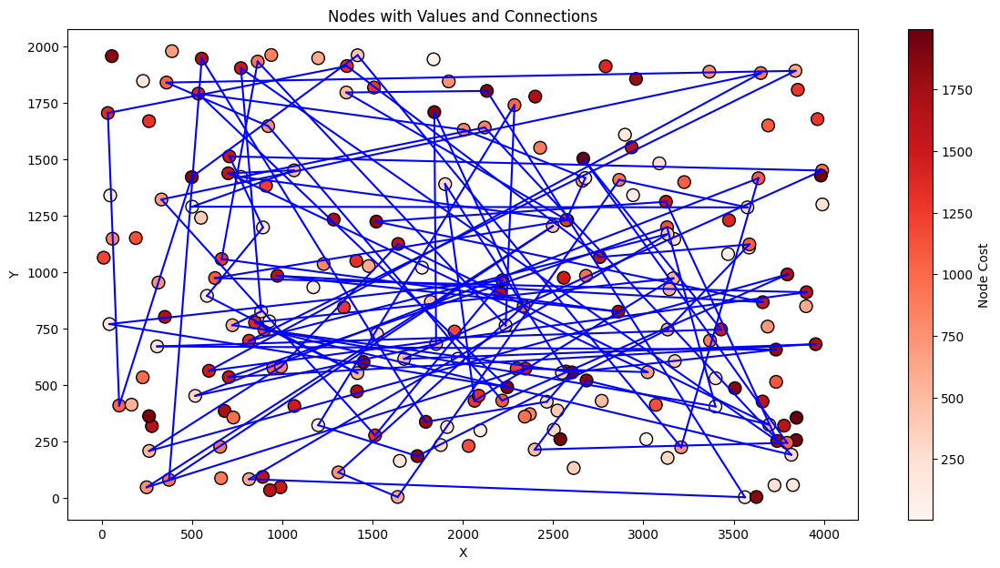

273509


In [13]:
start_solution, start_score = random_solution(distance_matrix, weights, start_node = 0)
plot_nodes_with_lines(df, start_solution)
print(start_score)

## Greedy Local Search

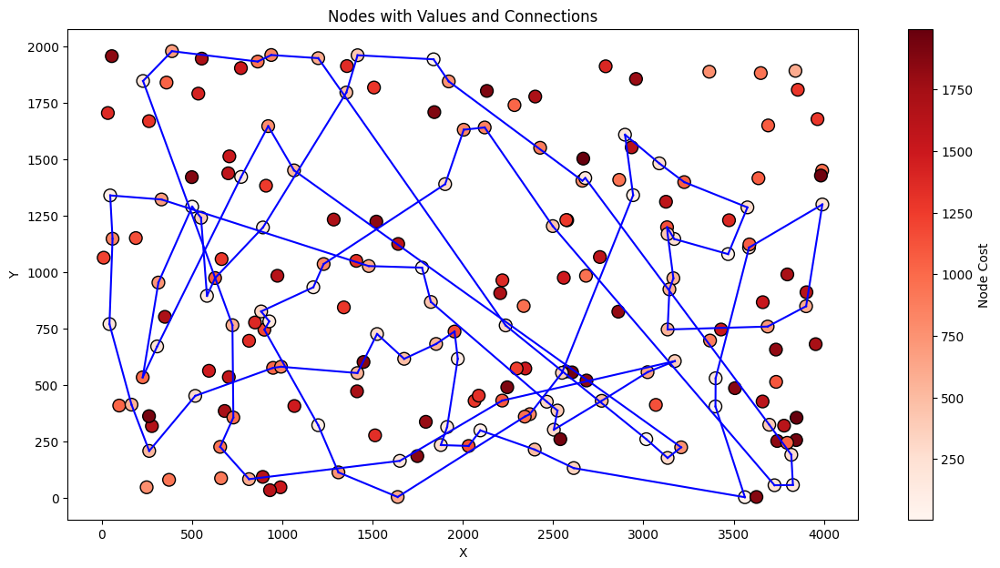

Acheived Total Score: 87896


In [14]:
def update_score_intra(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix):
    if int(abs(cycle_position - any_node_position)) > 1 and int(abs(cycle_position - any_node_position)) < 99:
        node_1 = solution[cycle_position]
        node_2 = solution[any_node_position]
        node_before_1 = solution[cycle_position-1]
        if cycle_position + 1 == num_cycle_nodes:
            node_after_1 = solution[0]
        else:
            node_after_1 = solution[cycle_position+1]

        node_before_2 = solution[any_node_position-1]
        if any_node_position + 1 == num_cycle_nodes:
            node_after_2 = solution[0]
        else:
            node_after_2 = solution[any_node_position+1]

        temp_score -= distance_matrix[node_1][node_before_1]
        temp_score -= distance_matrix[node_1][node_after_1]
        temp_score -= distance_matrix[node_2][node_before_2]
        temp_score -= distance_matrix[node_2][node_after_2]
        temp_score += distance_matrix[node_1][node_before_2]
        temp_score += distance_matrix[node_1][node_after_2]
        temp_score += distance_matrix[node_2][node_before_1]
        temp_score += distance_matrix[node_2][node_after_1]
    else:
        if cycle_position < any_node_position:
            cycle_position, any_node_position = any_node_position, cycle_position
        node_1 = solution[cycle_position]
        node_2 = solution[any_node_position]
        if cycle_position + 1 == num_cycle_nodes and any_node_position + 2 == num_cycle_nodes:
            node_after_1 = solution[0]
        elif cycle_position + 1 == num_cycle_nodes and any_node_position == 0:
            node_after_1 = solution[cycle_position - 1]
        else:
            node_after_1 = solution[cycle_position + 1]
        
        if cycle_position + 1 == num_cycle_nodes and any_node_position == 0:
            node_before_2 = solution[any_node_position + 1]
        else:
            node_before_2 = solution[any_node_position - 1]
        temp_score -= distance_matrix[node_1][node_after_1]
        temp_score -= distance_matrix[node_2][node_before_2]
        temp_score += distance_matrix[node_1][node_before_2]
        temp_score += distance_matrix[node_2][node_after_1]
    return temp_score


def node_intra_change(score, improvement, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix):
    temp_score = score
    temp_score = update_score_intra(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
    if temp_score < score:
        solution[cycle_position], solution[any_node_position] = solution[any_node_position], solution[cycle_position]
        score = temp_score
        improvement = True
    return score, improvement, solution

def update_score_inter(temp_score, solution, cycle_position, relative_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights):
    node_1 = solution[cycle_position]
    node_2 = remaining_nodes[relative_node_position]
    node_before = solution[cycle_position-1]
    if cycle_position + 1 == num_cycle_nodes:
        node_after = solution[0]
    else:
        node_after = solution[cycle_position+1]
    temp_score -= distance_matrix[node_1][node_before]
    temp_score -= distance_matrix[node_1][node_after]
    temp_score -= weights[node_1]
    temp_score += distance_matrix[node_2][node_before]
    temp_score += distance_matrix[node_2][node_after]
    temp_score += weights[node_2]
    return temp_score

def node_inter_change(score, improvement, solution, cycle_position, any_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights):
    temp_score = score
    relative_node_position = any_node_position - num_cycle_nodes
    temp_score = update_score_inter(temp_score, solution, cycle_position, relative_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights)
    if temp_score < score:
        solution[cycle_position], remaining_nodes[relative_node_position] = remaining_nodes[relative_node_position], solution[cycle_position]
        score = temp_score
        improvement = True
    return score, improvement, solution

def greedy_local_search(solution, score, distance_matrix, weights):
    all_node_positions = [i for i in range(len(weights))]
    cycle_positions = [i for i in range(len(solution))]
    remaining_nodes = list(set(all_node_positions) - set(solution))
    num_cycle_nodes = len(solution)
    moves = []
    for cycle_position in cycle_positions:
        for any_node in all_node_positions:
            if cycle_position != any_node:
                moves.append((cycle_position, any_node))
    improvement = True
    while improvement:
        improvement = False
        random.shuffle(moves)
        for cycle_position, any_node_position in moves:
            if any_node_position >= num_cycle_nodes:
                score, improvement, solution = node_inter_change(score, improvement, solution, cycle_position, any_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights)
            else:
                score, improvement, solution = node_intra_change(score, improvement, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
            if improvement:
                break
    return solution, score

solution, score = greedy_local_search(start_solution.copy(), start_score.copy(), distance_matrix, weights)
plot_nodes_with_lines(df, solution)
print(f"Acheived Total Score: {score}")

## Greedy Local Search Edges

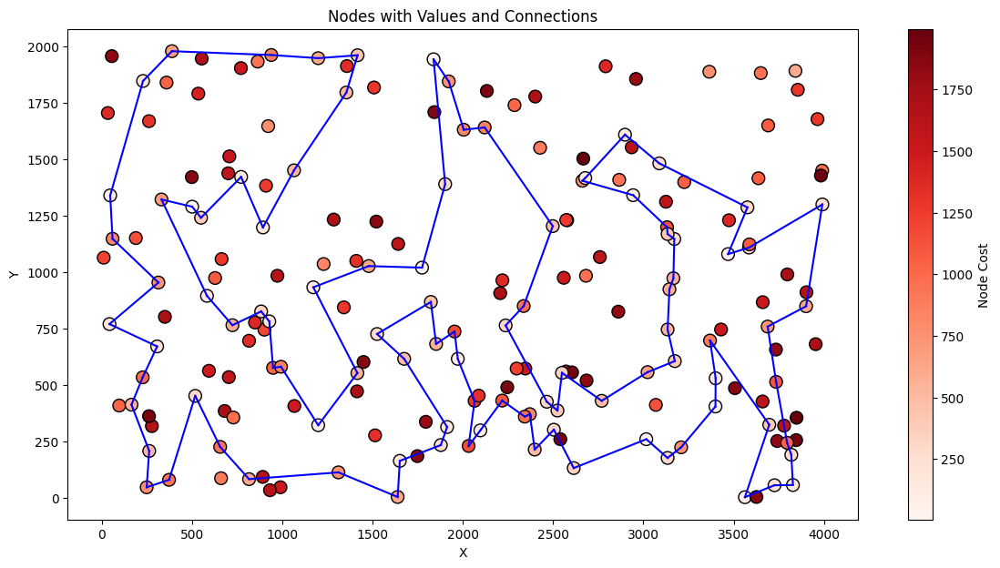

Acheived Total Score: 72807


In [15]:
def update_score_intra_edge(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix):
    # cycle position, any node position - positions of nodes in the solution that mark the beginning of selected edge
    temp_score -= distance_matrix[solution[cycle_position]][solution[cycle_position+1]]
    temp_score -= distance_matrix[solution[any_node_position]][solution[(any_node_position + 1) % num_cycle_nodes]]

    temp_score += distance_matrix[solution[cycle_position]][solution[any_node_position]]
    temp_score += distance_matrix[solution[cycle_position+1]][solution[(any_node_position + 1) % num_cycle_nodes]]
    return temp_score

def edge_intra_change(score, improvement, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix):
    temp_score = score
    temp_score = update_score_intra_edge(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
    if temp_score < score:
        solution[cycle_position+1:any_node_position+1] = solution[cycle_position+1:any_node_position+1][::-1]
        score = temp_score
        improvement = True

    return score, improvement, solution

def greedy_local_search_edges(solution, score, distance_matrix, weights):
    all_node_positions = [i for i in range(len(weights))]
    cycle_positions = [i for i in range(len(solution))]
    remaining_nodes = list(set(all_node_positions) - set(solution))
    remaining_positions = list(set(all_node_positions) - set(cycle_positions))
    num_cycle_nodes = len(solution)

    moves = []
    for cycle_position in cycle_positions:
        # Consider only inter moves for two-nodes exchange
        for any_node in remaining_positions:
            moves.append((cycle_position, any_node))

        # Consider intra edges for edge exchange (edge starting nodes added to moves)
        for any_node in range(cycle_position + 2, num_cycle_nodes):
            if (cycle_position == 0 and any_node == num_cycle_nodes - 1):
                continue
            moves.append((cycle_position, any_node))

    improvement = True
    while improvement:
        improvement = False
        random.shuffle(moves)
        for cycle_position, any_node_position in moves:
            if any_node_position >= num_cycle_nodes:
                score, improvement, solution = node_inter_change(score, improvement, solution, cycle_position, any_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights)
            else:
                score, improvement, solution = edge_intra_change(score, improvement, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
            if improvement:
                break
    return solution, score

solution, score = greedy_local_search_edges(start_solution.copy(), start_score.copy(), distance_matrix, weights)
plot_nodes_with_lines(df, solution)
print(f"Acheived Total Score: {score}")

## Steepest Local Search

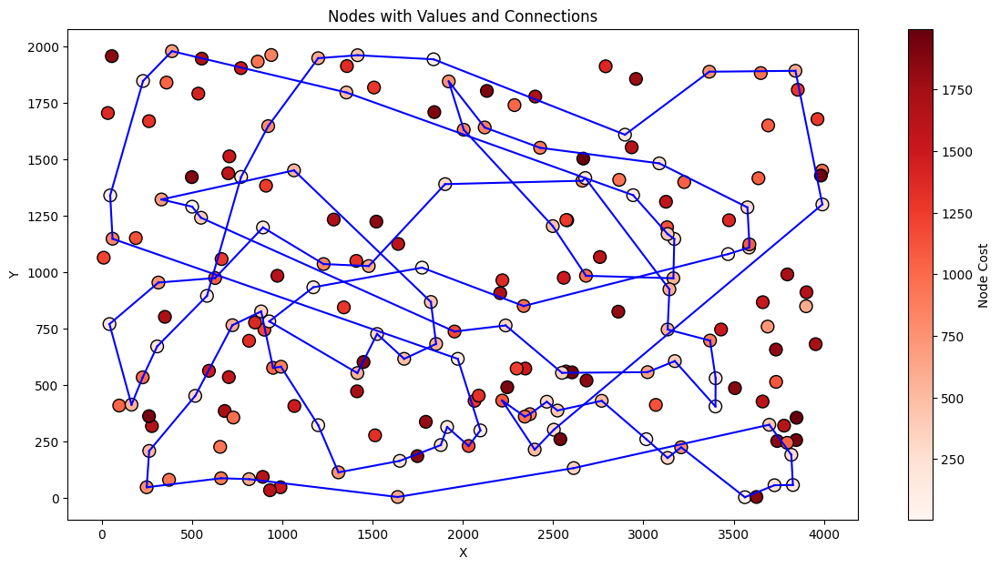

Acheived Total Score: 87969


In [16]:
def node_intra_change_steepest(score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix):
    temp_score = score
    temp_score = update_score_intra(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
    solution[cycle_position], solution[any_node_position] = solution[any_node_position], solution[cycle_position]
    return temp_score, solution

def node_inter_change_steepest(score, solution, cycle_position, any_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights):
    temp_score = score
    relative_node_position = any_node_position - num_cycle_nodes
    temp_score = update_score_inter(temp_score, solution, cycle_position, relative_node_position, remaining_nodes, num_cycle_nodes, distance_matrix, weights)
    solution[cycle_position], remaining_nodes[relative_node_position] = remaining_nodes[relative_node_position], solution[cycle_position]
    return temp_score, solution, remaining_nodes

def steepest_local_search(solution, score, distance_matrix, weights):
    all_node_positions = [i for i in range(len(weights))]
    cycle_positions = [i for i in range(len(solution))]
    remaining_nodes = list(set(all_node_positions) - set(solution))
    num_cycle_nodes = len(solution)
    moves = []
    for cycle_position in cycle_positions:
        for any_node in all_node_positions:
            if cycle_position != any_node:
                moves.append((cycle_position, any_node))

    improvement = True
    while improvement:
        improvement = False
        random.shuffle(moves)
        best_score = np.inf
        best_solution = None
        best_remaining_nodes = remaining_nodes.copy()
        for cycle_position, any_node_position in moves:
            if any_node_position >= num_cycle_nodes:
                temp_score, temp_solution, temp_remaining_nodes = node_inter_change_steepest(score, solution.copy(), cycle_position, any_node_position, remaining_nodes.copy(), num_cycle_nodes, distance_matrix, weights)
            else:
                temp_score = score
                temp_solution = solution.copy()
                temp_score, temp_solution = node_intra_change_steepest(score, solution.copy(), cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
                temp_remaining_nodes = remaining_nodes.copy()

            if temp_score < best_score:
                best_score = temp_score
                best_solution = temp_solution.copy()
                best_remaining_nodes = temp_remaining_nodes.copy()

        if best_score < score:
            score = best_score
            improvement = True
            solution = best_solution.copy()
            remaining_nodes = best_remaining_nodes.copy()

    return solution, score

solution, score = steepest_local_search(start_solution.copy(), start_score.copy(), distance_matrix, weights)
plot_nodes_with_lines(df, solution)
print(f"Acheived Total Score: {score}")

## Steepest Local Search Edges

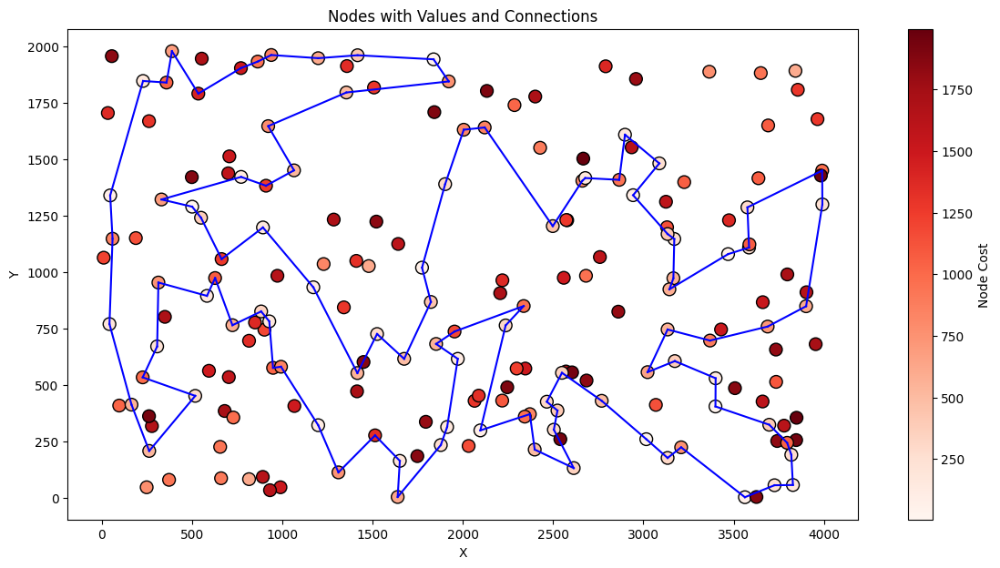

Achieved Total Score: 73902


In [17]:
def edge_intra_change_steepest(score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix):
    temp_score = score
    temp_score = update_score_intra_edge(temp_score, solution, cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
    solution[cycle_position+1:any_node_position+1] = solution[cycle_position+1:any_node_position+1][::-1]

    return temp_score, solution

def steepest_local_search_edges(solution, score, distance_matrix, weights):
    all_node_positions = [i for i in range(len(weights))]
    cycle_positions = [i for i in range(len(solution))]
    remaining_nodes = list(set(all_node_positions) - set(solution))
    remaining_positions = list(set(all_node_positions) - set(cycle_positions))
    num_cycle_nodes = len(solution)

    moves = []
    for cycle_position in cycle_positions:
        # Consider only inter moves for two-nodes exchange
        for any_node in remaining_positions:
            moves.append((cycle_position, any_node))

        # Consider intra edges for edge exchange (edge starting nodes added to moves)
        for any_node in range(cycle_position + 2, num_cycle_nodes):
            if (cycle_position == 0 and any_node == num_cycle_nodes - 1):
                continue
            moves.append((cycle_position, any_node))

    improvement = True
    while improvement:
        improvement = False
        random.shuffle(moves)
        best_score = np.inf
        best_solution = None
        best_remaining_nodes = remaining_nodes.copy()
        for cycle_position, any_node_position in moves:
            if any_node_position >= num_cycle_nodes:
                temp_score, temp_solution, temp_remaining_nodes = node_inter_change_steepest(score, solution.copy(), cycle_position, any_node_position, remaining_nodes.copy(), num_cycle_nodes, distance_matrix, weights)
            else:
                temp_score = score
                temp_solution = solution.copy()
                temp_score, temp_solution = edge_intra_change_steepest(score, solution.copy(), cycle_position, any_node_position, num_cycle_nodes, distance_matrix)
                temp_remaining_nodes = remaining_nodes.copy()

            if temp_score < best_score:
                best_score = temp_score
                best_solution = temp_solution.copy()
                best_remaining_nodes = temp_remaining_nodes.copy()

        if best_score < score:
            score = best_score
            improvement = True
            solution = best_solution.copy()
            remaining_nodes = best_remaining_nodes.copy()

    return solution, score

solution, score = steepest_local_search_edges(start_solution.copy(), start_score.copy(), distance_matrix, weights)
plot_nodes_with_lines(df, solution)
print(f"Achieved Total Score: {score}")

## Experiments

In [18]:
def test_algorithm(algorithm, distance_matrix, weights, local_algorithm = None):
    '''
    Tests chosen algorithm for each node.

    Parameters:
    local_algorithm: function of the local search
    algorithm: Function to test
    distance_matrix: numpy.array containing distances between nodes.
    weights: numpy.array containing the weights associated with each node.
    num_runs: integer, number of tests per node (default: 200)
    '''
    all_nodes = [i for i in range(len(weights))]
    results = {}
    intermidiate_results = {}
    solutions = {}
    times = []
    for node in all_nodes:
        solution, score = algorithm(distance_matrix, weights, node)
        intermidiate_results[node] = score
        if local_algorithm is not None:
            start_time = time.time()
            solution, score = local_algorithm(solution, score, distance_matrix, weights)
            end_time = time.time()
            times.append(end_time - start_time)
        solutions[node] = solution
        results[node] = score
    return solutions, intermidiate_results, results, times

In [19]:
del df
del weights
del distance_matrix

### Instance A

In [20]:
df_A = pd.read_csv(TSPA_PATH, sep=";", header=None)
df_A.columns = ["x", "y", "val"]
distance_matrix_A = get_distance_matrix(df_A, euclidean_distance)
weights_A = df_A.val.to_numpy()

In [21]:
random_greedy_local_solution_A, random_greedy_local_intermidiate_A, random_greedy_local_result_A, random_greedy_local_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = greedy_local_search)

In [22]:
random_steepest_solution_A, random_steepest_intermidiate_A, random_steepest_result_A, random_steepest_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = steepest_local_search)

In [23]:
random_edge_greedy_local_solution_A, random_edge_greedy_local_intermidiate_A, random_edge_greedy_local_result_A, random_edge_greedy_local_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = greedy_local_search_edges)

In [24]:
random_edge_steepest_local_solution_A, random_edge_steepest_local_intermidiate_A, random_edge_steepest_local_result_A, random_edge_steepest_local_times_A = test_algorithm(random_solution, distance_matrix_A, weights_A, local_algorithm = steepest_local_search_edges)

In [25]:
weighted_greedy_local_solution_A, weighted_greedy_local_intermidiate_A, weighted_greedy_local_result_A, weighted_greedy_local_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = greedy_local_search)

In [26]:
weighted_steepest_solution_A, weighted_steepest_intermidiate_A, weighted_steepest_result_A, weighted_steepest_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = steepest_local_search)

In [27]:
weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_intermidiate_A, weighted_edges_greedy_local_result_A, weighted_edges_greedy_local_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = greedy_local_search_edges)

In [28]:
weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_intermidiate_A, weighted_edges_steepest_local_result_A, weighted_edges_steepest_local_times_A = test_algorithm(greedy_regret_cycle_weighted, distance_matrix_A, weights_A, local_algorithm = steepest_local_search_edges)

### Instance B

In [29]:
df_B = pd.read_csv(TSPB_PATH, sep=";", header=None)
df_B.columns = ["x", "y", "val"]
distance_matrix_B = get_distance_matrix(df_B, euclidean_distance)
weights_B = df_B.val.to_numpy()

In [30]:
random_greedy_local_solution_B, random_greedy_local_intermidiate_B, random_greedy_local_result_B, random_greedy_local_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = greedy_local_search)

In [31]:
random_steepest_solution_B, random_steepest_intermidiate_B, random_steepest_result_B, random_steepest_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = steepest_local_search)

In [32]:
random_edge_greedy_local_solution_B, random_edge_greedy_local_intermidiate_B, random_edge_greedy_local_result_B, random_edge_greedy_local_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = greedy_local_search_edges)

In [33]:
random_edge_steepest_local_solution_B, random_edge_steepest_local_intermidiate_B, random_edge_steepest_local_result_B, random_edge_steepest_local_times_B = test_algorithm(random_solution, distance_matrix_B, weights_B, local_algorithm = steepest_local_search_edges)

In [34]:
nn_greedy_local_solution_B, nn_greedy_local_intermidiate_B, nn_greedy_local_result_B, nn_greedy_local_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = greedy_local_search)

In [35]:
nn_steepest_solution_B, nn_steepest_intermidiate_B, nn_steepest_result_B, nn_steepest_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = steepest_local_search)

In [36]:
nn_edges_greedy_local_solution_B, nn_edges_greedy_local_intermidiate_B, nn_edges_greedy_local_result_B, nn_edges_greedy_local_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = greedy_local_search_edges)

In [37]:
nn_edges_steepest_local_solution_B, nn_edges_steepest_local_intermidiate_B, nn_edges_steepest_local_result_B, nn_edges_steepest_local_times_B = test_algorithm(nearest_neighbor_all, distance_matrix_B, weights_B, local_algorithm = steepest_local_search_edges)

## Results - Instance A

In [38]:
def plot_nodes_with_lines_and_score(df, score, connections=None):
    """
    Plots nodes with optional lines connecting them, using a color scale to represent values.
    
    Parameters:
    df: DataFrame of nodes, each with 'x', 'y', and 'val'.
    connections: list of node indices in the DataFrame to connect in order.
    """
    plt.figure(figsize=(14, 7))
    norm = plt.Normalize(vmin=df.val.min(), vmax=df.val.max())
    colors = cm.Reds(norm(df.val))
    scatter = plt.scatter(df.x, df.y, c=df.val, cmap='Reds', s=100, edgecolors='black')

    if connections is not None:
        for start, end in zip(connections[:-1], connections[1:]):
            plt.plot([df.x[start], df.x[end]], [df.y[start], df.y[end]], color='blue')
        plt.plot([df.x[connections[-1]], df.x[connections[0]]], [df.y[connections[-1]], df.y[connections[0]]], color='blue')
    cbar = plt.colorbar(scatter)
    cbar.set_label('Node Cost')

    plt.xlabel('X')
    plt.ylabel('Y')
    title = f'Nodes with Color-Scaled Values, Score: {score}' if connections is None else f'Nodes with Color-Scaled Values, Score: {score}'
    plt.title(title)
    plt.grid(False)
    plt.show()

def plot_score_distribution(score_dict, label, title, x_label):
    all_scores = []
    if type(score_dict) == dict:
        for key in score_dict.keys():
            item = score_dict[key]
            all_scores.append(item)
    else:
        all_scores = score_dict
    plt.hist(all_scores, bins=30, density=True, edgecolor='black', color="black", alpha=0.7)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Relative Frequency')
    plt.show()

def plot_score_distributions(score_dict_1, score_dict_2, labels, title = 'Continuous Distribution of Scores Across Different Nodes', x_label = 'Score Value'):
    all_scores_1 = []
    for key in score_dict_1.keys():
        item = score_dict_1[key]
        all_scores_1.append(item)

    all_scores_2 = []
    for key in score_dict_2.keys():
        item = score_dict_2[key]
        all_scores_2.append(item)
    
    plt.figure(figsize=(10, 6))
    
    sns.kdeplot(all_scores_1, label=labels[0], color='black', linewidth=2)
    sns.kdeplot(all_scores_2, label=labels[1], color='red', linewidth=2)
    plt.xscale('log')
    
    # Add titles and labels
    plt.title(title, fontsize=14)
    plt.xlabel(x_label, fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend(loc='upper right')
    plt.show()

In [39]:
def plot_best_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmin(all_scores)
    best_solution = all_solutions[best_overall]
    print("___________________________________________________________________")
    print(f"For Node: {best_overall}")
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)
    print(f"Best solution: {best_solution}")

def plot_average_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)

    all_scores = np.array(all_scores)
    median_index = np.argsort(all_scores)[len(all_scores) // 2]
    median_solution = all_solutions[median_index]
    
    print("___________________________________________________________________")
    print(f"For Node: {median_index}")
    plot_nodes_with_lines_and_score(df, all_scores[median_index], median_solution)

def plot_worst_overall(df, solutions, results):
    all_scores = []
    for key in results.keys():
        item = results[key]    
        all_scores.append(item)
    
    all_solutions = []
    for key in solutions.keys():
        item = solutions[key]
        all_solutions.append(item)
    
    all_scores = np.array(all_scores)
    best_overall = np.argmax(all_scores)
    best_solution = all_solutions[best_overall]
    print("___________________________________________________________________")
    print(f"For Node: {best_overall}")
    plot_nodes_with_lines_and_score(df, all_scores[best_overall], best_solution)


def calculate_stats_overall(results):
    all_scores = []
    if type(results) == dict:
        for key in results.keys():
            all_scores.append(results[key])
    else:
        all_scores = results
    all_scores = np.array(all_scores)
    min_value = np.min(all_scores)
    max_value = np.max(all_scores)
    median_value = np.median(all_scores)
    mean_value = np.mean(all_scores)
    std_deviation = np.std(all_scores)
    return min_value, max_value, median_value, mean_value, std_deviation


def plot_node(df, scores, solutions, node):
    score = scores[node]
    connections = solutions[node]
    print(f"Plotting Node: {node}")
    plot_nodes_with_lines_and_score(df, score, connections)

def compare_improvement(result, improved_result):
    initial_results = []
    improved_results = []
    for key in result:
        val = result[key]
        initial_results.append(val)
        val = improved_result[key]
        improved_results.append(val)
    initial_arr = np.array(initial_results)
    improved_arr = np.array(improved_results)
    differences = initial_arr - improved_arr
    min_val = np.min(differences)
    max_val = np.max(differences)
    mean = np.mean(differences)
    median = np.median(differences)
    std = np.std(differences)
    relative = np.mean(differences/initial_arr)
    return min_val, max_val, mean, median, std, relative

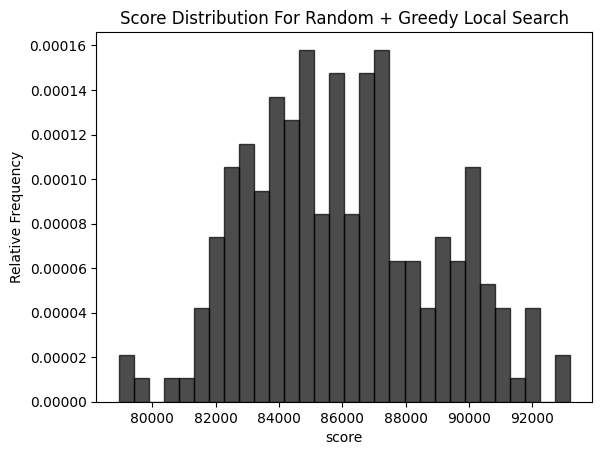

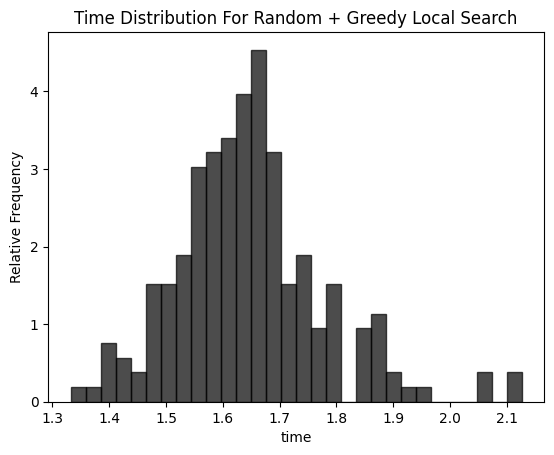

___________________________________________________________________
For Node: 194


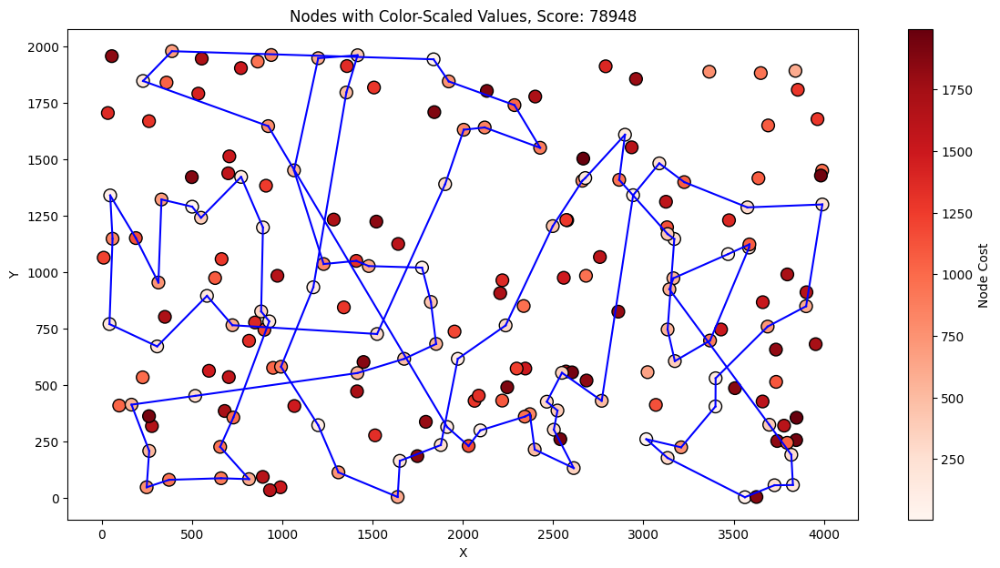

Best solution: [117, 143, 0, 59, 149, 123, 127, 70, 135, 154, 63, 94, 148, 9, 62, 144, 102, 178, 106, 57, 92, 179, 40, 119, 185, 52, 55, 31, 113, 175, 171, 16, 44, 120, 25, 78, 145, 196, 81, 90, 165, 138, 14, 49, 2, 152, 97, 1, 101, 75, 86, 26, 100, 53, 158, 180, 68, 18, 108, 183, 89, 114, 15, 186, 23, 137, 151, 43, 42, 160, 34, 146, 22, 195, 181, 159, 193, 41, 139, 115, 116, 65, 35, 84, 112, 4, 190, 10, 177, 54, 184, 162, 133, 79, 80, 176, 51, 109, 118, 46]
___________________________________________________________________
For Node: 109


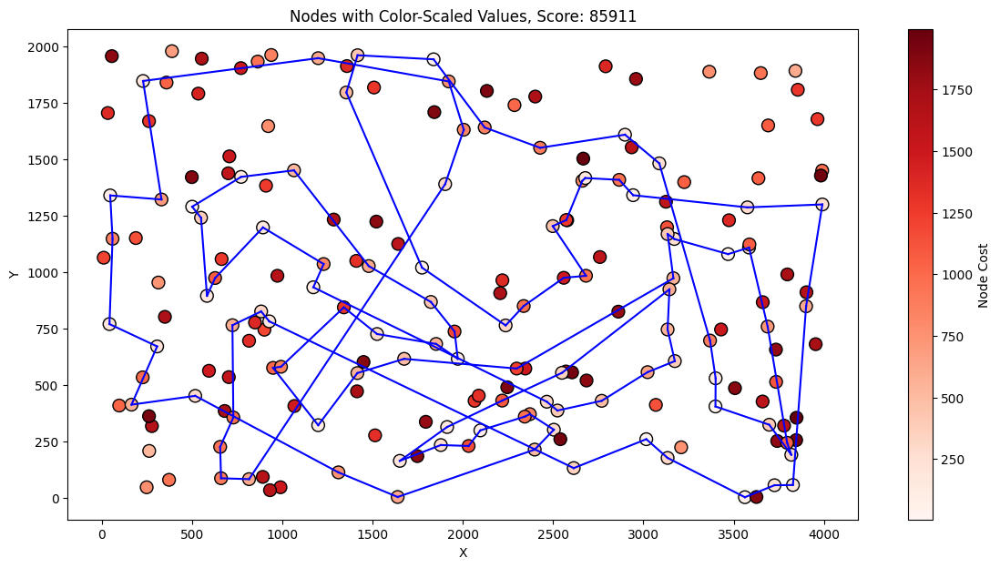

___________________________________________________________________
For Node: 14


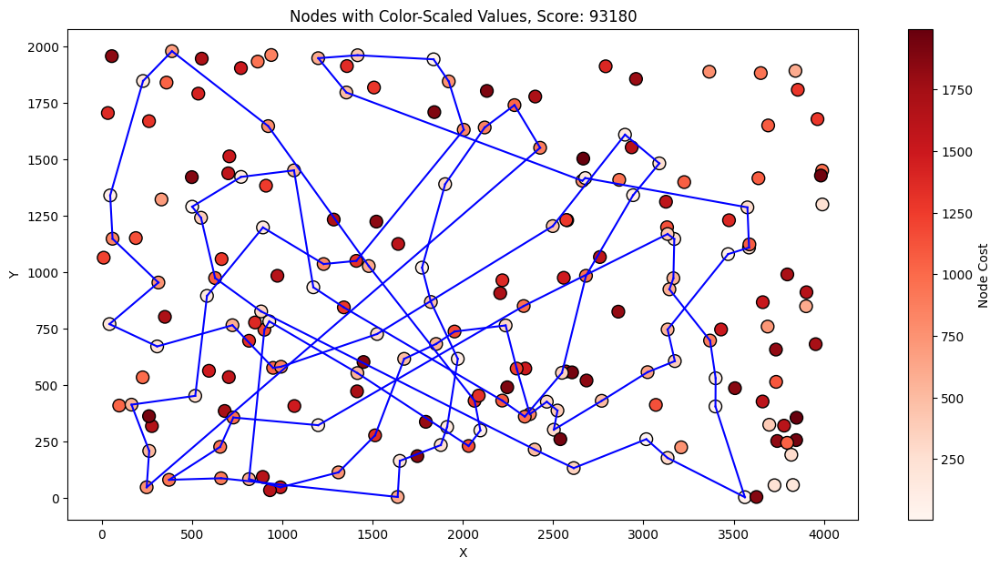

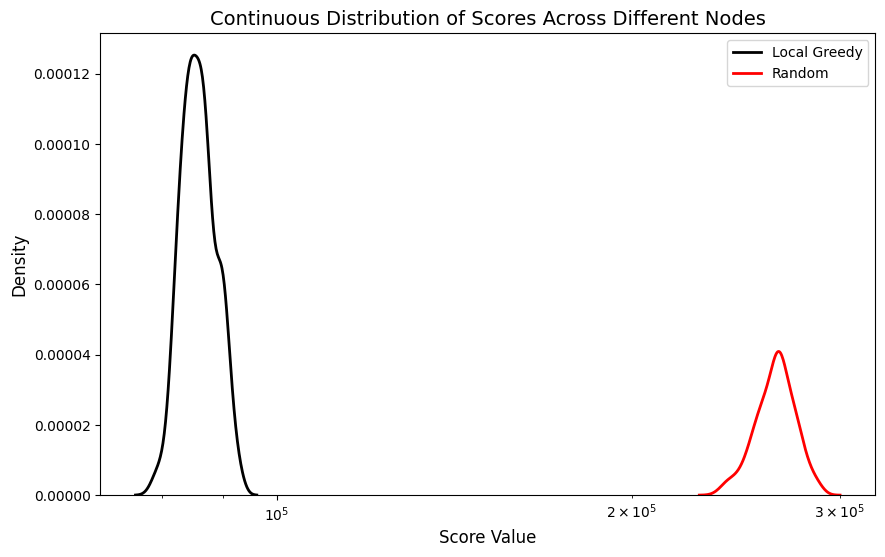

Overall Stats: 
 Minimum: 78948 Maximum: 93180 Median: 85909.0 Mean: 86008.445 Standard Deviation: 2891.9487680411976
Time Stats: 
 Minimum: 1.3323068618774414 Maximum: 2.1259970664978027 Median: 1.6379886865615845 Mean: 1.6462321770191193 Standard Deviation: 0.1309690891075098
Comparison Stats: 
 Minimum: 150800 Maximum: 207327 Median: 179894.0 Mean: 179098.545 Standard Deviation: 10332.48634540472 and Relative: 0.6751155878795859


In [40]:
plot_score_distribution(random_greedy_local_result_A, label="Random + Greedy Local Search", title = "Score Distribution For Random + Greedy Local Search", x_label = "score")
plot_score_distribution(random_greedy_local_times_A, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search", x_label = "time")
plot_best_overall(df_A, random_greedy_local_solution_A, random_greedy_local_result_A)
plot_average_overall(df_A, random_greedy_local_solution_A, random_greedy_local_result_A)
plot_worst_overall(df_A, random_greedy_local_solution_A, random_greedy_local_result_A)
plot_score_distributions(random_greedy_local_result_A, random_greedy_local_intermidiate_A, labels = ["Local Greedy", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_greedy_local_intermidiate_A, random_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

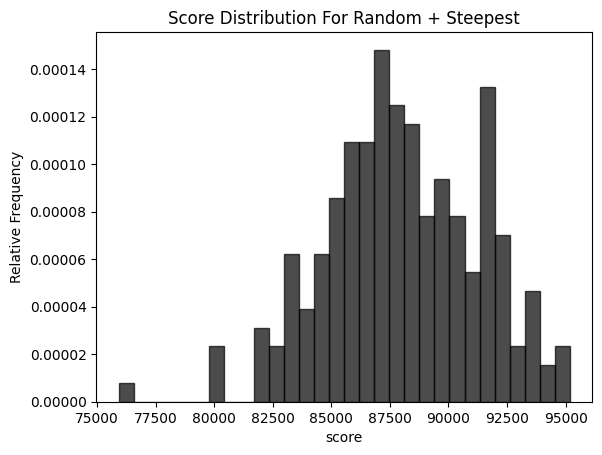

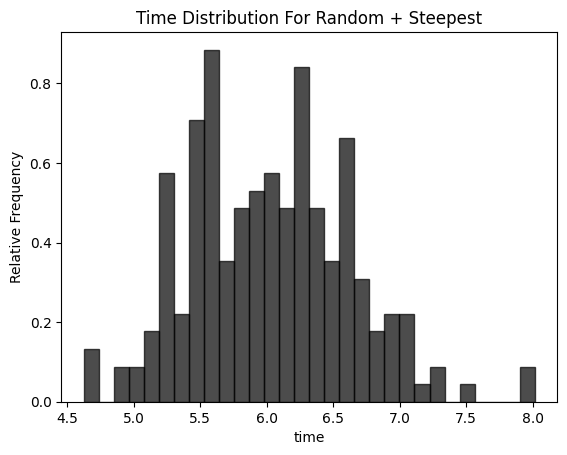

___________________________________________________________________
For Node: 57


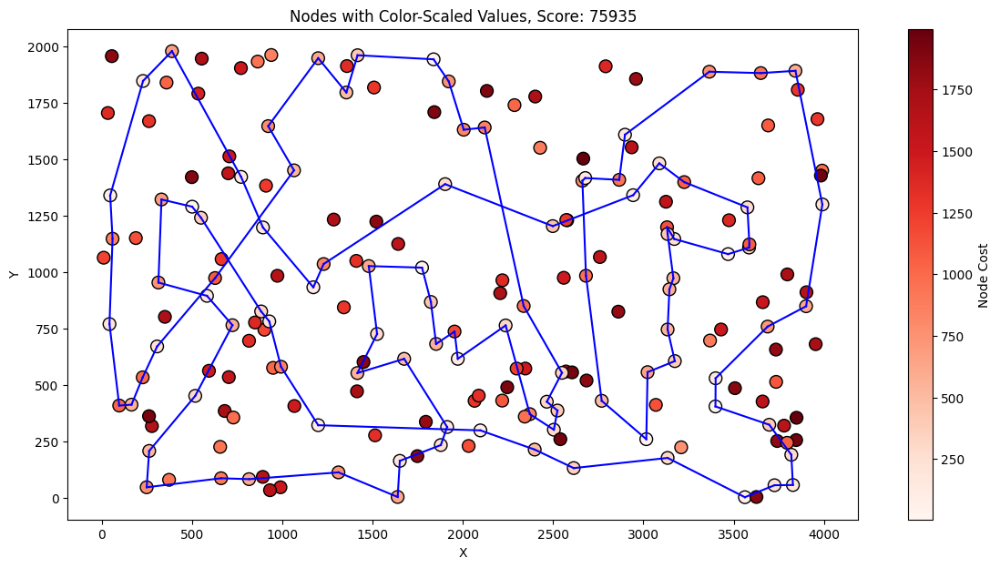

Best solution: [167, 2, 120, 129, 92, 57, 55, 52, 178, 3, 106, 185, 40, 119, 165, 138, 14, 49, 148, 137, 118, 59, 115, 139, 108, 18, 22, 146, 34, 30, 54, 48, 160, 5, 46, 68, 117, 0, 143, 183, 89, 23, 186, 124, 152, 97, 1, 101, 26, 94, 63, 122, 79, 80, 176, 51, 151, 162, 133, 180, 154, 135, 70, 127, 112, 4, 10, 177, 184, 43, 42, 181, 159, 193, 41, 116, 65, 149, 123, 53, 86, 75, 44, 16, 171, 175, 113, 31, 78, 145, 196, 81, 90, 164, 7, 21, 144, 102, 62, 9]
___________________________________________________________________
For Node: 4


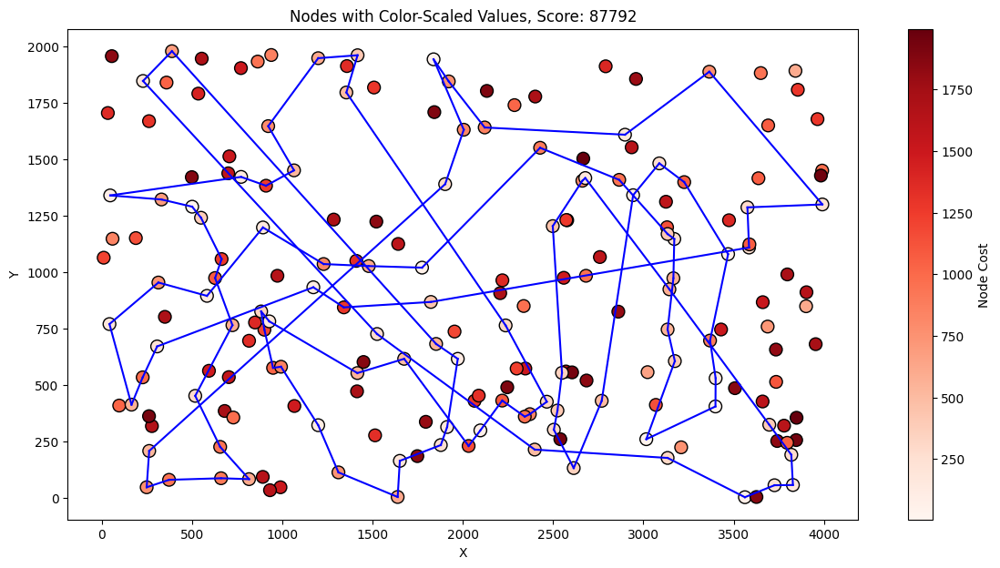

___________________________________________________________________
For Node: 80


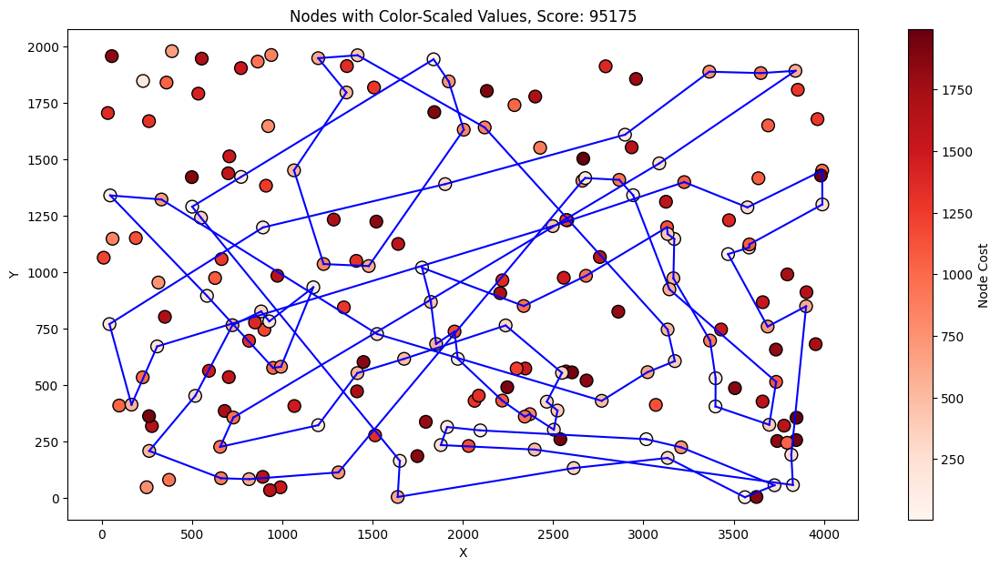

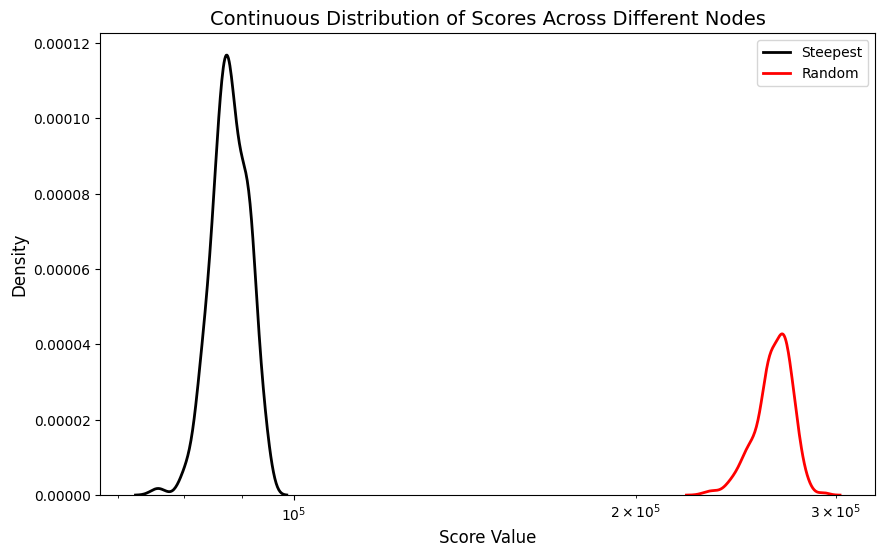

Overall Stats: 
 Minimum: 75935 Maximum: 95175 Median: 87791.5 Mean: 87997.915 Standard Deviation: 3260.055121892113
Time Stats: 
 Minimum: 4.624544858932495 Maximum: 8.015279054641724 Median: 6.01550555229187 Mean: 6.020336745977402 Standard Deviation: 0.5986155047224865
Comparison Stats: 
 Minimum: 137941 Maximum: 206044 Median: 177303.5 Mean: 177142.985 Standard Deviation: 10540.763337385722 and Relative: 0.667597880624223


In [41]:
plot_score_distribution(random_steepest_result_A, label="Random + Steepest", title = "Score Distribution For Random + Steepest", x_label = "score")
plot_score_distribution(random_steepest_times_A, label="Times Random + Steepest", title = "Time Distribution For Random + Steepest", x_label = "time")
plot_best_overall(df_A, random_steepest_solution_A, random_steepest_result_A)
plot_average_overall(df_A, random_steepest_solution_A, random_steepest_result_A)
plot_worst_overall(df_A, random_steepest_solution_A, random_steepest_result_A)
plot_score_distributions(random_steepest_result_A, random_steepest_intermidiate_A, labels = ["Steepest", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_steepest_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_steepest_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_steepest_intermidiate_A, random_steepest_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

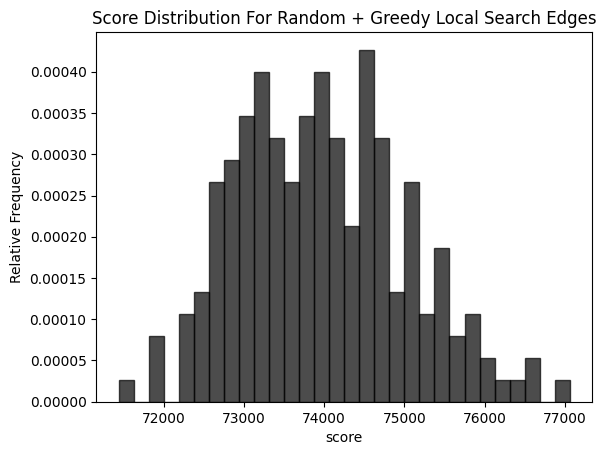

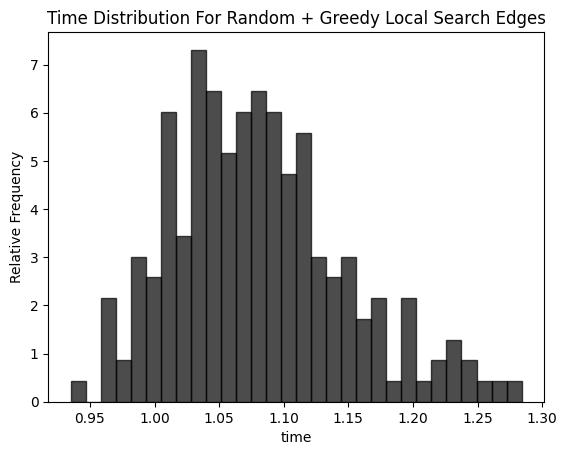

___________________________________________________________________
For Node: 96


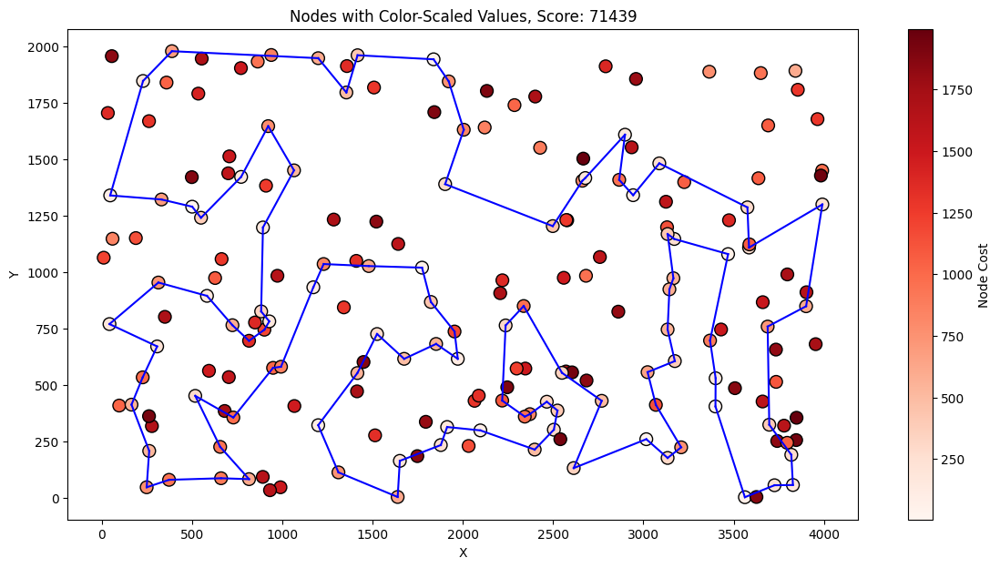

Best solution: [159, 22, 18, 108, 117, 0, 143, 183, 89, 23, 137, 148, 9, 62, 144, 102, 49, 14, 165, 40, 90, 81, 196, 31, 113, 175, 171, 16, 78, 145, 179, 185, 106, 178, 52, 55, 57, 92, 129, 82, 25, 44, 120, 75, 2, 152, 124, 94, 121, 100, 26, 97, 1, 101, 86, 53, 180, 154, 135, 70, 127, 123, 162, 151, 133, 79, 63, 122, 80, 176, 51, 118, 59, 149, 131, 35, 184, 84, 112, 4, 190, 10, 177, 54, 48, 160, 34, 181, 42, 43, 77, 47, 65, 116, 115, 46, 68, 139, 41, 193]
___________________________________________________________________
For Node: 190


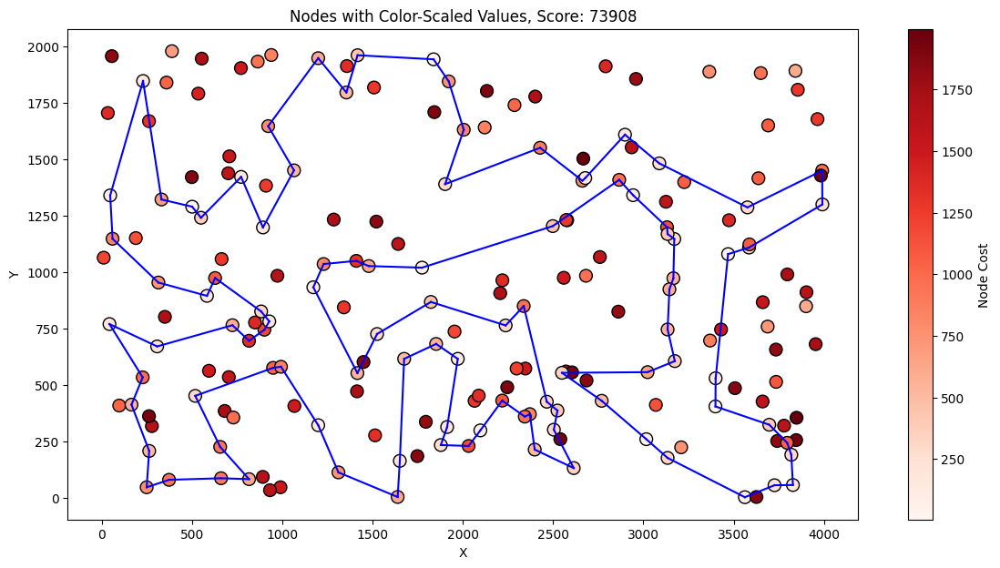

___________________________________________________________________
For Node: 195


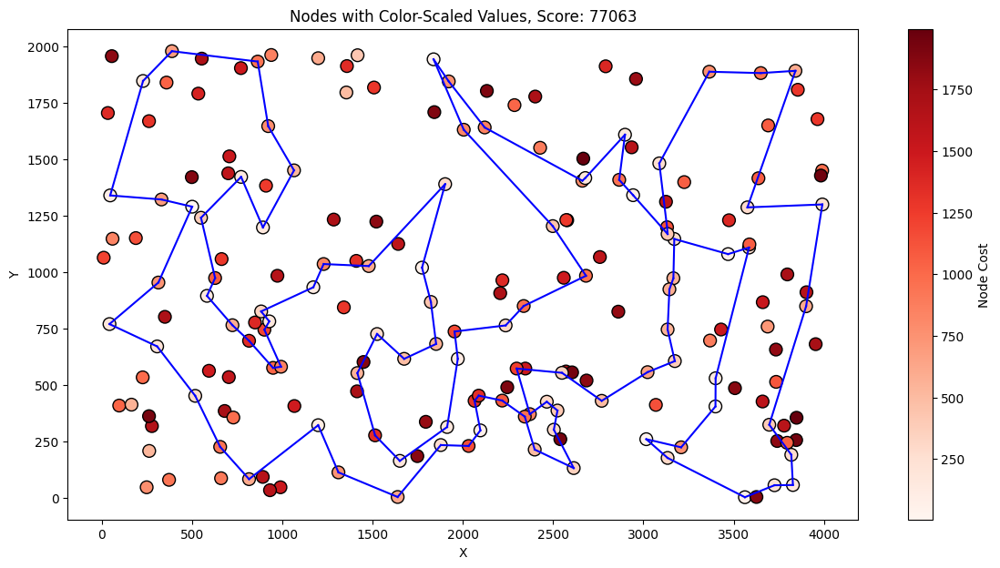

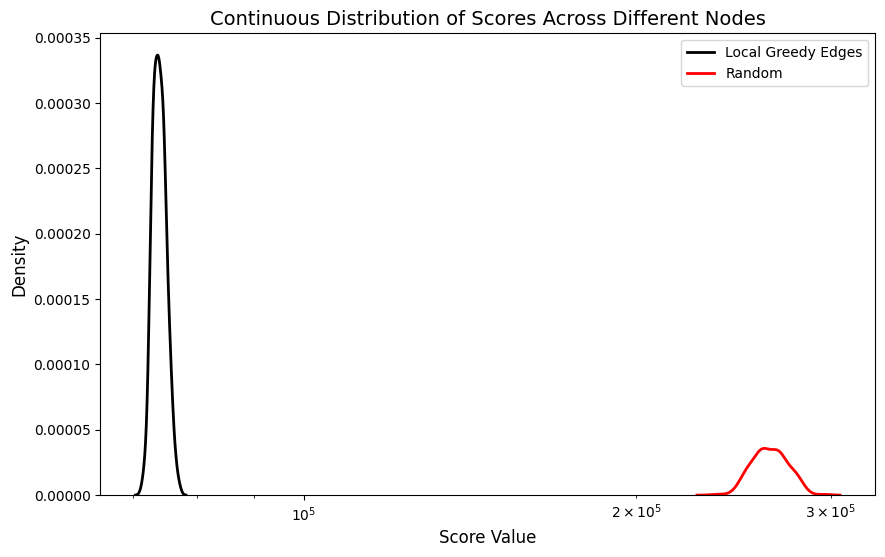

Overall Stats: 
 Minimum: 71439 Maximum: 77063 Median: 73906.5 Mean: 73971.52 Standard Deviation: 1038.6567862388422
Time Stats: 
 Minimum: 0.9351365566253662 Maximum: 1.2840776443481445 Median: 1.0720781087875366 Mean: 1.0802178132534026 Standard Deviation: 0.06683793589821027
Comparison Stats: 
 Minimum: 160619 Maximum: 220677 Median: 190873.0 Mean: 190843.74 Standard Deviation: 9669.333539205274 and Relative: 0.720301758534834


In [43]:
plot_score_distribution(random_edge_greedy_local_result_A, label="Random + Greedy Local Search (Edges)", title = "Score Distribution For Random + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(random_edge_greedy_local_times_A, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_A, random_edge_greedy_local_solution_A, random_edge_greedy_local_result_A)
plot_average_overall(df_A, random_edge_greedy_local_solution_A, random_edge_greedy_local_result_A)
plot_worst_overall(df_A, random_edge_greedy_local_solution_A, random_edge_greedy_local_result_A)
plot_score_distributions(random_edge_greedy_local_result_A, random_edge_greedy_local_intermidiate_A, labels = ["Local Greedy Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_greedy_local_intermidiate_A, random_edge_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

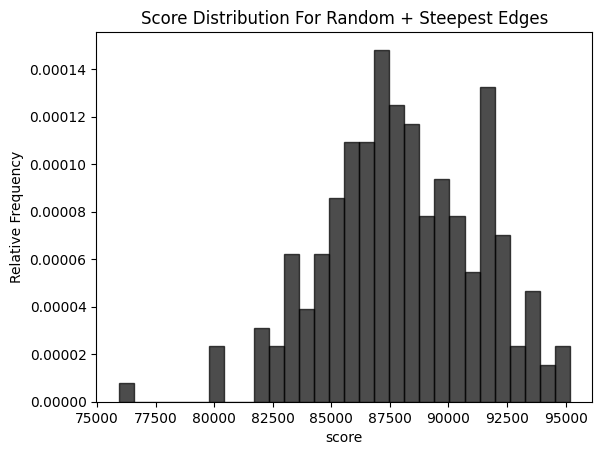

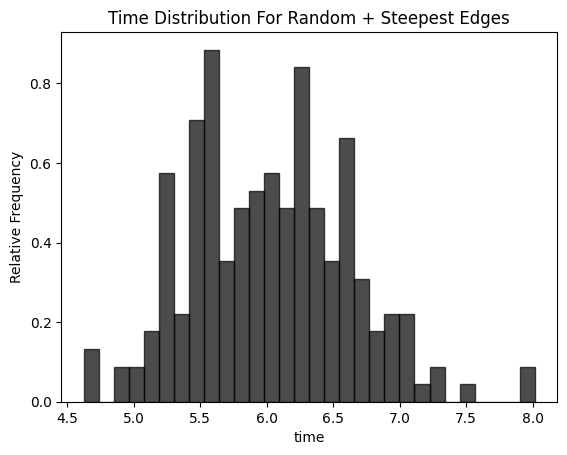

___________________________________________________________________
For Node: 159


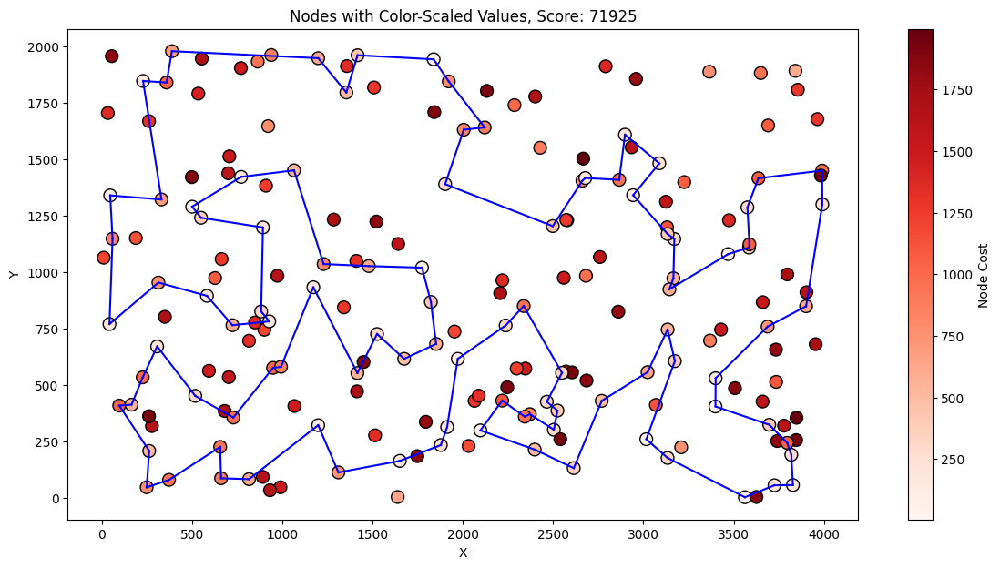

Best solution: [159, 22, 146, 34, 181, 42, 43, 65, 116, 115, 41, 193, 139, 46, 118, 51, 176, 80, 79, 133, 151, 162, 59, 149, 131, 35, 184, 160, 48, 54, 30, 177, 10, 190, 84, 4, 112, 123, 127, 135, 154, 180, 63, 94, 124, 152, 97, 1, 101, 26, 100, 121, 53, 86, 75, 2, 129, 57, 92, 120, 44, 16, 171, 175, 113, 56, 31, 78, 145, 196, 81, 90, 27, 39, 165, 119, 40, 185, 55, 52, 106, 178, 49, 14, 144, 102, 62, 9, 148, 137, 23, 186, 89, 183, 143, 0, 117, 108, 69, 18]
___________________________________________________________________
For Node: 139


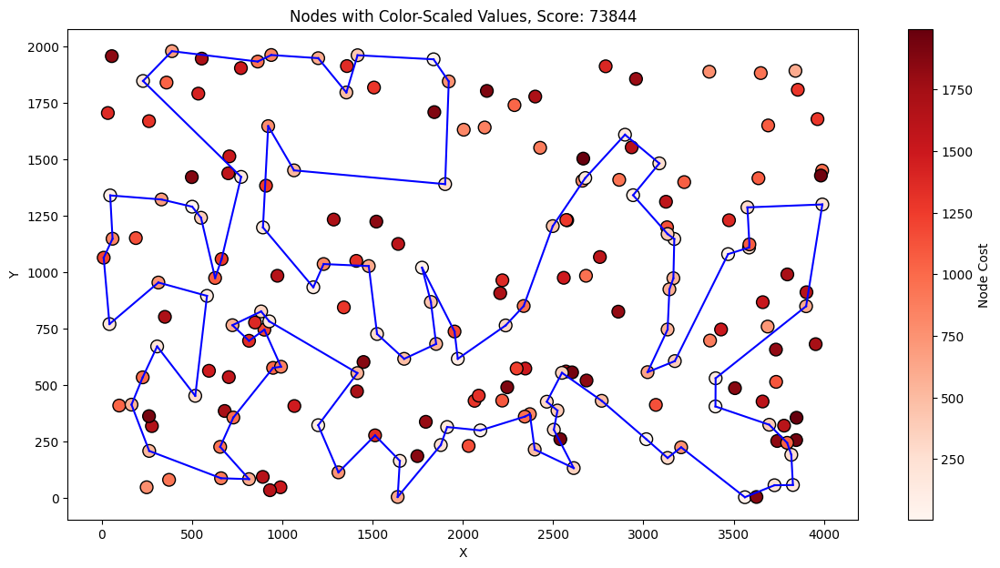

___________________________________________________________________
For Node: 131


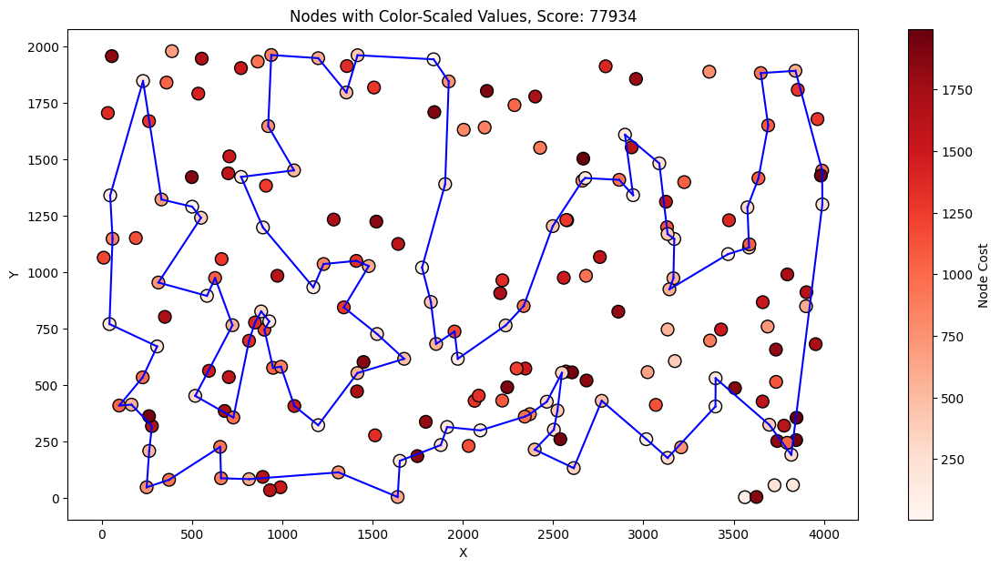

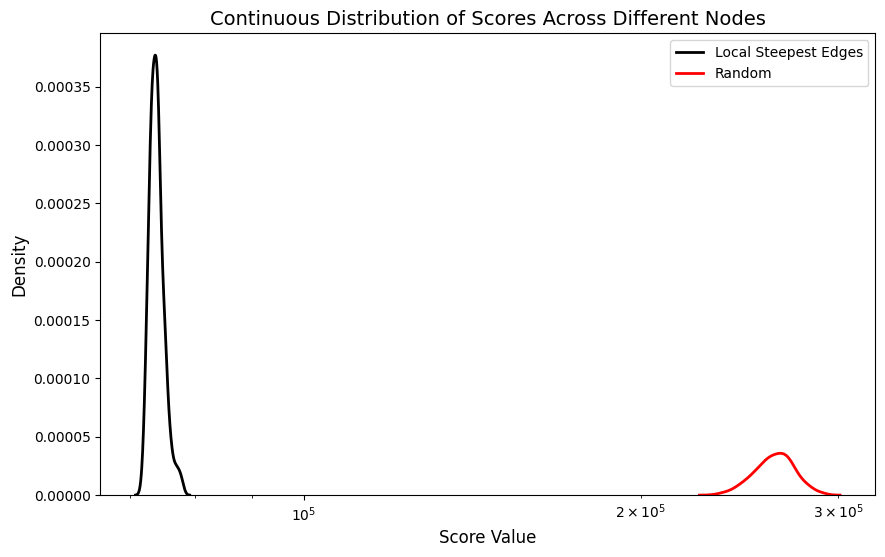

Overall Stats: 
 Minimum: 71925 Maximum: 77934 Median: 73842.0 Mean: 73958.53 Standard Deviation: 1113.0677783046278
Time Stats: 
 Minimum: 2.80607008934021 Maximum: 3.8070149421691895 Median: 3.3028091192245483 Mean: 3.3331278491020204 Standard Deviation: 0.17903761195542084
Comparison Stats: 
 Minimum: 162483 Maximum: 215840 Median: 190592.0 Mean: 189871.225 Standard Deviation: 10379.552371098427 and Relative: 0.7192535188756745


In [44]:
plot_score_distribution(random_steepest_result_A, label="Random + Steepest (Edges)", title = "Score Distribution For Random + Steepest Edges", x_label = "score")
plot_score_distribution(random_steepest_times_A, label="Times Random + Steepest (Edges)", title = "Time Distribution For Random + Steepest Edges", x_label = "time")
plot_best_overall(df_A, random_edge_steepest_local_solution_A, random_edge_steepest_local_result_A)
plot_average_overall(df_A, random_edge_steepest_local_solution_A, random_edge_steepest_local_result_A)
plot_worst_overall(df_A, random_edge_steepest_local_solution_A, random_edge_steepest_local_result_A)
plot_score_distributions(random_edge_steepest_local_result_A, random_edge_steepest_local_intermidiate_A, labels = ["Local Steepest Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_steepest_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_steepest_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_steepest_local_intermidiate_A, random_edge_steepest_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

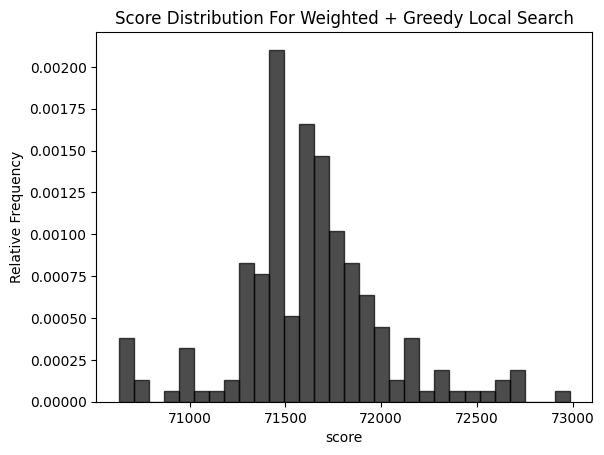

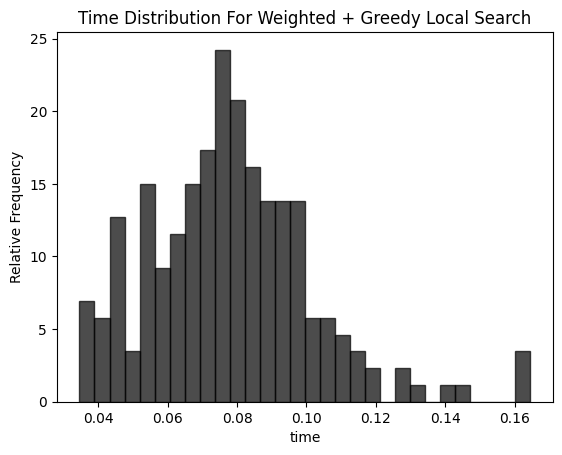

___________________________________________________________________
For Node: 153


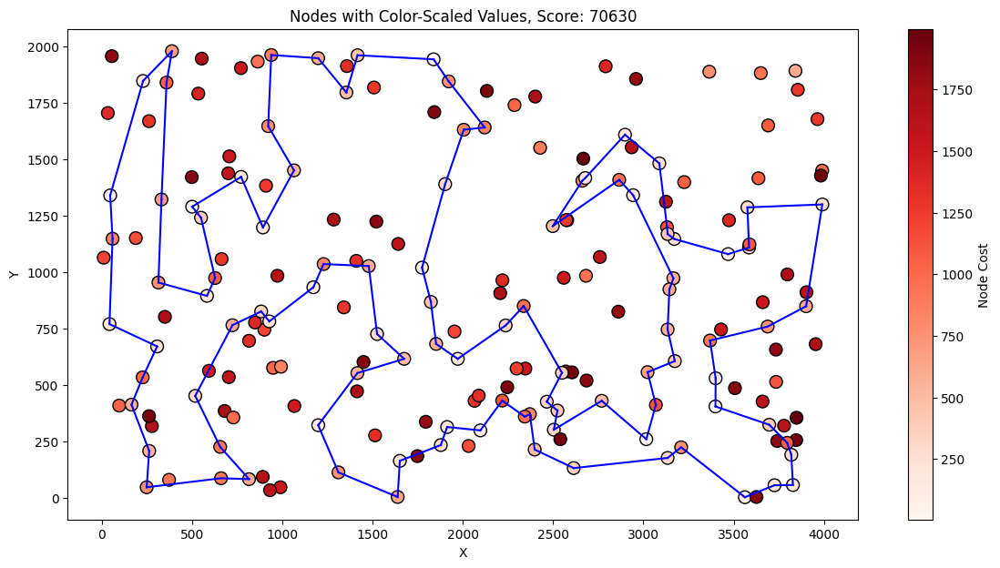

Best solution: [0, 117, 93, 68, 46, 115, 139, 193, 41, 5, 42, 181, 159, 69, 108, 18, 22, 146, 34, 160, 48, 54, 177, 10, 4, 112, 84, 184, 43, 116, 65, 59, 118, 51, 151, 133, 162, 123, 127, 70, 135, 154, 180, 53, 121, 100, 26, 86, 75, 44, 25, 16, 171, 175, 113, 56, 31, 78, 145, 179, 196, 81, 90, 165, 40, 185, 106, 178, 3, 14, 144, 62, 9, 148, 102, 49, 52, 55, 57, 92, 129, 82, 120, 2, 101, 1, 97, 152, 124, 94, 63, 79, 80, 176, 137, 23, 186, 89, 183, 143]
___________________________________________________________________
For Node: 47


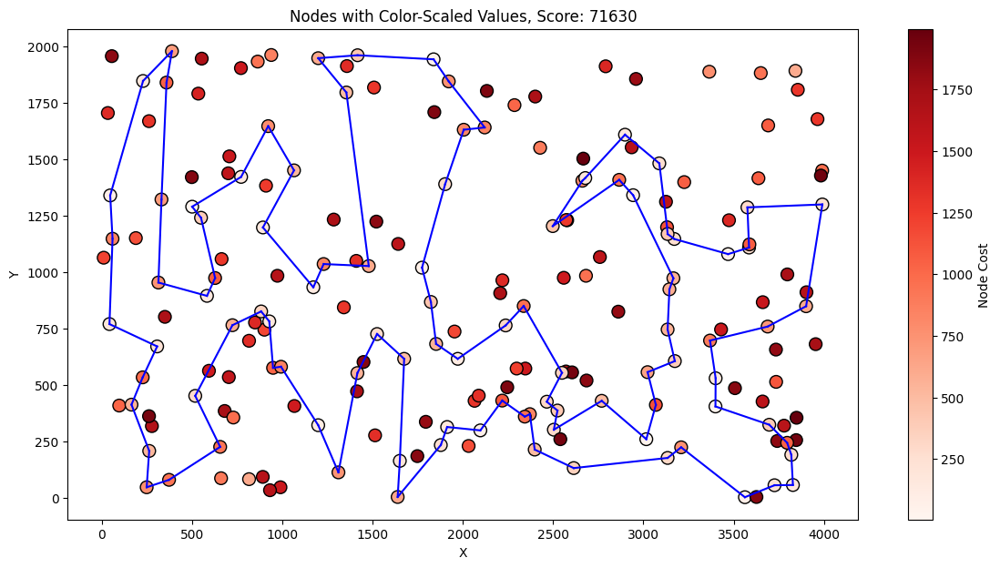

___________________________________________________________________
For Node: 125


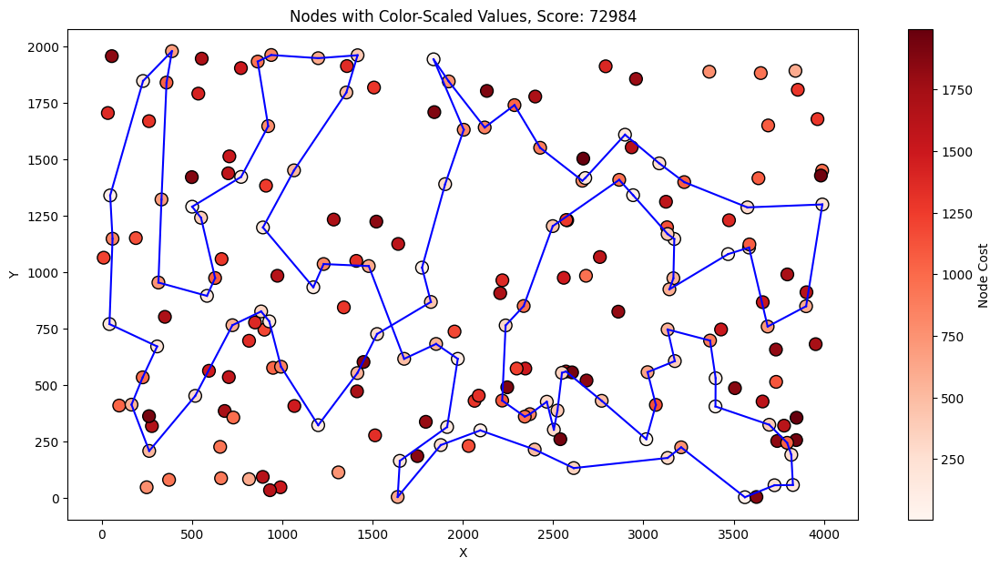

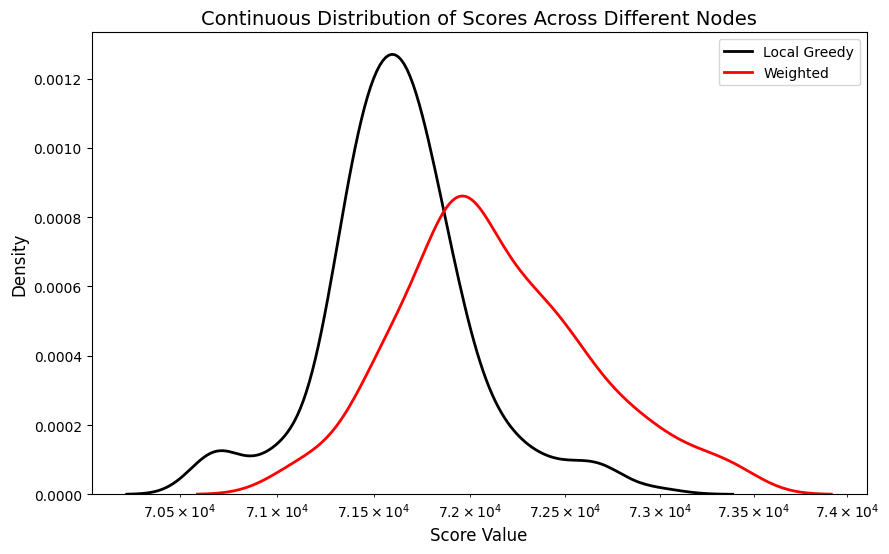

Overall Stats: 
 Minimum: 70630 Maximum: 72984 Median: 71630.0 Mean: 71630.235 Standard Deviation: 386.0922296226641
Time Stats: 
 Minimum: 0.03456568717956543 Maximum: 0.16455650329589844 Median: 0.07701706886291504 Mean: 0.07798595786094666 Standard Deviation: 0.023720819261909835
Comparison Stats: 
 Minimum: 7 Maximum: 1916 Median: 458.0 Mean: 502.55 Standard Deviation: 338.4478800347256 and Relative: 0.006946959208715626


In [45]:
plot_score_distribution(weighted_greedy_local_result_A, label="Weighted + Greedy Local Search", title = "Score Distribution For Weighted + Greedy Local Search", x_label = "score")
plot_score_distribution(weighted_greedy_local_times_A, label="Times Weighted + Greedy Local Search", title = "Time Distribution For Weighted + Greedy Local Search", x_label = "time")
plot_best_overall(df_A, weighted_greedy_local_solution_A, weighted_greedy_local_result_A)
plot_average_overall(df_A, weighted_greedy_local_solution_A, weighted_greedy_local_result_A)
plot_worst_overall(df_A, weighted_greedy_local_solution_A, weighted_greedy_local_result_A)
plot_score_distributions(weighted_greedy_local_result_A, weighted_greedy_local_intermidiate_A, labels = ["Local Greedy", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_greedy_local_intermidiate_A, weighted_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

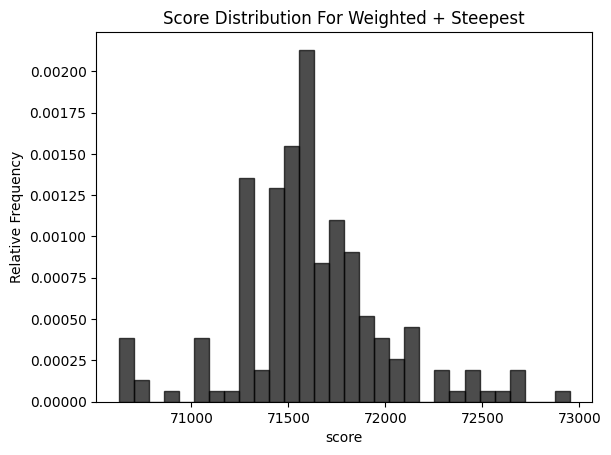

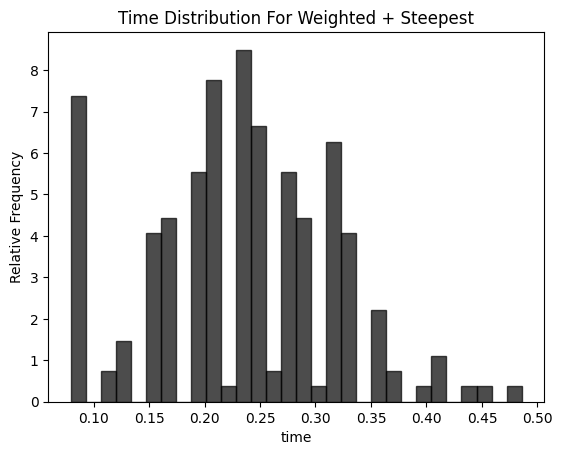

___________________________________________________________________
For Node: 153


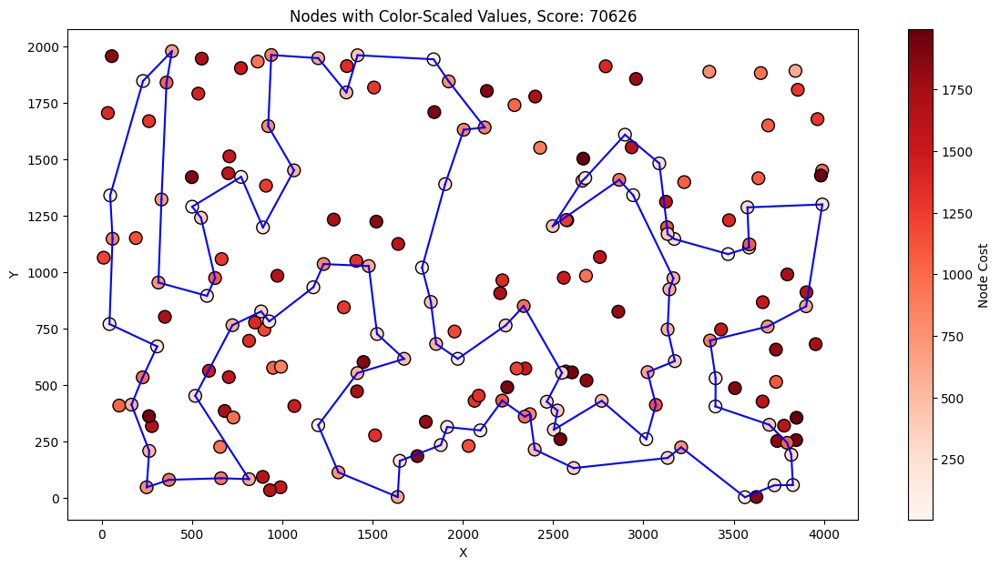

Best solution: [0, 117, 93, 68, 46, 115, 139, 193, 41, 5, 42, 181, 159, 69, 108, 18, 22, 146, 34, 160, 48, 54, 177, 10, 190, 4, 112, 184, 43, 116, 65, 59, 118, 51, 151, 133, 162, 123, 127, 70, 135, 154, 180, 53, 121, 100, 26, 86, 75, 44, 25, 16, 171, 175, 113, 56, 31, 78, 145, 179, 196, 81, 90, 165, 40, 185, 106, 178, 3, 14, 144, 62, 9, 148, 102, 49, 52, 55, 57, 92, 129, 82, 120, 2, 101, 1, 97, 152, 124, 94, 63, 79, 80, 176, 137, 23, 186, 89, 183, 143]
___________________________________________________________________
For Node: 54


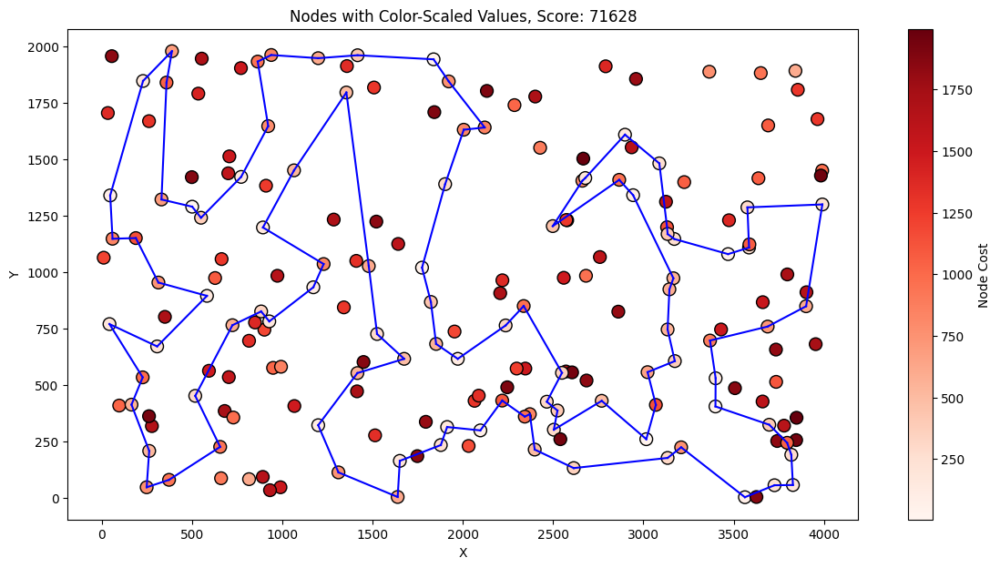

___________________________________________________________________
For Node: 125


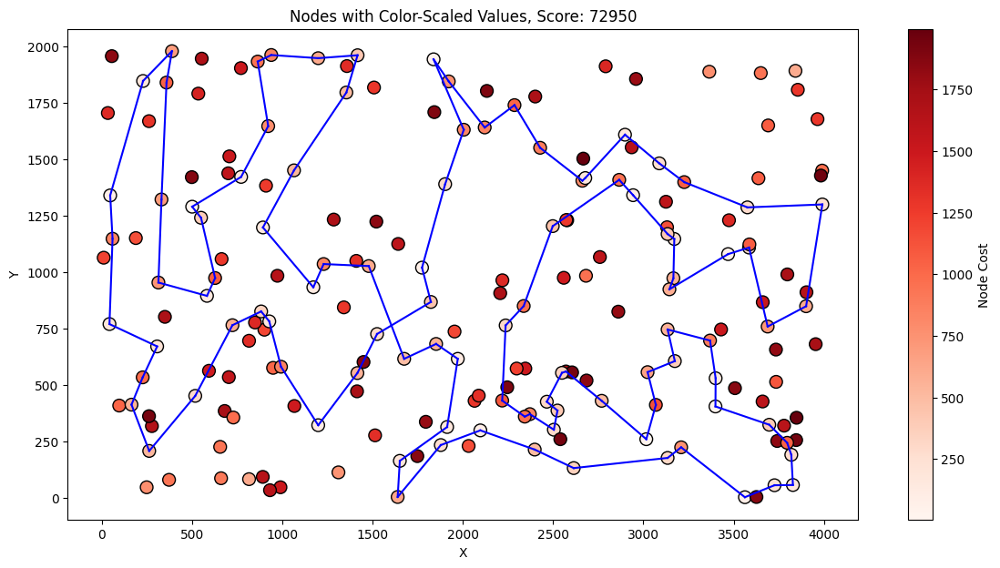

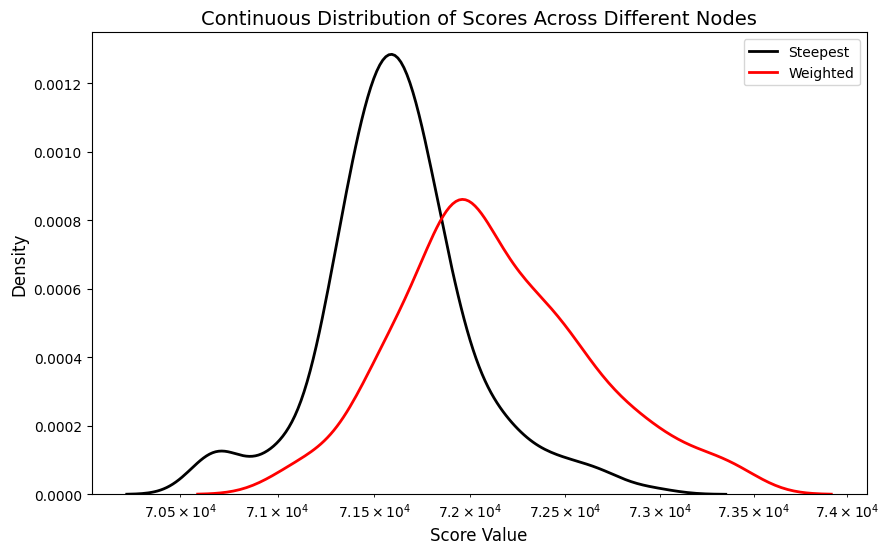

Overall Stats: 
 Minimum: 70626 Maximum: 72950 Median: 71628.0 Mean: 71621.67 Standard Deviation: 383.2167286275483
Time Stats: 
 Minimum: 0.07942581176757812 Maximum: 0.4857180118560791 Median: 0.24022364616394043 Mean: 0.23461498618125914 Standard Deviation: 0.08354189205846214
Comparison Stats: 
 Minimum: 7 Maximum: 1916 Median: 462.0 Mean: 511.115 Standard Deviation: 318.0497630481746 and Relative: 0.007066766479255202


In [46]:
plot_score_distribution(weighted_steepest_result_A, label="Weighted + Steepest", title = "Score Distribution For Weighted + Steepest", x_label = "score")
plot_score_distribution(weighted_steepest_times_A, label="Times Weighted + Steepest", title = "Time Distribution For Weighted + Steepest", x_label = "time")
plot_best_overall(df_A, weighted_steepest_solution_A, weighted_steepest_result_A)
plot_average_overall(df_A, weighted_steepest_solution_A, weighted_steepest_result_A)
plot_worst_overall(df_A, weighted_steepest_solution_A, weighted_steepest_result_A)
plot_score_distributions(weighted_steepest_result_A, weighted_steepest_intermidiate_A, labels = ["Steepest", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_steepest_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_steepest_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_steepest_intermidiate_A, weighted_steepest_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

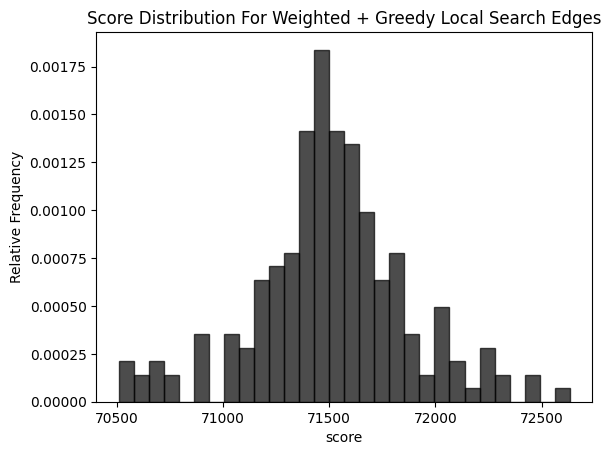

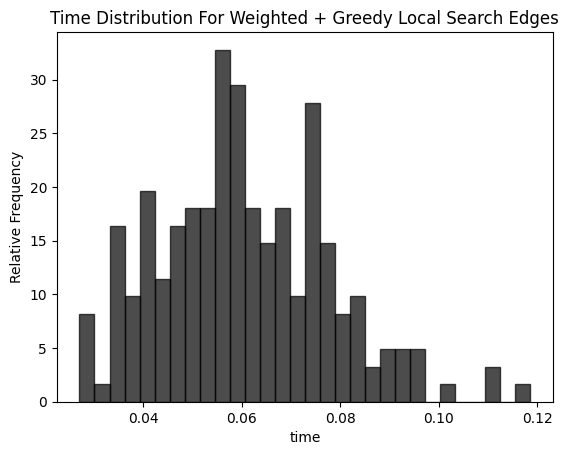

___________________________________________________________________
For Node: 153


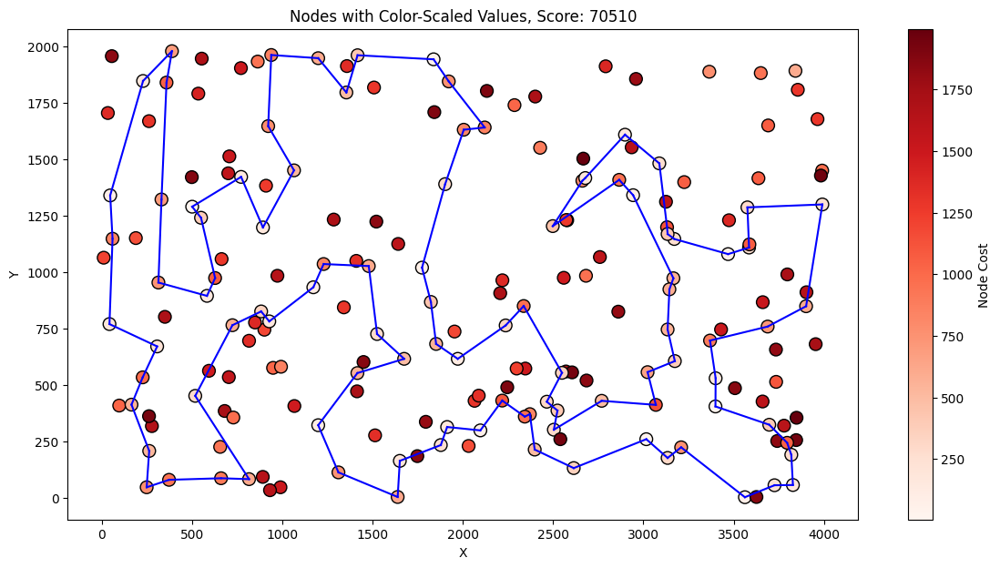

Best solution: [117, 0, 143, 183, 89, 186, 23, 137, 176, 80, 79, 63, 94, 124, 152, 97, 1, 101, 2, 82, 129, 92, 57, 55, 52, 49, 102, 148, 9, 62, 144, 14, 3, 178, 106, 185, 40, 165, 90, 81, 196, 179, 145, 78, 31, 56, 113, 175, 171, 16, 25, 44, 120, 75, 86, 26, 100, 121, 53, 180, 154, 135, 70, 127, 123, 162, 133, 151, 51, 118, 59, 65, 116, 43, 184, 112, 4, 190, 10, 177, 54, 48, 160, 34, 146, 22, 18, 108, 69, 159, 181, 42, 5, 41, 193, 139, 115, 46, 68, 93]
___________________________________________________________________
For Node: 1


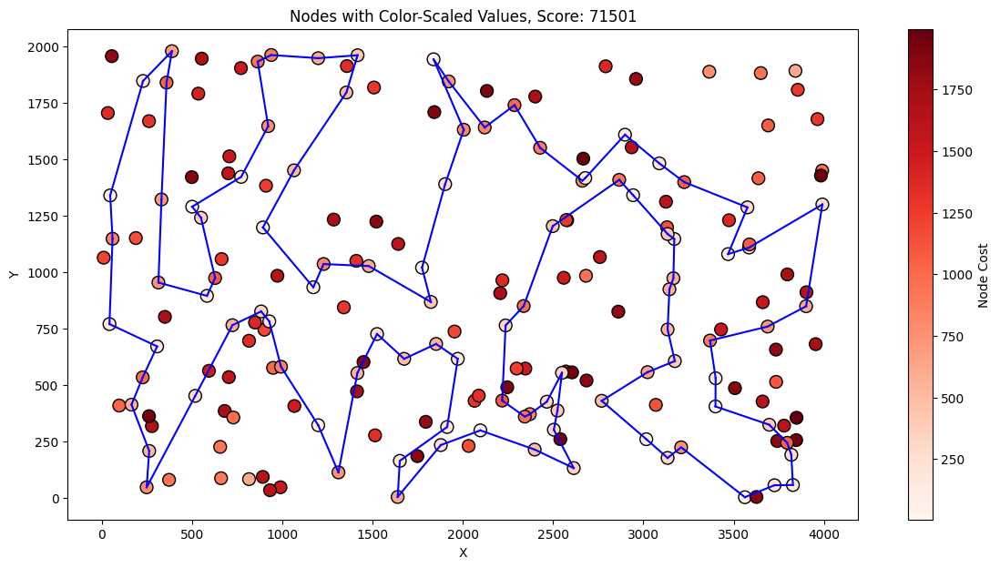

___________________________________________________________________
For Node: 98


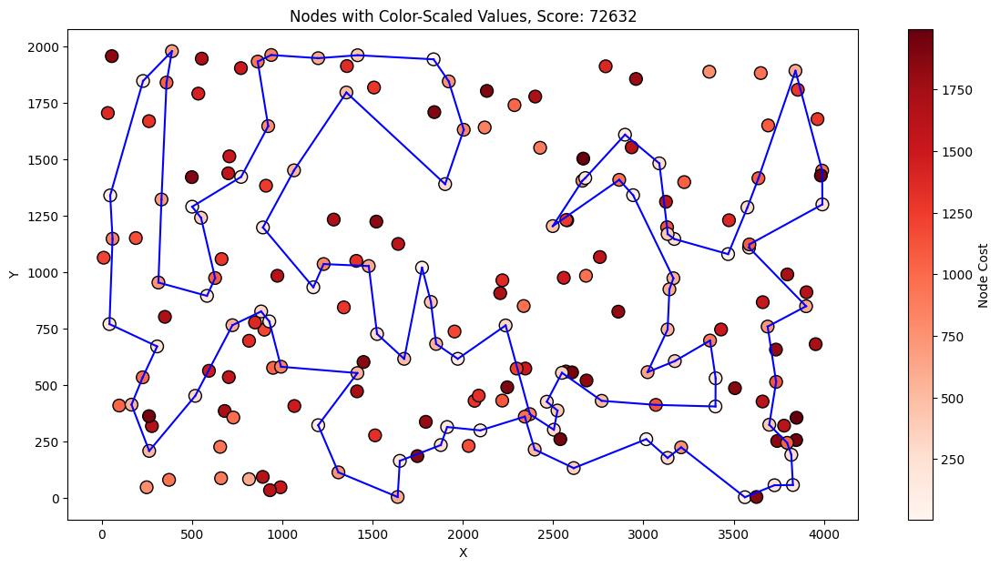

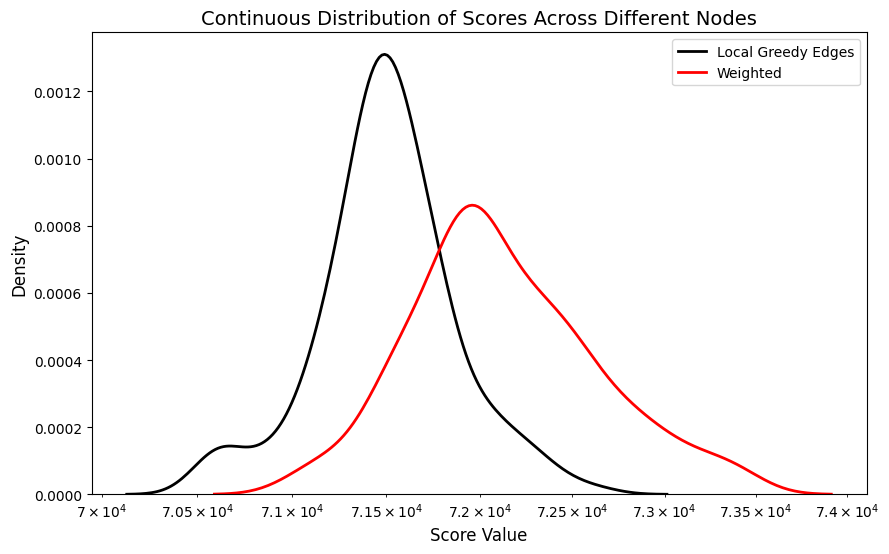

Overall Stats: 
 Minimum: 70510 Maximum: 72632 Median: 71497.5 Mean: 71504.6 Standard Deviation: 365.508344637985
Time Stats: 
 Minimum: 0.02707195281982422 Maximum: 0.11857128143310547 Median: 0.0588916540145874 Mean: 0.0605282974243164 Standard Deviation: 0.017309983312114436
Comparison Stats: 
 Minimum: 31 Maximum: 1895 Median: 551.0 Mean: 628.185 Standard Deviation: 353.06639711957865 and Relative: 0.008686318355743189


In [47]:
plot_score_distribution(weighted_edges_greedy_local_result_A, label="Weighted + Greedy Local Search (Edges)", title = "Score Distribution For Weighted + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(weighted_edges_greedy_local_times_A, label="Times Weighted + Greedy Local Search (Edges)", title = "Time Distribution For Weighted + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_A, weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_result_A)
plot_average_overall(df_A, weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_result_A)
plot_worst_overall(df_A, weighted_edges_greedy_local_solution_A, weighted_edges_greedy_local_result_A)
plot_score_distributions(weighted_edges_greedy_local_result_A, weighted_edges_greedy_local_intermidiate_A, labels = ["Local Greedy Edges", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_edges_greedy_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_edges_greedy_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_edges_greedy_local_intermidiate_A, weighted_edges_greedy_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

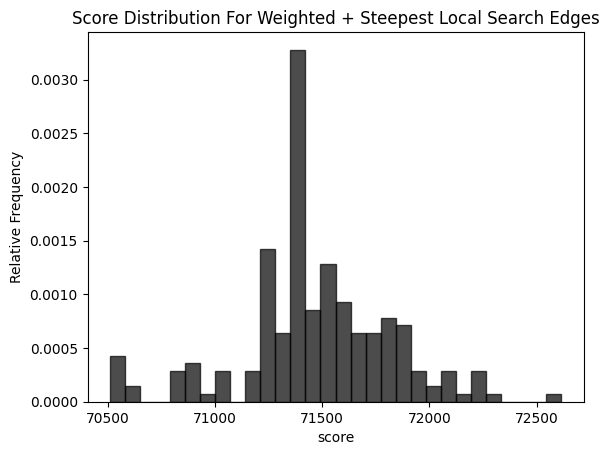

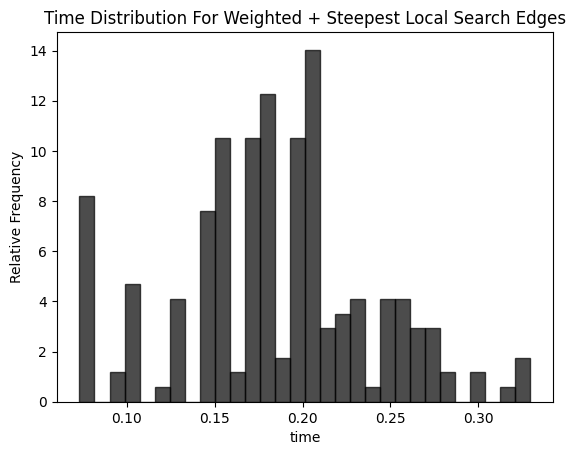

___________________________________________________________________
For Node: 153


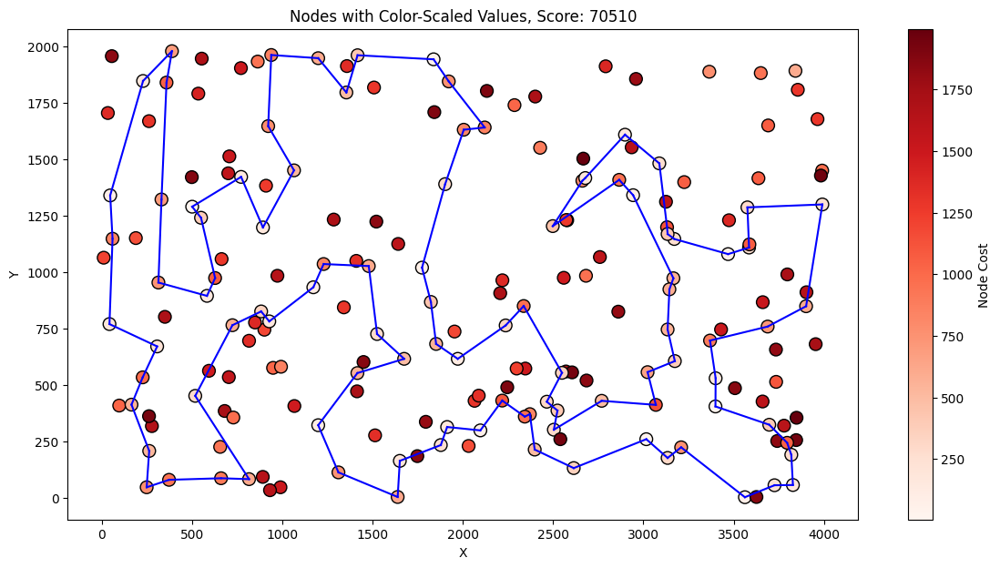

Best solution: [117, 0, 143, 183, 89, 186, 23, 137, 176, 80, 79, 63, 94, 124, 152, 97, 1, 101, 2, 82, 129, 92, 57, 55, 52, 49, 102, 148, 9, 62, 144, 14, 3, 178, 106, 185, 40, 165, 90, 81, 196, 179, 145, 78, 31, 56, 113, 175, 171, 16, 25, 44, 120, 75, 86, 26, 100, 121, 53, 180, 154, 135, 70, 127, 123, 162, 133, 151, 51, 118, 59, 65, 116, 43, 184, 112, 4, 190, 10, 177, 54, 48, 160, 34, 146, 22, 18, 108, 69, 159, 181, 42, 5, 41, 193, 139, 115, 46, 68, 93]
___________________________________________________________________
For Node: 180


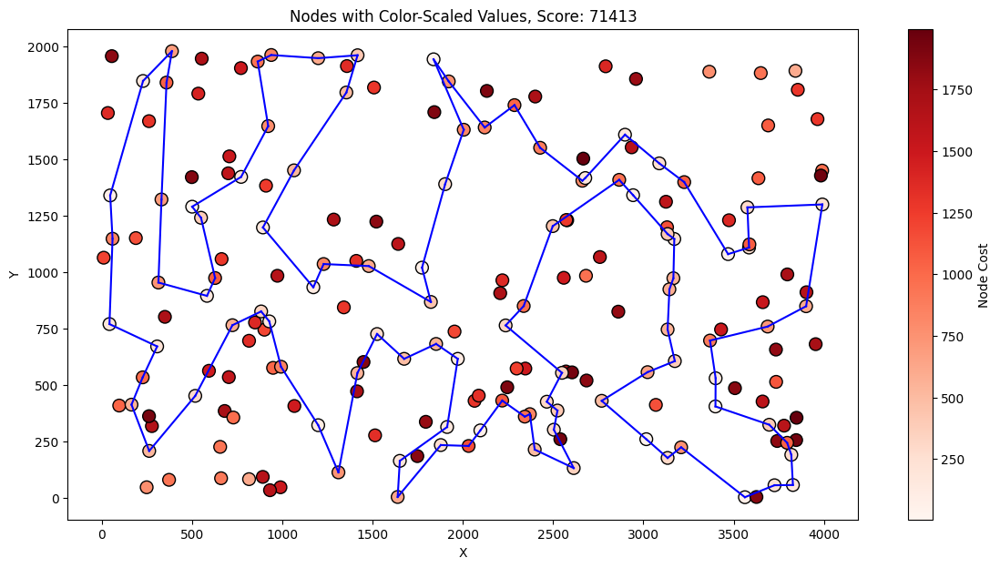

___________________________________________________________________
For Node: 125


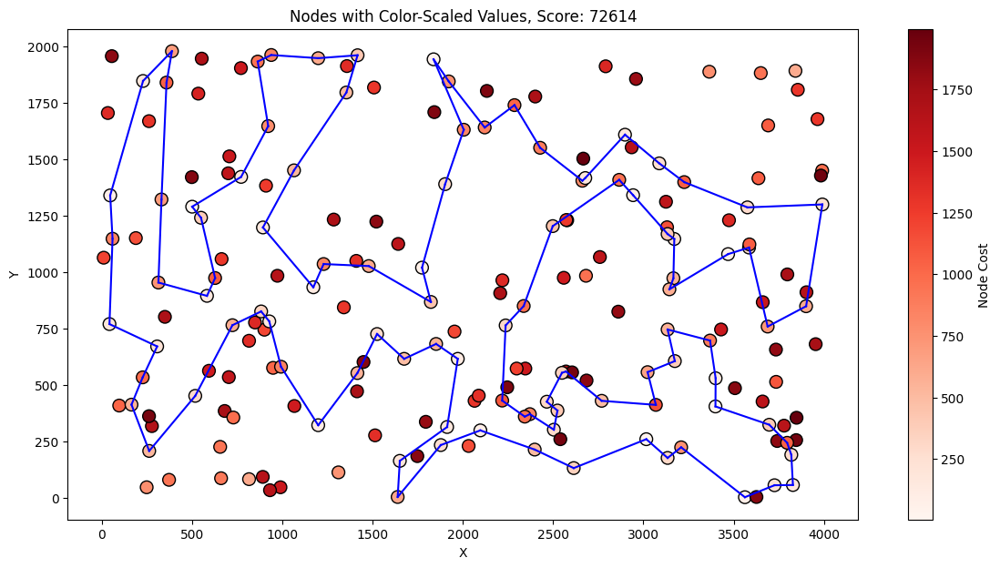

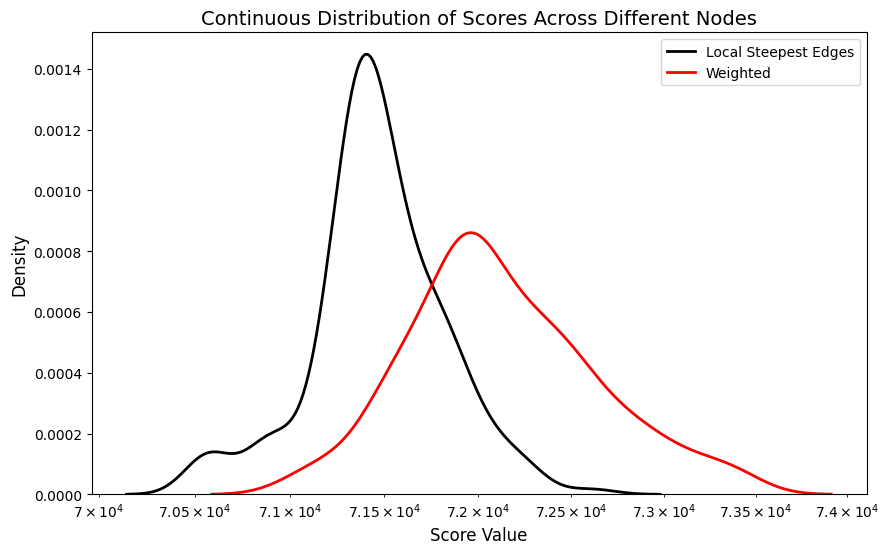

Overall Stats: 
 Minimum: 70510 Maximum: 72614 Median: 71413.0 Mean: 71467.655 Standard Deviation: 350.5588480911586
Time Stats: 
 Minimum: 0.0731205940246582 Maximum: 0.32961153984069824 Median: 0.18235385417938232 Mean: 0.18501171588897705 Standard Deviation: 0.054845884337090166
Comparison Stats: 
 Minimum: 160 Maximum: 2032 Median: 578.0 Mean: 665.13 Standard Deviation: 350.46850514703885 and Relative: 0.009197668268055528


In [48]:
plot_score_distribution(weighted_edges_steepest_local_result_A, label="Weighted + Steepest Local Search (Edges)", title = "Score Distribution For Weighted + Steepest Local Search Edges", x_label = "score")
plot_score_distribution(weighted_edges_steepest_local_times_A, label="Times Weighted + Steepest Local Search (Edges)", title = "Time Distribution For Weighted + Steepest Local Search Edges", x_label = "time")
plot_best_overall(df_A, weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_result_A)
plot_average_overall(df_A, weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_result_A)
plot_worst_overall(df_A, weighted_edges_steepest_local_solution_A, weighted_edges_steepest_local_result_A)
plot_score_distributions(weighted_edges_steepest_local_result_A, weighted_edges_steepest_local_intermidiate_A, labels = ["Local Steepest Edges", "Weighted"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(weighted_edges_steepest_local_result_A)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(weighted_edges_steepest_local_times_A)
min_val, max_val, mean, median, std, relative = compare_improvement(weighted_edges_steepest_local_intermidiate_A, weighted_edges_steepest_local_result_A)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

## Results - Instance B

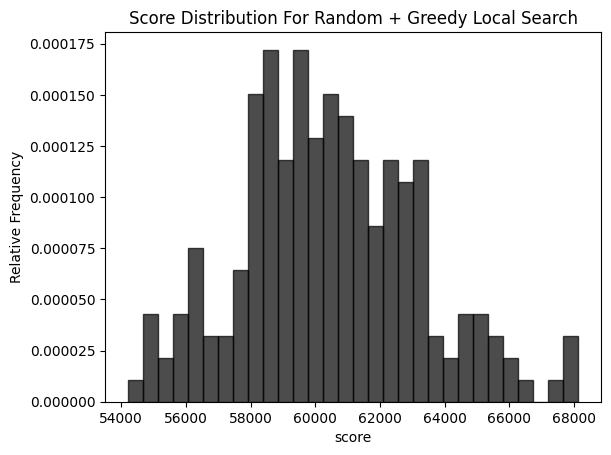

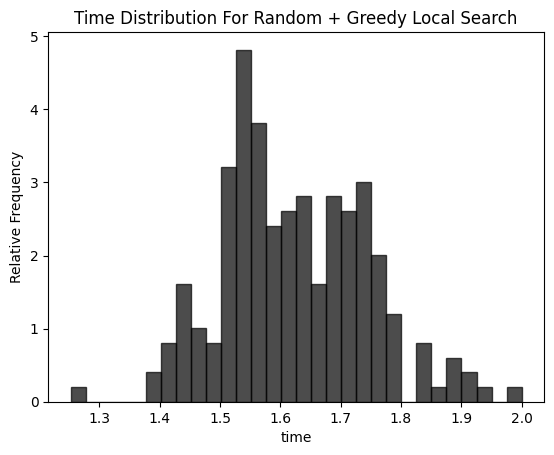

___________________________________________________________________
For Node: 152


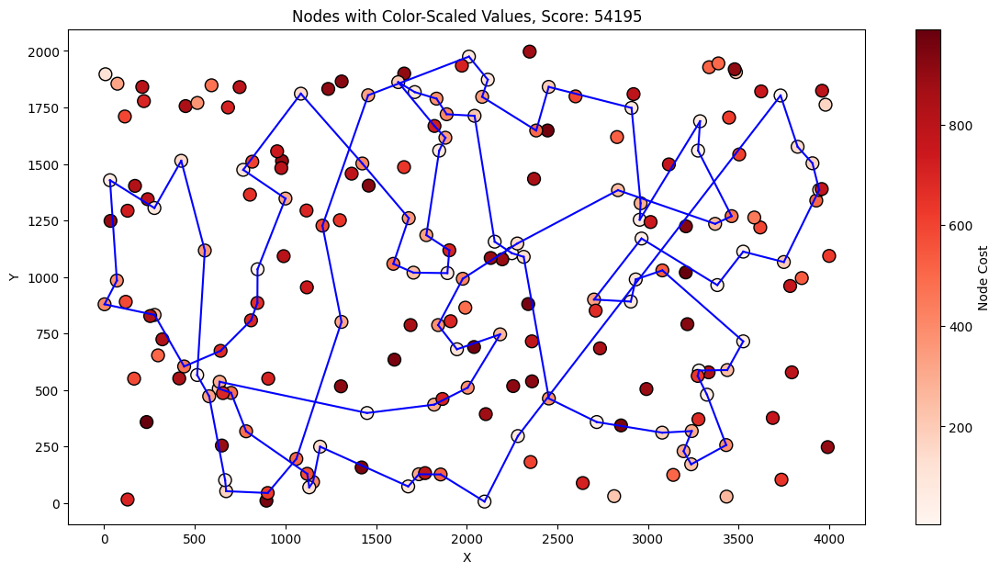

Best solution: [35, 0, 29, 145, 13, 132, 169, 188, 126, 195, 168, 11, 49, 33, 138, 182, 139, 134, 147, 90, 51, 121, 112, 19, 151, 198, 1, 27, 38, 63, 135, 122, 131, 117, 193, 190, 80, 162, 45, 25, 118, 6, 70, 3, 15, 189, 155, 152, 55, 18, 140, 183, 130, 95, 34, 109, 160, 104, 8, 111, 82, 21, 177, 54, 31, 73, 136, 142, 175, 78, 5, 36, 61, 91, 141, 77, 20, 148, 47, 94, 179, 185, 86, 62, 143, 106, 124, 128, 166, 194, 176, 180, 113, 114, 127, 89, 103, 163, 153, 81]
___________________________________________________________________
For Node: 36


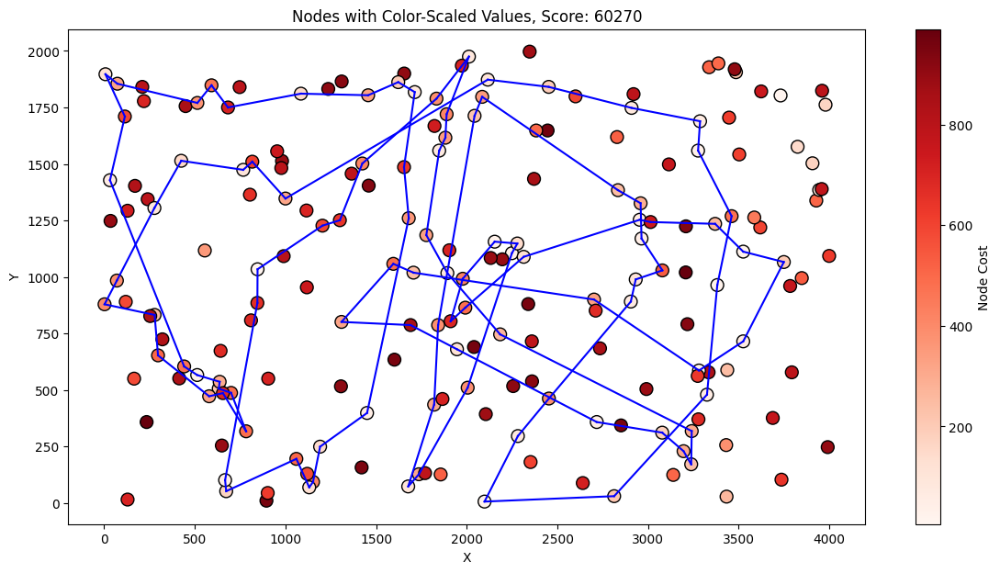

___________________________________________________________________
For Node: 88


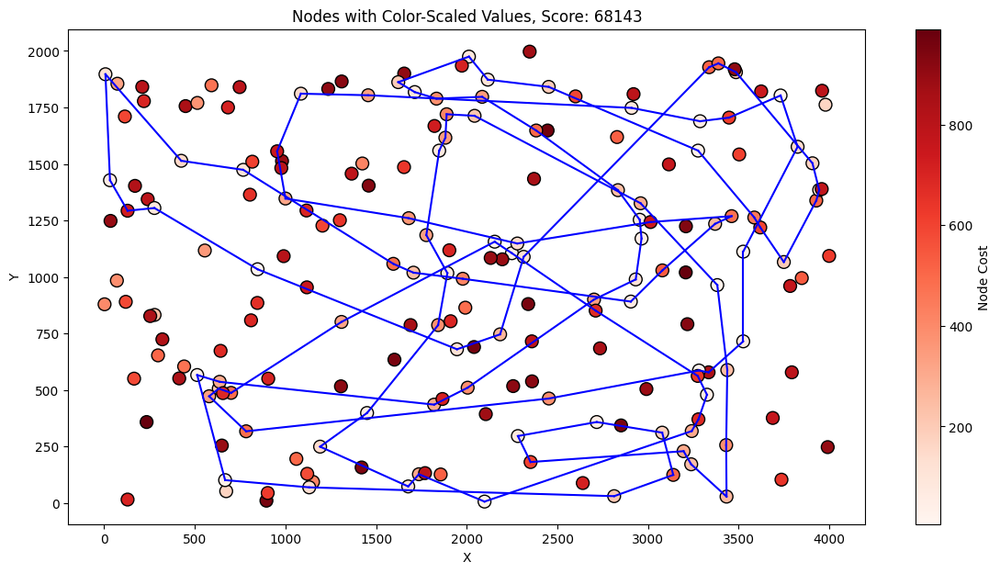

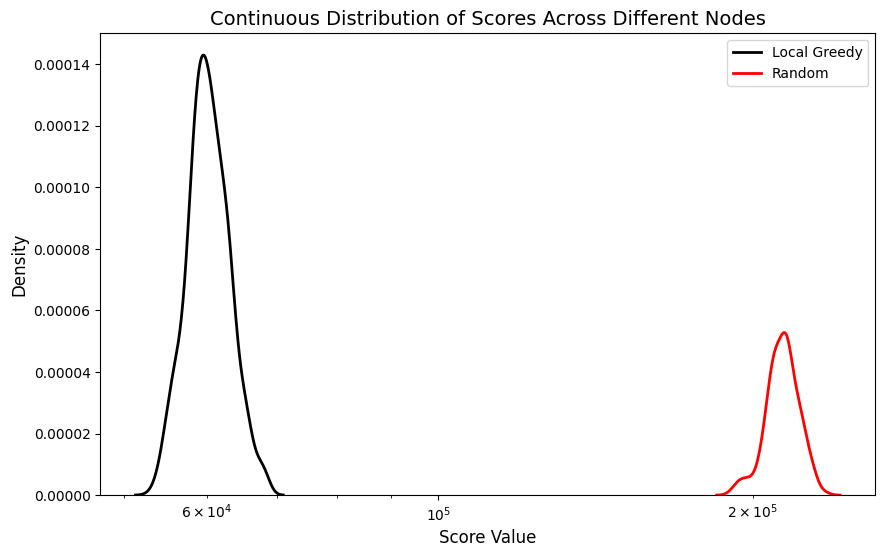

Overall Stats: 
 Minimum: 54195 Maximum: 68143 Median: 60268.0 Mean: 60434.995 Standard Deviation: 2777.2778912048034
Time Stats: 
 Minimum: 1.2525787353515625 Maximum: 1.9999427795410156 Median: 1.6093193292617798 Mean: 1.622859320640564 Standard Deviation: 0.12120047266400676
Comparison Stats: 
 Minimum: 129309 Maximum: 176481 Median: 153814.0 Mean: 153444.355 Standard Deviation: 8307.982486679603 and Relative: 0.7170302065352558


In [49]:
plot_score_distribution(random_greedy_local_result_B, label="Random + Greedy Local Search", title = "Score Distribution For Random + Greedy Local Search", x_label = "score")
plot_score_distribution(random_greedy_local_times_B, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search", x_label = "time")
plot_best_overall(df_B, random_greedy_local_solution_B, random_greedy_local_result_B)
plot_average_overall(df_B, random_greedy_local_solution_B, random_greedy_local_result_B)
plot_worst_overall(df_B, random_greedy_local_solution_B, random_greedy_local_result_B)
plot_score_distributions(random_greedy_local_result_B, random_greedy_local_intermidiate_B, labels = ["Local Greedy", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_greedy_local_intermidiate_B, random_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

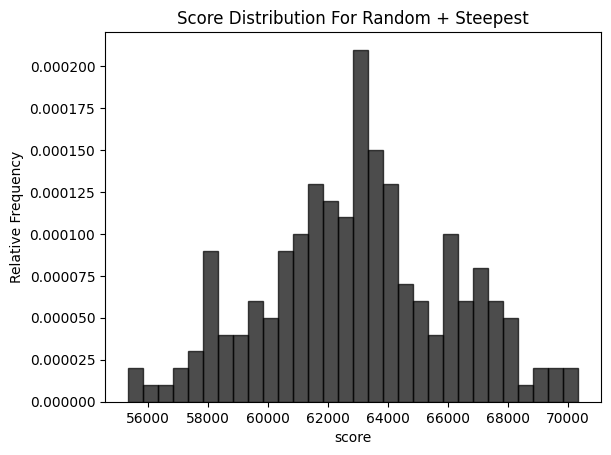

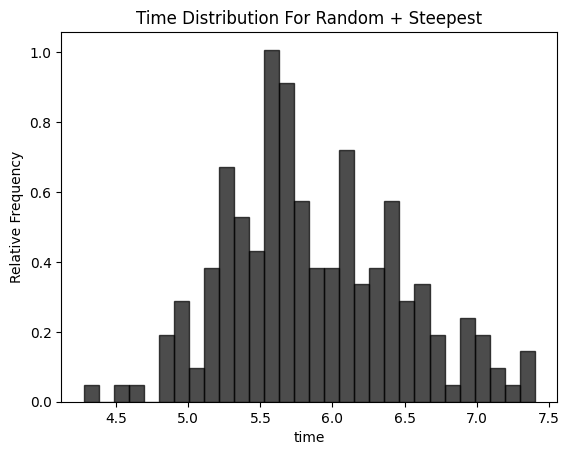

___________________________________________________________________
For Node: 17


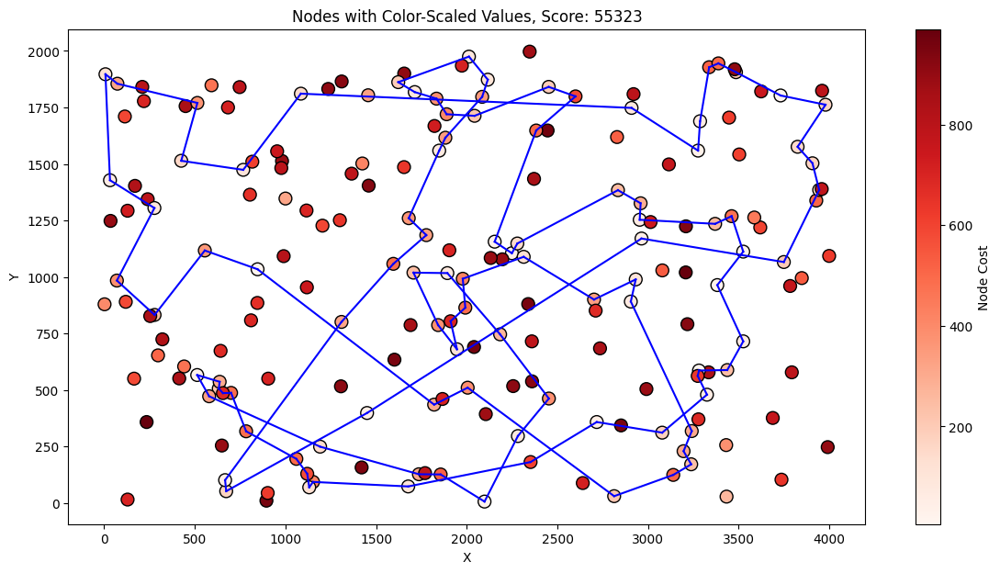

Best solution: [40, 63, 135, 38, 1, 131, 121, 21, 82, 187, 165, 127, 89, 103, 106, 124, 143, 35, 160, 144, 56, 8, 104, 138, 33, 111, 81, 77, 141, 91, 61, 5, 193, 117, 54, 31, 164, 73, 136, 45, 142, 175, 78, 36, 97, 153, 163, 113, 180, 176, 194, 166, 86, 185, 130, 95, 18, 55, 34, 109, 0, 29, 189, 184, 155, 145, 13, 132, 169, 188, 70, 3, 15, 195, 168, 139, 11, 182, 25, 190, 80, 177, 62, 179, 94, 47, 148, 60, 20, 28, 149, 4, 140, 183, 152, 147, 90, 122, 133, 107]
___________________________________________________________________
For Node: 19


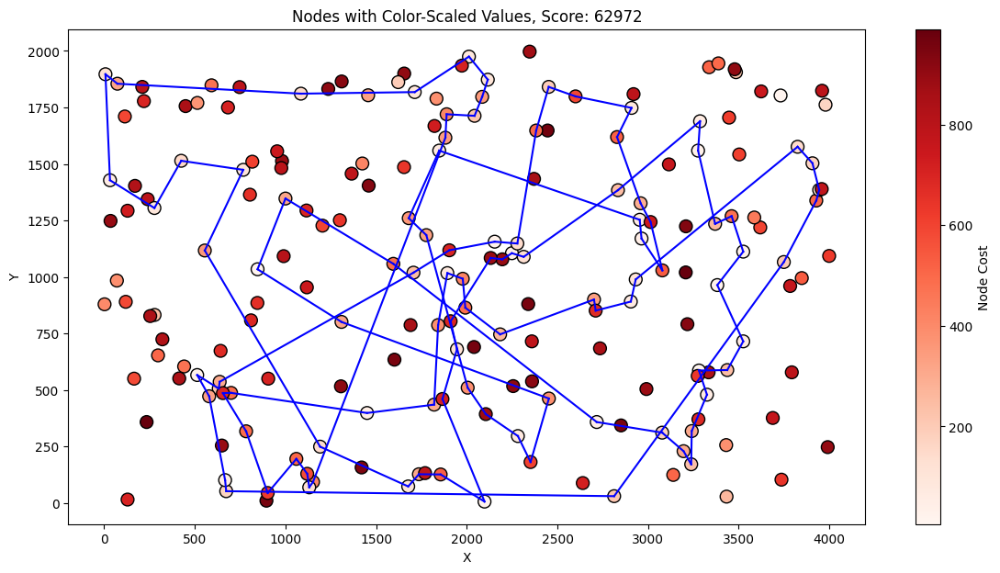

___________________________________________________________________
For Node: 13


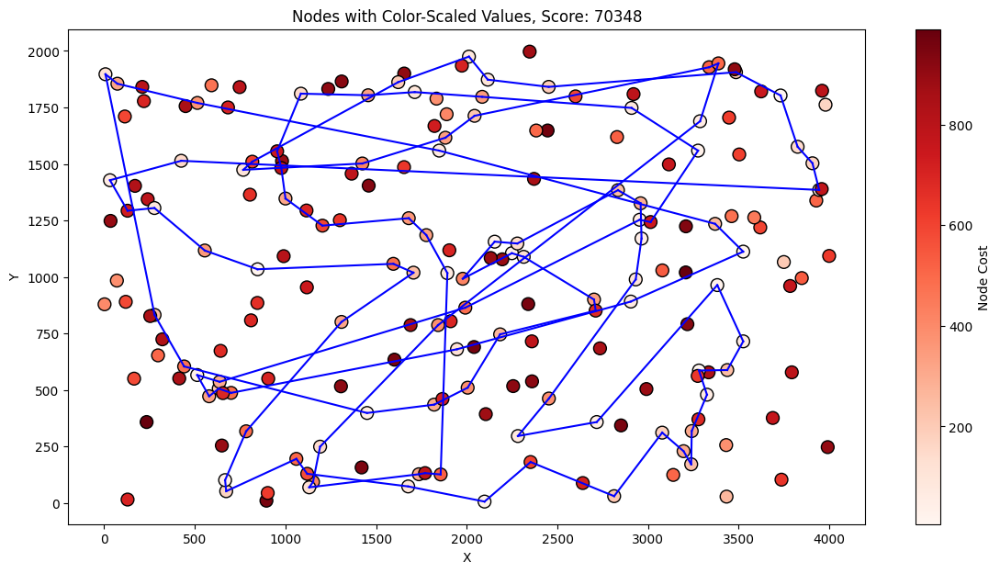

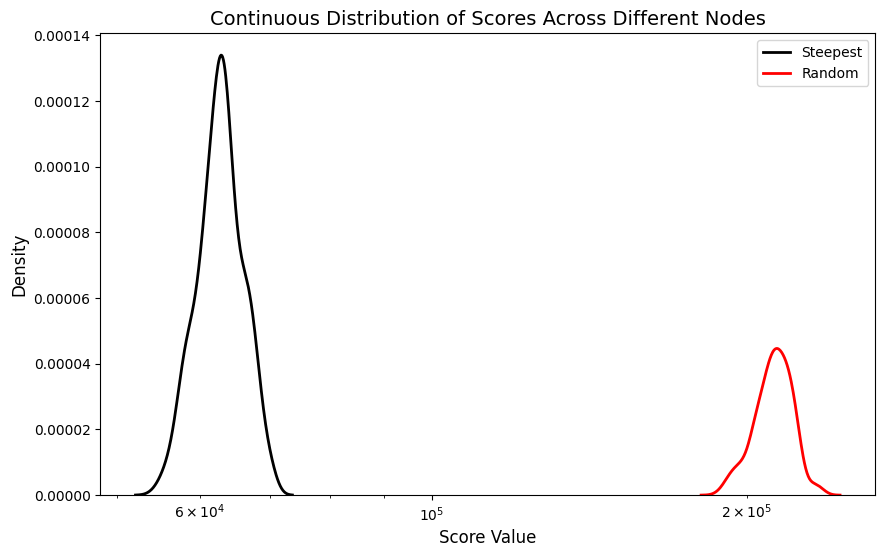

Overall Stats: 
 Minimum: 55323 Maximum: 70348 Median: 62969.0 Mean: 62996.89 Standard Deviation: 3094.2180608192434
Time Stats: 
 Minimum: 4.275409460067749 Maximum: 7.402639865875244 Median: 5.768038034439087 Mean: 5.866201388835907 Standard Deviation: 0.5964372158000548
Comparison Stats: 
 Minimum: 125998 Maximum: 176123 Median: 150306.0 Mean: 149555.83 Standard Deviation: 9136.297641336998 and Relative: 0.7031285420399243


In [50]:
plot_score_distribution(random_steepest_result_B, label="Random + Steepest", title = "Score Distribution For Random + Steepest", x_label = "score")
plot_score_distribution(random_steepest_times_B, label="Times Random + Steepest", title = "Time Distribution For Random + Steepest", x_label = "time")
plot_best_overall(df_B, random_steepest_solution_B, random_steepest_result_B)
plot_average_overall(df_B, random_steepest_solution_B, random_steepest_result_B)
plot_worst_overall(df_B, random_steepest_solution_B, random_steepest_result_B)
plot_score_distributions(random_steepest_result_B, random_steepest_intermidiate_B, labels = ["Steepest", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_steepest_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_steepest_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_steepest_intermidiate_B, random_steepest_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

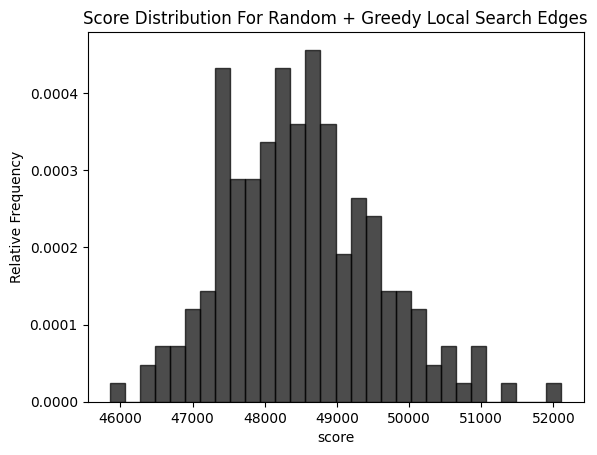

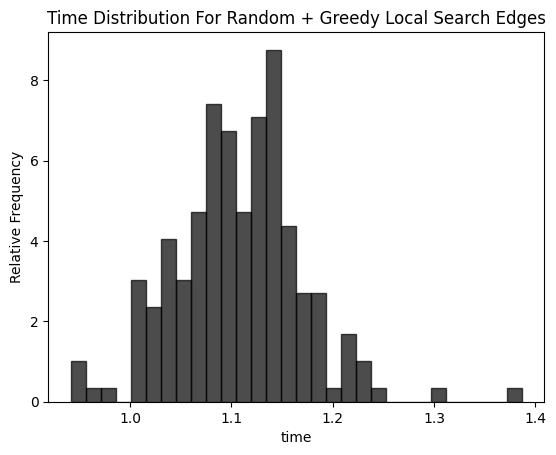

___________________________________________________________________
For Node: 93


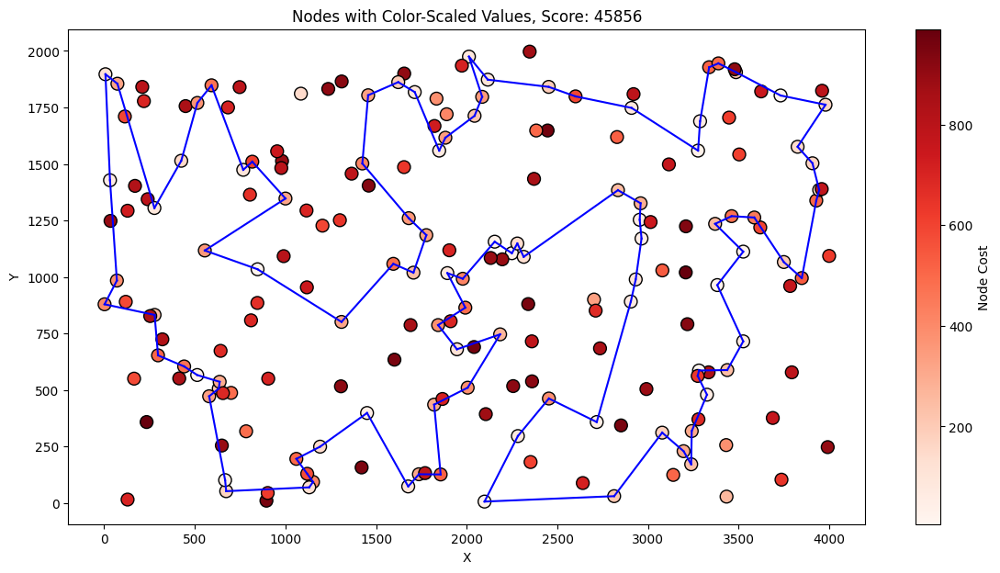

Best solution: [183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 172, 179, 99, 130, 95, 185, 86, 166, 194, 176, 180, 113, 103, 127, 89, 163, 187, 141, 77, 81, 153, 106, 124, 62, 18, 55, 34, 35, 109, 0, 29, 160, 33, 144, 104, 8, 111, 82, 21, 91, 61, 36, 177, 5, 45, 142, 78, 175, 80, 190, 193, 31, 54, 117, 198, 156, 1, 27, 38, 63, 40, 107, 135, 122, 133, 10, 90, 191, 51, 131, 121, 25, 182, 138, 11, 139, 134, 6, 188, 169, 168, 195, 145, 15, 70, 3, 155, 184, 152]
___________________________________________________________________
For Node: 45


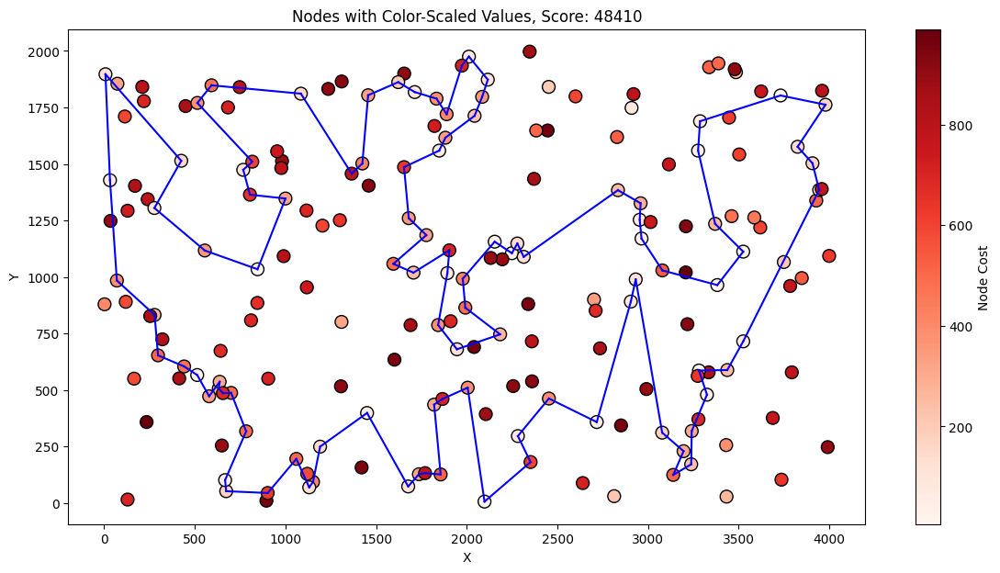

___________________________________________________________________
For Node: 108


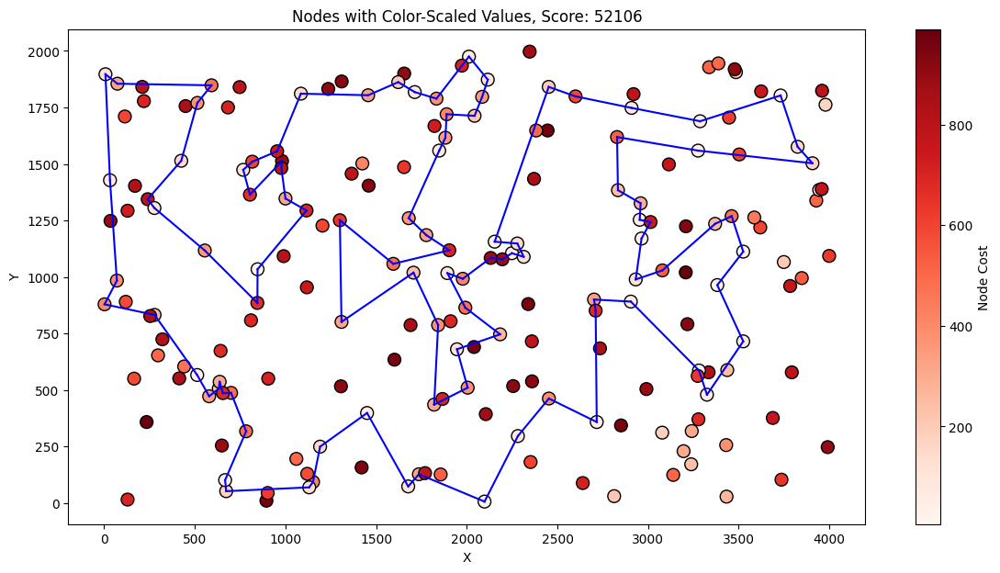

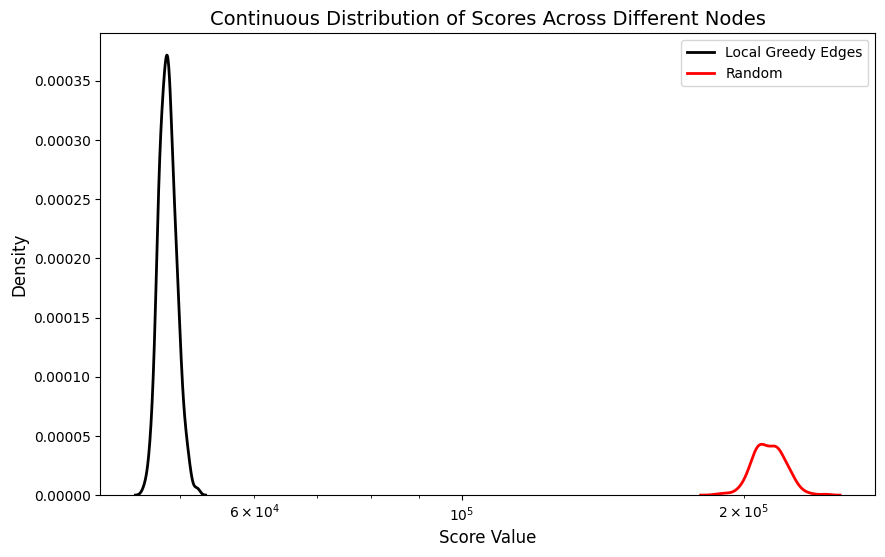

Overall Stats: 
 Minimum: 45856 Maximum: 52106 Median: 48404.5 Mean: 48496.015 Standard Deviation: 1042.8407859184451
Time Stats: 
 Minimum: 0.9413590431213379 Maximum: 1.3865399360656738 Median: 1.1052690744400024 Mean: 1.1069014692306518 Standard Deviation: 0.06233134873326923
Comparison Stats: 
 Minimum: 140316 Maximum: 197354 Median: 164576.0 Mean: 164942.315 Standard Deviation: 8490.532194496114 and Relative: 0.7724306396411487


In [51]:
plot_score_distribution(random_edge_greedy_local_result_B, label="Random + Greedy Local Search (Edges)", title = "Score Distribution For Random + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(random_edge_greedy_local_times_B, label="Times Random + Greedy Local Search", title = "Time Distribution For Random + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_B, random_edge_greedy_local_solution_B, random_edge_greedy_local_result_B)
plot_average_overall(df_B, random_edge_greedy_local_solution_B, random_edge_greedy_local_result_B)
plot_worst_overall(df_B, random_edge_greedy_local_solution_B, random_edge_greedy_local_result_B)
plot_score_distributions(random_edge_greedy_local_result_B, random_edge_greedy_local_intermidiate_B, labels = ["Local Greedy Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_greedy_local_intermidiate_B, random_edge_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

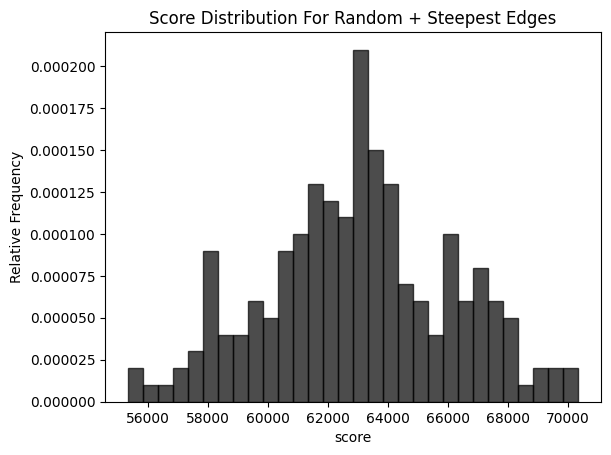

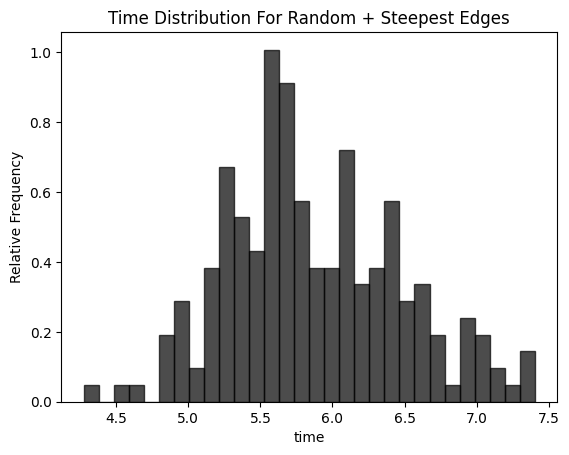

___________________________________________________________________
For Node: 146


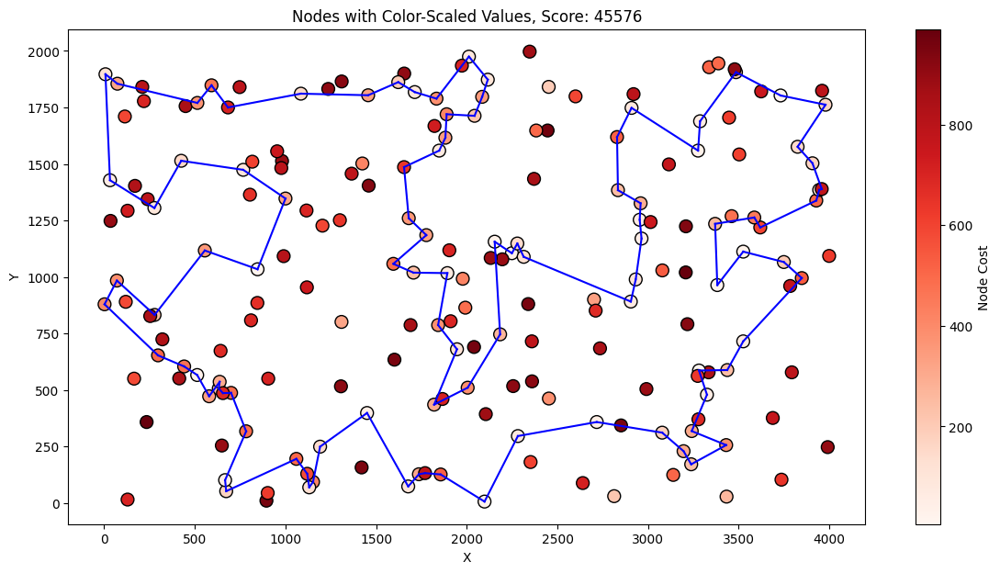

Best solution: [163, 89, 127, 114, 103, 113, 176, 194, 166, 172, 179, 185, 86, 95, 99, 22, 66, 94, 154, 47, 148, 60, 20, 28, 140, 183, 152, 170, 34, 55, 18, 62, 124, 106, 35, 109, 0, 29, 111, 82, 21, 8, 104, 33, 138, 182, 11, 139, 43, 168, 195, 13, 145, 15, 3, 70, 132, 169, 188, 6, 147, 178, 10, 133, 107, 40, 63, 135, 122, 90, 51, 121, 131, 1, 38, 27, 156, 198, 117, 193, 54, 31, 164, 73, 136, 190, 80, 45, 142, 175, 78, 5, 177, 36, 61, 79, 91, 141, 77, 153]
___________________________________________________________________
For Node: 139


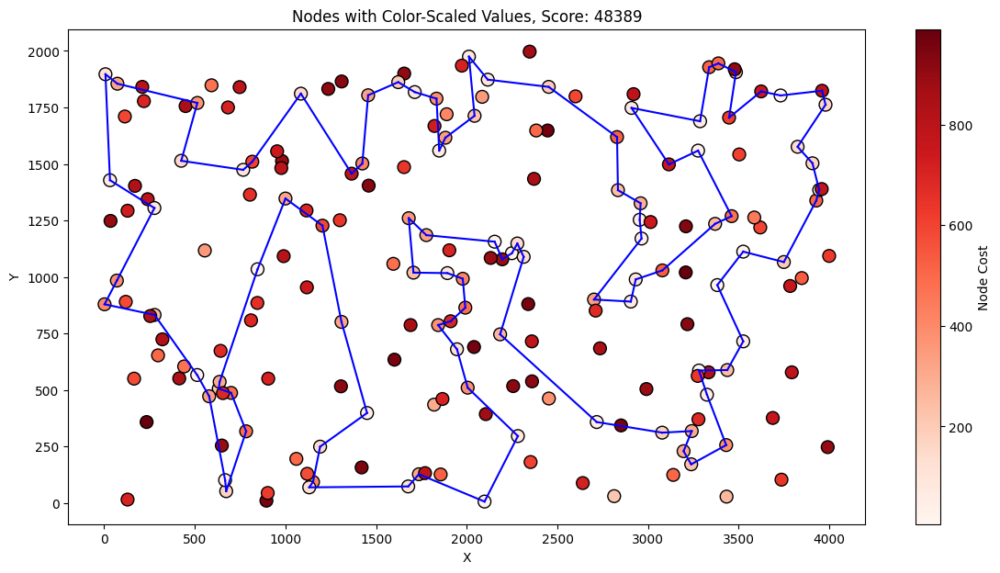

___________________________________________________________________
For Node: 128


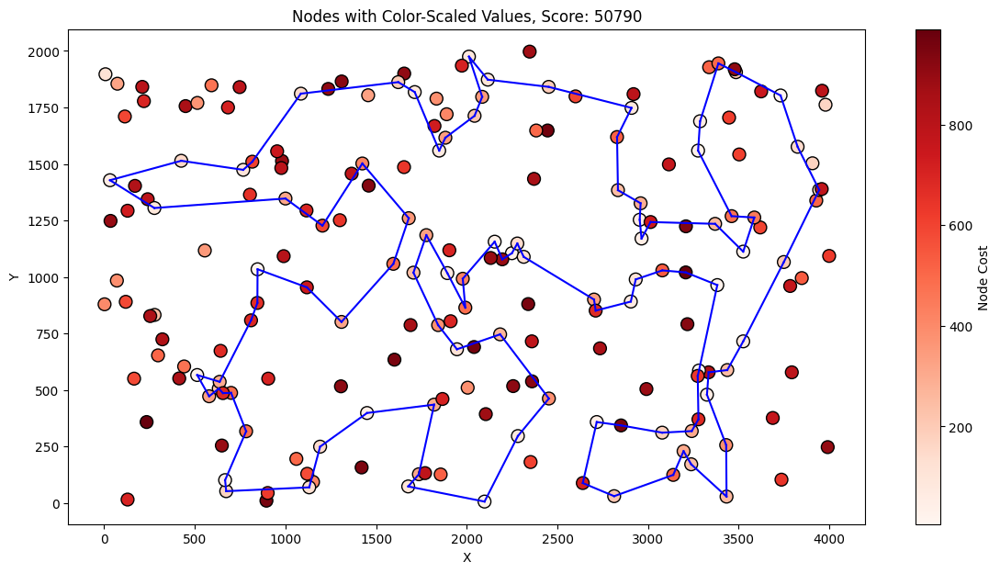

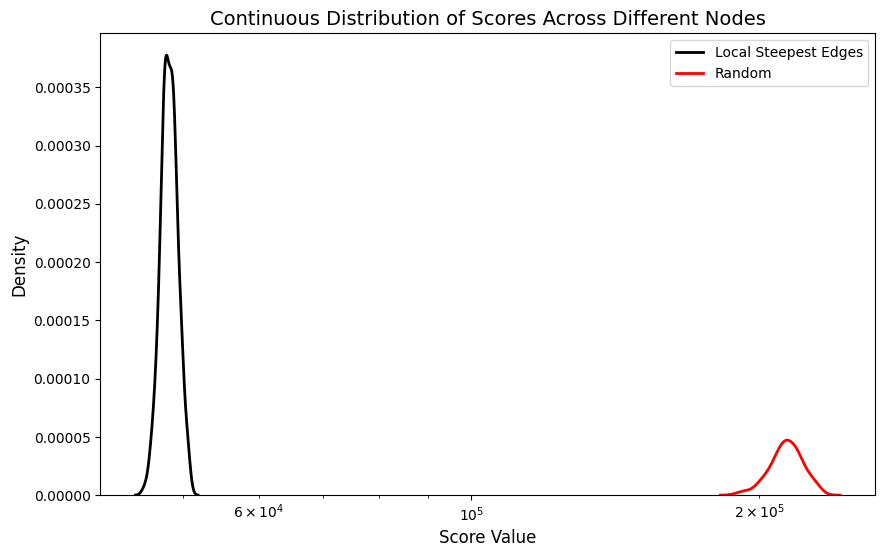

Overall Stats: 
 Minimum: 45576 Maximum: 50790 Median: 48380.0 Mean: 48358.225 Standard Deviation: 968.2189909183769
Time Stats: 
 Minimum: 2.879634380340576 Maximum: 3.8811721801757812 Median: 3.301455020904541 Mean: 3.32111496925354 Standard Deviation: 0.1809942294958112
Comparison Stats: 
 Minimum: 143198 Maximum: 184917 Median: 165692.5 Mean: 165631.995 Standard Deviation: 8329.77000792789 and Relative: 0.7736794741156284


In [52]:
plot_score_distribution(random_steepest_result_B, label="Random + Steepest (Edges)", title = "Score Distribution For Random + Steepest Edges", x_label = "score")
plot_score_distribution(random_steepest_times_B, label="Times Random + Steepest (Edges)", title = "Time Distribution For Random + Steepest Edges", x_label = "time")
plot_best_overall(df_B, random_edge_steepest_local_solution_B, random_edge_steepest_local_result_B)
plot_average_overall(df_B, random_edge_steepest_local_solution_B, random_edge_steepest_local_result_B)
plot_worst_overall(df_B, random_edge_steepest_local_solution_B, random_edge_steepest_local_result_B)
plot_score_distributions(random_edge_steepest_local_result_B, random_edge_steepest_local_intermidiate_B, labels = ["Local Steepest Edges", "Random"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(random_edge_steepest_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(random_edge_steepest_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(random_edge_steepest_local_intermidiate_B, random_edge_steepest_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

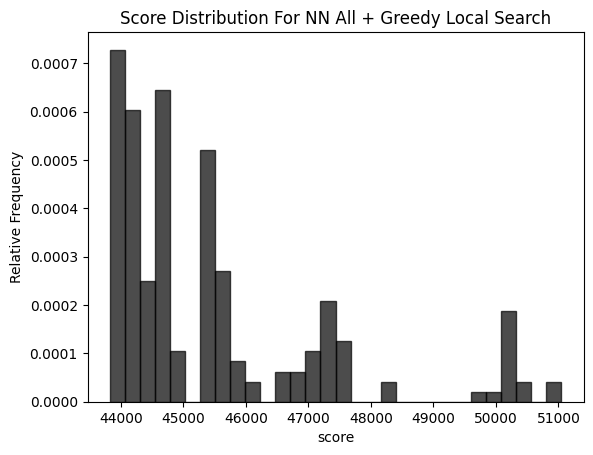

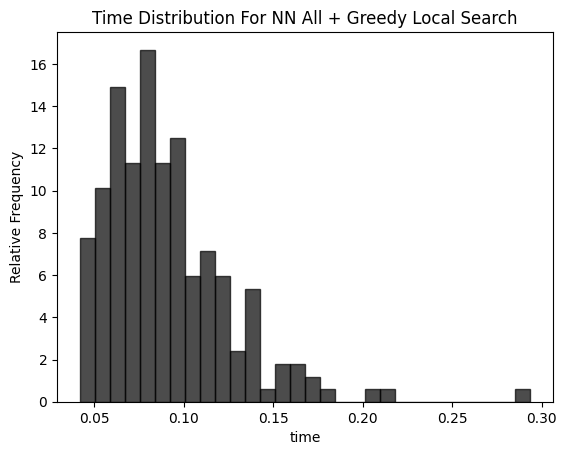

___________________________________________________________________
For Node: 5


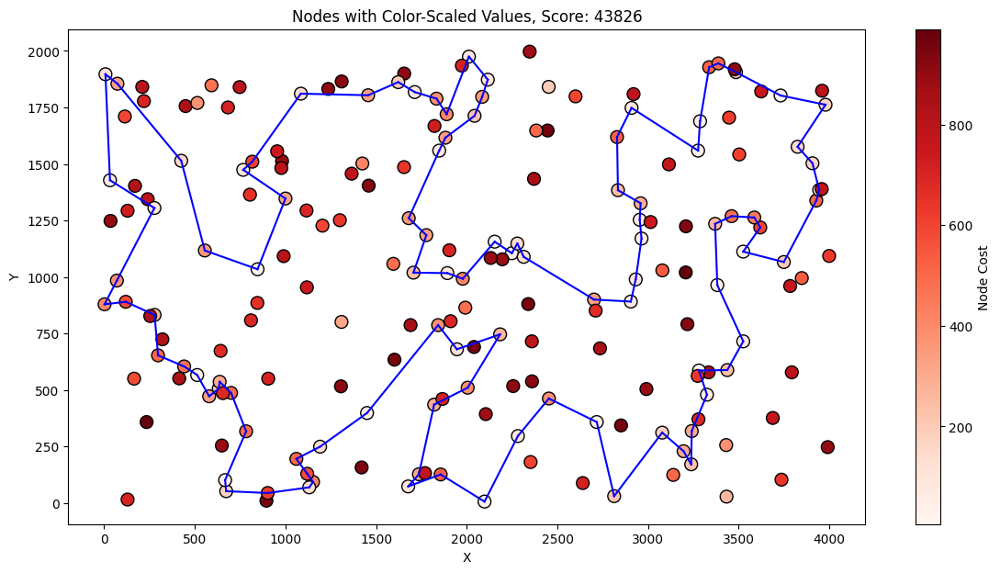

Best solution: [121, 51, 90, 191, 147, 6, 188, 169, 132, 13, 70, 3, 15, 145, 195, 168, 139, 11, 138, 33, 160, 29, 0, 109, 35, 143, 106, 124, 62, 18, 55, 34, 170, 152, 183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 179, 185, 22, 99, 130, 95, 86, 166, 194, 176, 113, 103, 127, 89, 163, 187, 153, 81, 77, 141, 91, 36, 61, 21, 82, 111, 8, 104, 177, 5, 45, 142, 78, 175, 162, 80, 190, 136, 73, 54, 31, 193, 117, 198, 156, 1, 16, 27, 38, 135, 63, 40, 107, 122, 131]
___________________________________________________________________
For Node: 115


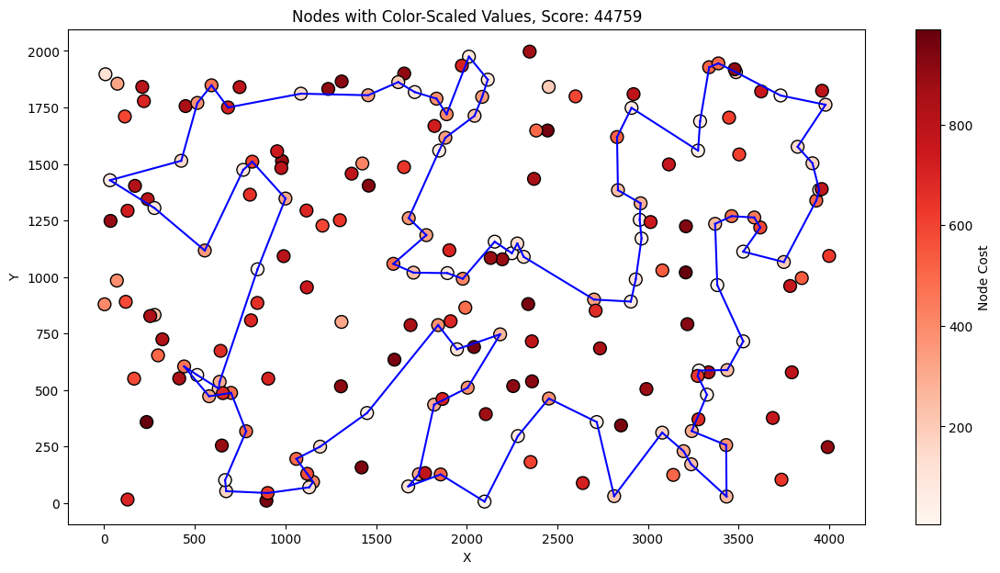

___________________________________________________________________
For Node: 181


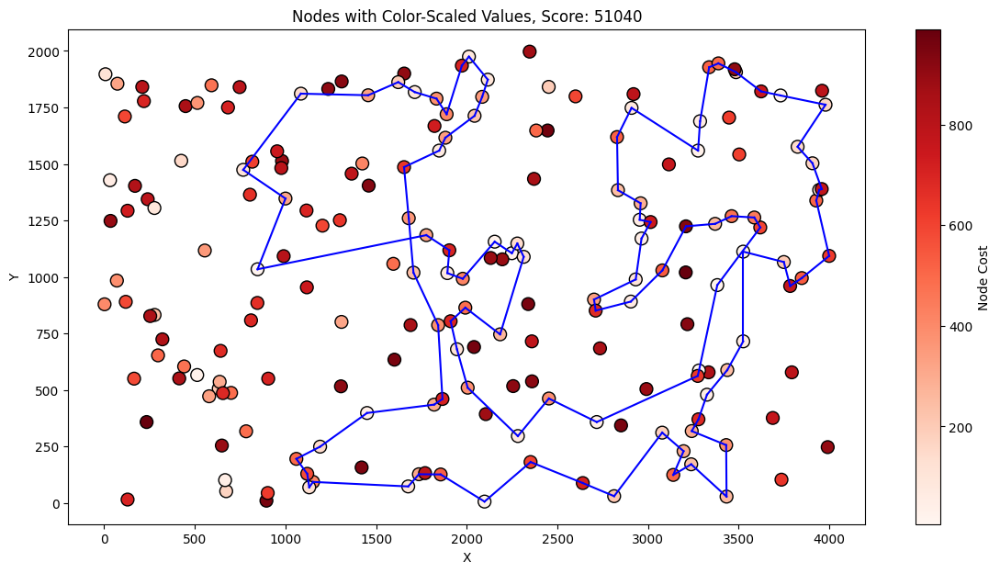

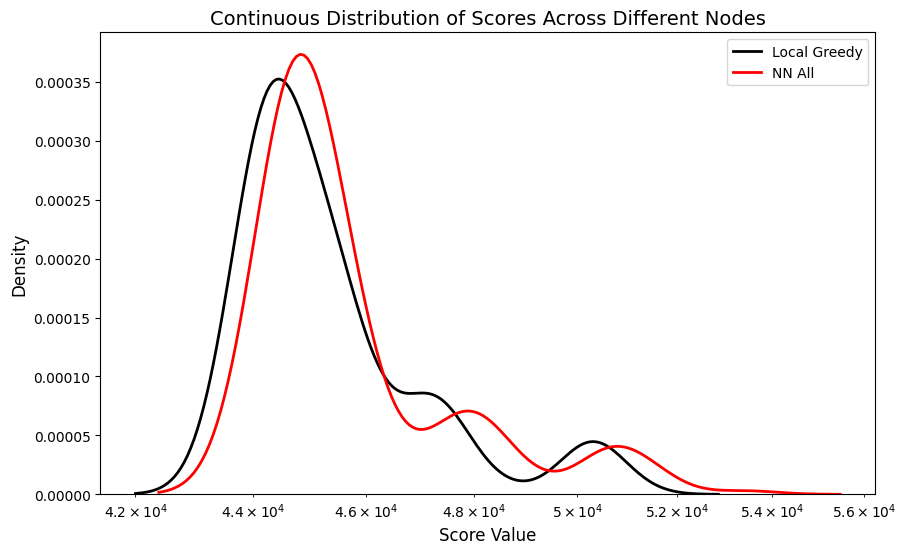

Overall Stats: 
 Minimum: 43826 Maximum: 51040 Median: 44741.0 Mean: 45463.615 Standard Deviation: 1749.9785932333573
Time Stats: 
 Minimum: 0.04192543029785156 Maximum: 0.2937464714050293 Median: 0.08342909812927246 Mean: 0.09060073137283325 Standard Deviation: 0.035218350331692704
Comparison Stats: 
 Minimum: 13 Maximum: 3061 Median: 307.5 Mean: 406.64 Standard Deviation: 453.55927991829253 and Relative: 0.008677154401951565


In [53]:
plot_score_distribution(nn_greedy_local_result_B, label="NN All + Greedy Local Search", title = "Score Distribution For NN All + Greedy Local Search", x_label = "score")
plot_score_distribution(nn_greedy_local_times_B, label="Times NN All + Greedy Local Search", title = "Time Distribution For NN All + Greedy Local Search", x_label = "time")
plot_best_overall(df_B, nn_greedy_local_solution_B, nn_greedy_local_result_B)
plot_average_overall(df_B, nn_greedy_local_solution_B, nn_greedy_local_result_B)
plot_worst_overall(df_B, nn_greedy_local_solution_B, nn_greedy_local_result_B)
plot_score_distributions(nn_greedy_local_result_B, nn_greedy_local_intermidiate_B, labels = ["Local Greedy", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_greedy_local_intermidiate_B, nn_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

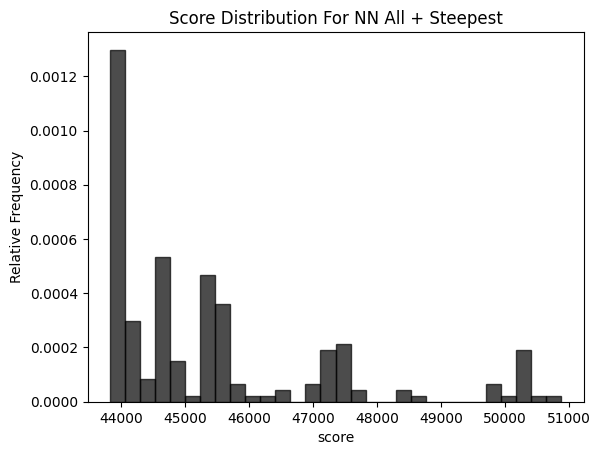

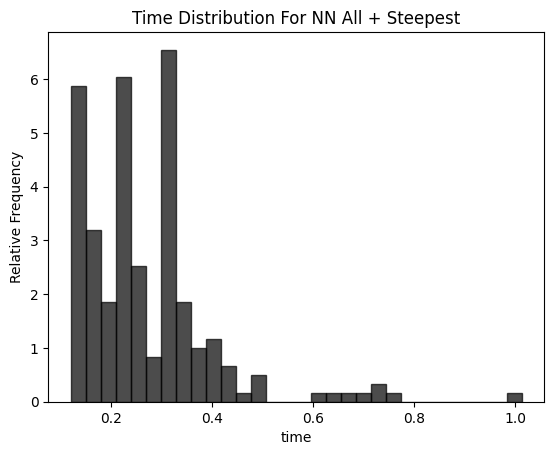

___________________________________________________________________
For Node: 1


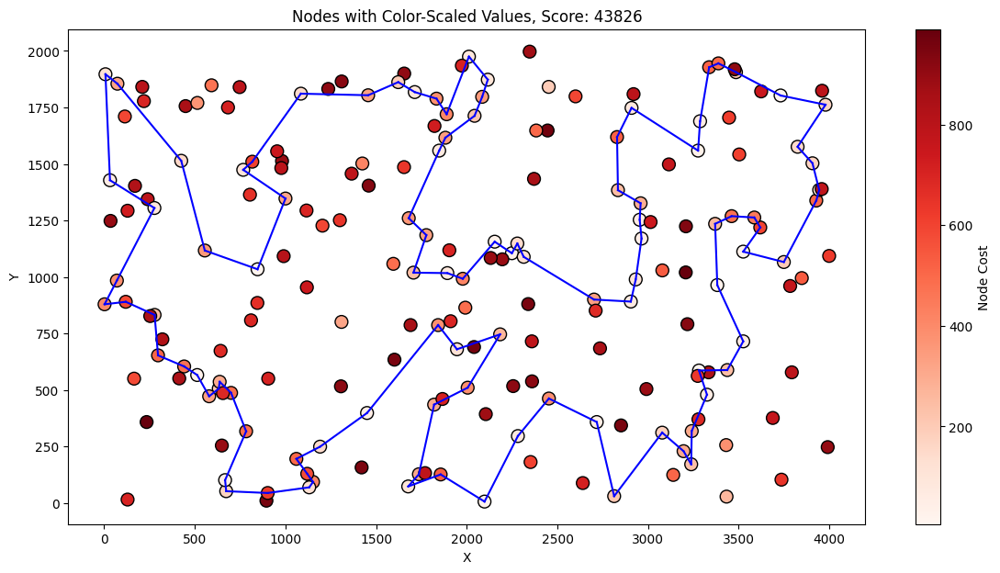

Best solution: [131, 122, 107, 40, 63, 135, 38, 27, 16, 1, 156, 198, 117, 193, 31, 54, 73, 136, 190, 80, 162, 175, 78, 142, 45, 5, 177, 104, 8, 111, 82, 21, 61, 36, 91, 141, 77, 81, 153, 187, 163, 89, 127, 103, 113, 176, 194, 166, 86, 95, 130, 99, 22, 185, 179, 66, 94, 47, 148, 60, 20, 28, 149, 4, 140, 183, 152, 170, 34, 55, 18, 62, 124, 106, 143, 35, 109, 0, 29, 160, 33, 138, 11, 139, 168, 195, 145, 15, 3, 70, 13, 132, 169, 188, 6, 147, 191, 90, 51, 121]
___________________________________________________________________
For Node: 19


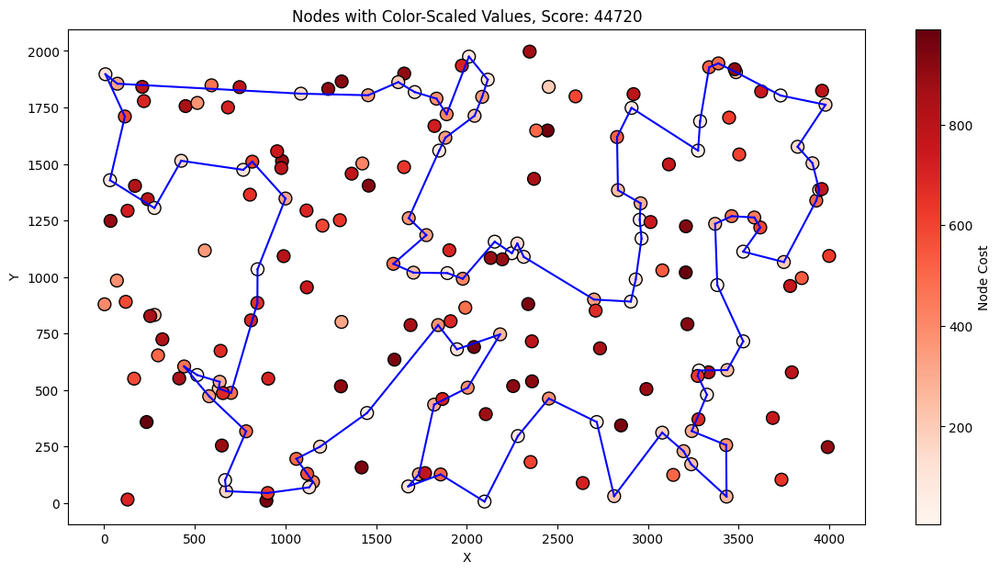

___________________________________________________________________
For Node: 108


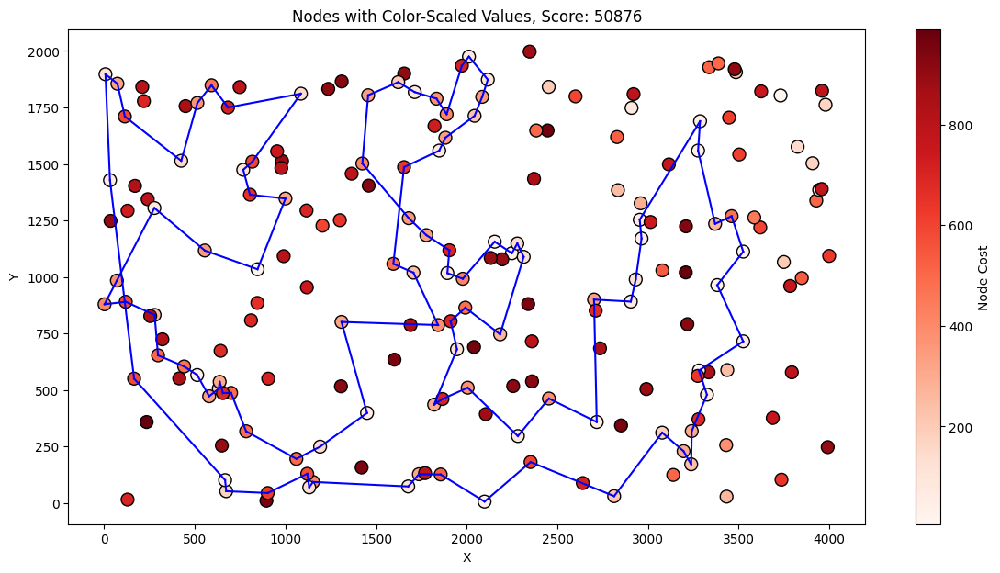

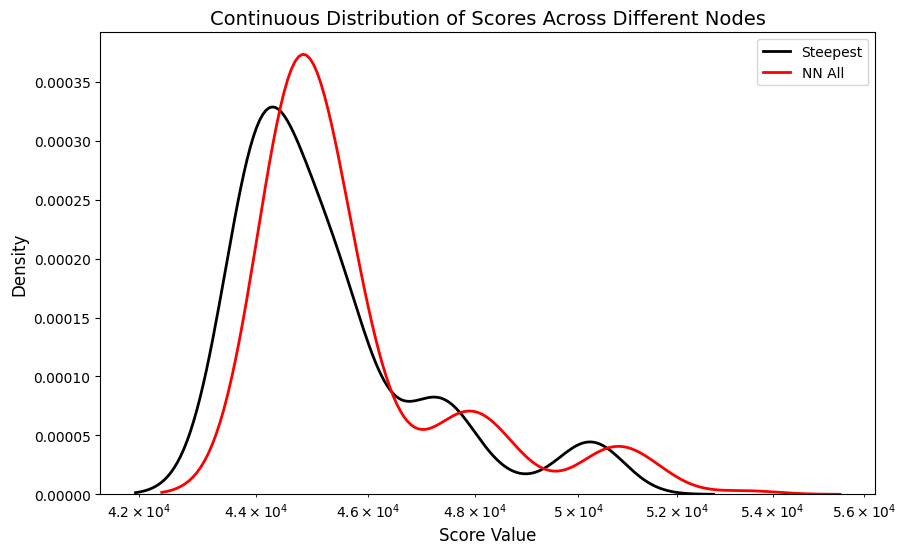

Overall Stats: 
 Minimum: 43826 Maximum: 50876 Median: 44720.0 Mean: 45414.5 Standard Deviation: 1799.8943135639936
Time Stats: 
 Minimum: 0.11968207359313965 Maximum: 1.0130982398986816 Median: 0.2378392219543457 Mean: 0.26764693975448606 Standard Deviation: 0.13105020966911704
Comparison Stats: 
 Minimum: 13 Maximum: 3061 Median: 420.0 Mean: 455.755 Standard Deviation: 445.8440366036087 and Relative: 0.009793104590794393


In [54]:
plot_score_distribution(nn_steepest_result_B, label="NN All + Steepest", title = "Score Distribution For NN All + Steepest", x_label = "score")
plot_score_distribution(nn_steepest_times_B, label="Times NN All + Steepest", title = "Time Distribution For NN All + Steepest", x_label = "time")
plot_best_overall(df_B, nn_steepest_solution_B, nn_steepest_result_B)
plot_average_overall(df_B, nn_steepest_solution_B, nn_steepest_result_B)
plot_worst_overall(df_B, nn_steepest_solution_B, nn_steepest_result_B)
plot_score_distributions(nn_steepest_result_B, nn_steepest_intermidiate_B, labels = ["Steepest", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_steepest_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_steepest_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_steepest_intermidiate_B, nn_steepest_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

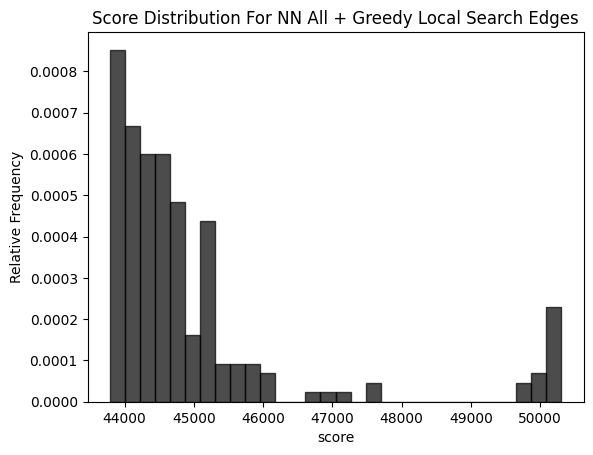

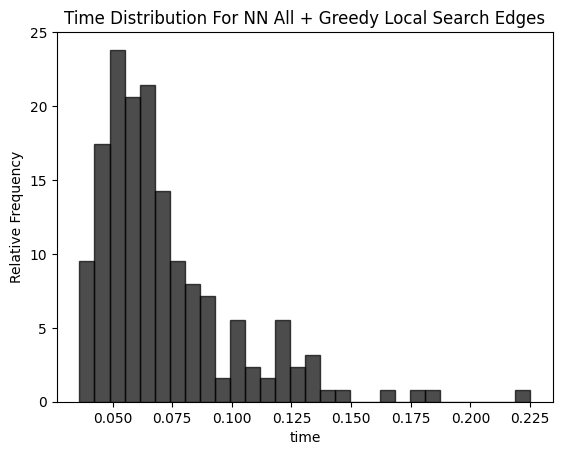

___________________________________________________________________
For Node: 156


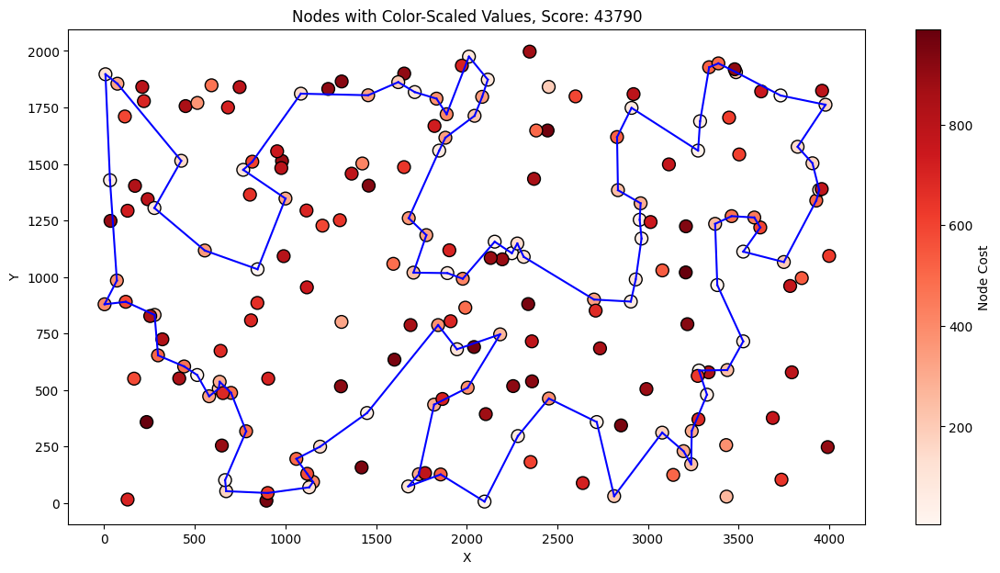

Best solution: [40, 107, 122, 135, 131, 121, 51, 90, 191, 147, 6, 188, 169, 132, 13, 70, 3, 15, 145, 195, 168, 139, 11, 138, 33, 160, 29, 0, 109, 35, 143, 106, 124, 62, 18, 55, 34, 170, 152, 183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 179, 185, 22, 99, 130, 95, 86, 166, 194, 176, 113, 103, 127, 89, 163, 187, 153, 81, 77, 141, 91, 36, 61, 21, 82, 111, 8, 104, 177, 5, 45, 142, 78, 175, 162, 80, 190, 136, 73, 54, 31, 193, 117, 198, 156, 1, 16, 27, 38, 63]
___________________________________________________________________
For Node: 51


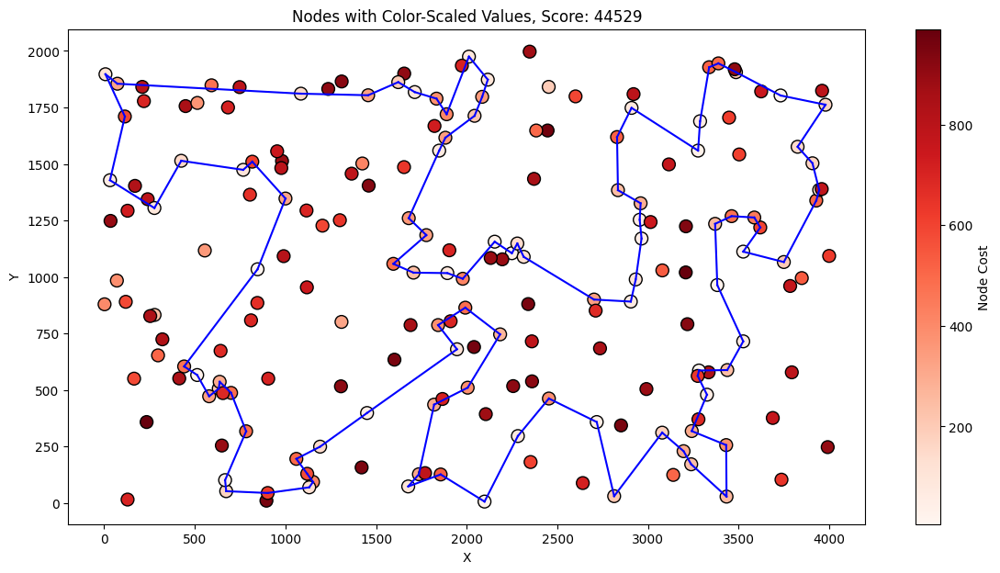

___________________________________________________________________
For Node: 181


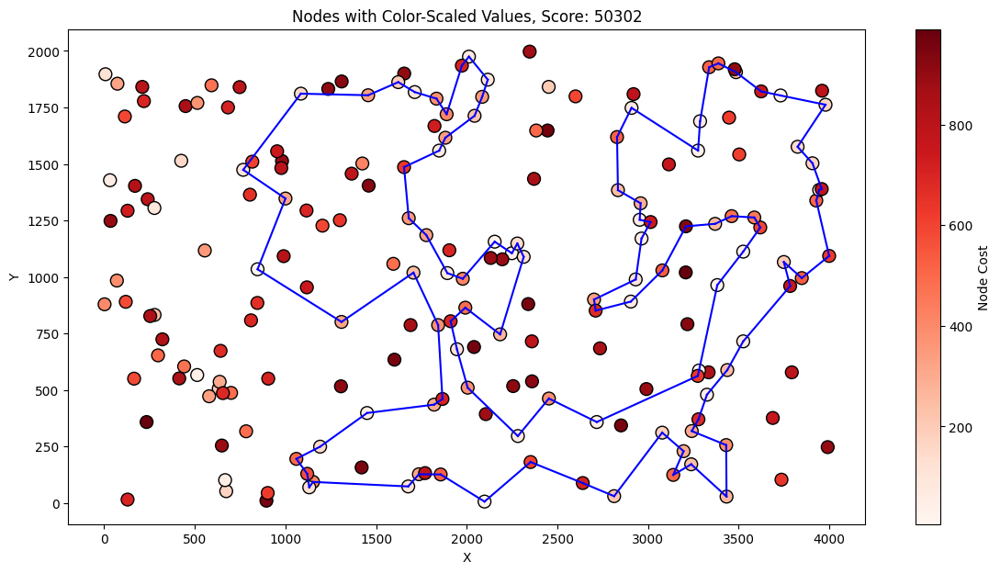

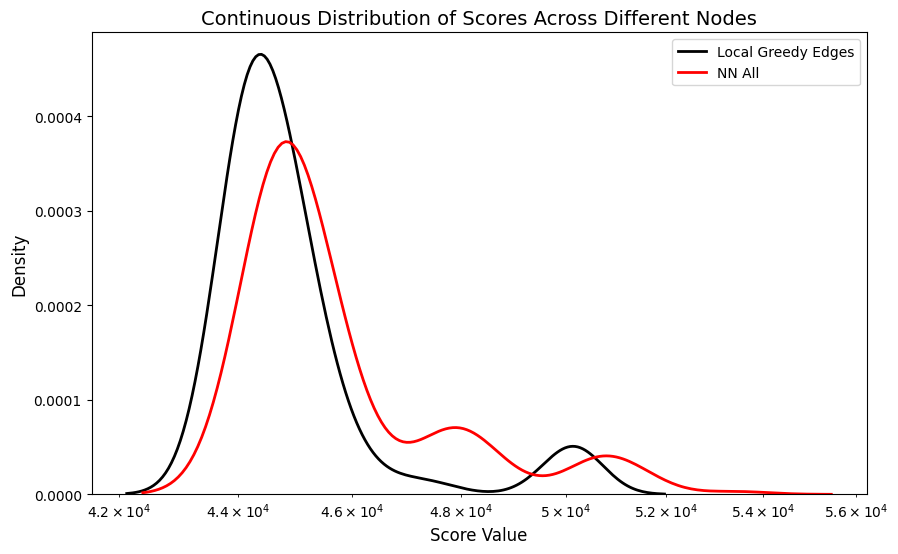

Overall Stats: 
 Minimum: 43790 Maximum: 50302 Median: 44529.0 Mean: 45020.47 Standard Deviation: 1597.461129135855
Time Stats: 
 Minimum: 0.0361325740814209 Maximum: 0.22513127326965332 Median: 0.06336414813995361 Mean: 0.07199774146080017 Standard Deviation: 0.02952530919313583
Comparison Stats: 
 Minimum: 152 Maximum: 6537 Median: 488.0 Mean: 849.785 Standard Deviation: 964.8624351559138 and Relative: 0.018067300333177175


In [60]:
plot_score_distribution(nn_edges_greedy_local_result_B, label="NN All + Greedy Local Search (Edges)", title = "Score Distribution For NN All + Greedy Local Search Edges", x_label = "score")
plot_score_distribution(nn_edges_greedy_local_times_B, label="Times NN All + Greedy Local Search (Edges)", title = "Time Distribution For NN All + Greedy Local Search Edges", x_label = "time")
plot_best_overall(df_B, nn_edges_greedy_local_solution_B, nn_edges_greedy_local_result_B)
plot_average_overall(df_B, nn_edges_greedy_local_solution_B, nn_edges_greedy_local_result_B)
plot_worst_overall(df_B, nn_edges_greedy_local_solution_B, nn_edges_greedy_local_result_B)
plot_score_distributions(nn_edges_greedy_local_result_B, nn_edges_greedy_local_intermidiate_B, labels = ["Local Greedy Edges", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_edges_greedy_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_edges_greedy_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_edges_greedy_local_intermidiate_B, nn_edges_greedy_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

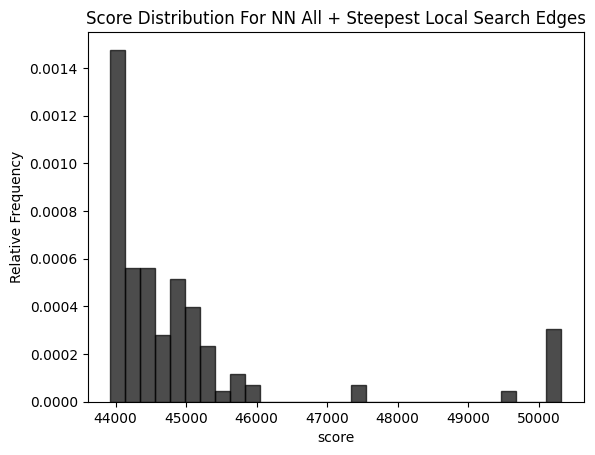

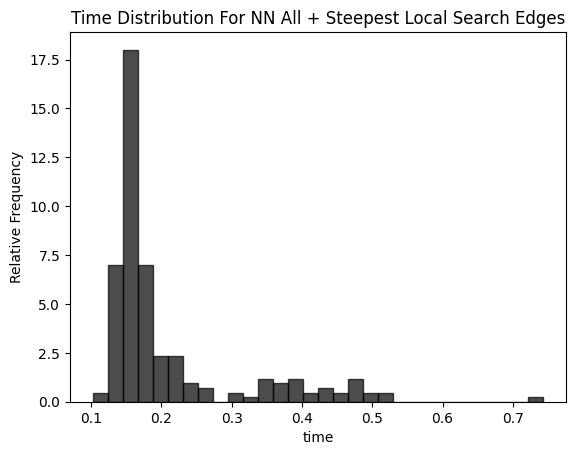

___________________________________________________________________
For Node: 22


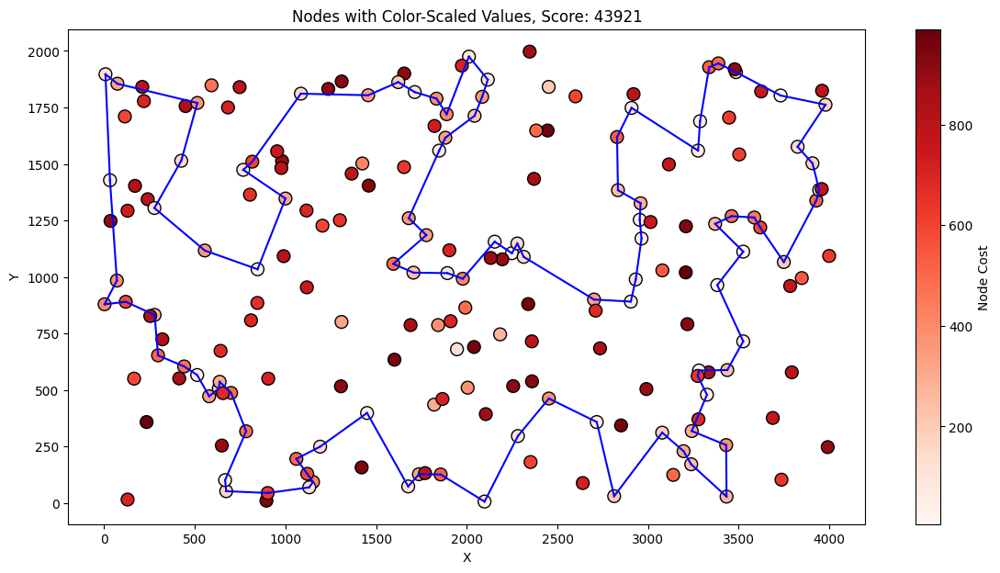

Best solution: [131, 121, 51, 90, 191, 147, 6, 188, 169, 132, 13, 70, 3, 15, 145, 195, 168, 139, 11, 182, 138, 33, 160, 29, 0, 109, 35, 143, 106, 124, 62, 18, 55, 34, 170, 152, 183, 140, 4, 149, 28, 20, 60, 148, 47, 94, 66, 179, 22, 99, 130, 95, 185, 86, 166, 194, 176, 180, 113, 103, 114, 137, 127, 89, 163, 187, 153, 81, 77, 141, 91, 61, 36, 177, 5, 45, 142, 78, 175, 162, 80, 190, 136, 73, 54, 31, 193, 117, 198, 156, 1, 16, 27, 38, 63, 40, 107, 133, 122, 135]
___________________________________________________________________
For Node: 125


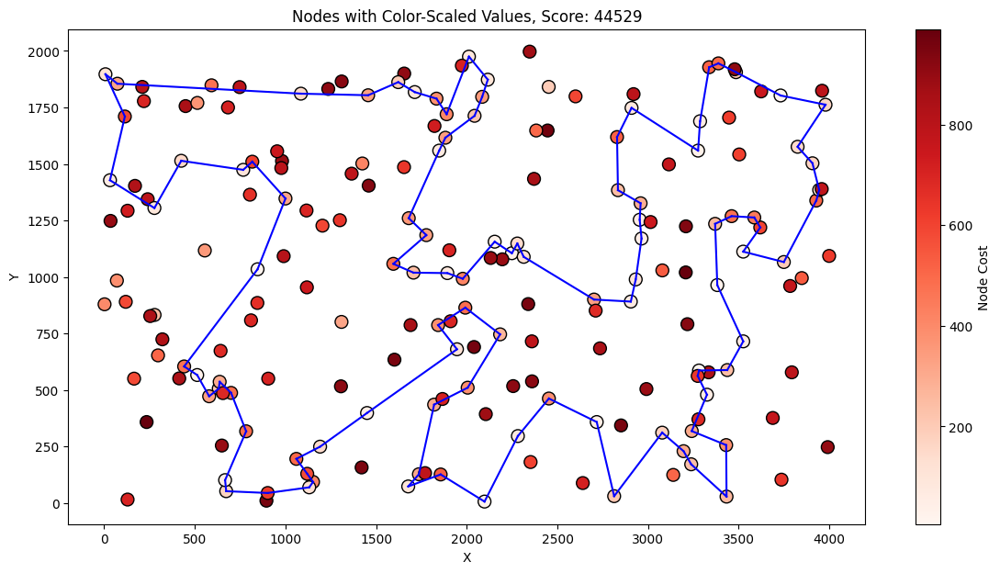

___________________________________________________________________
For Node: 181


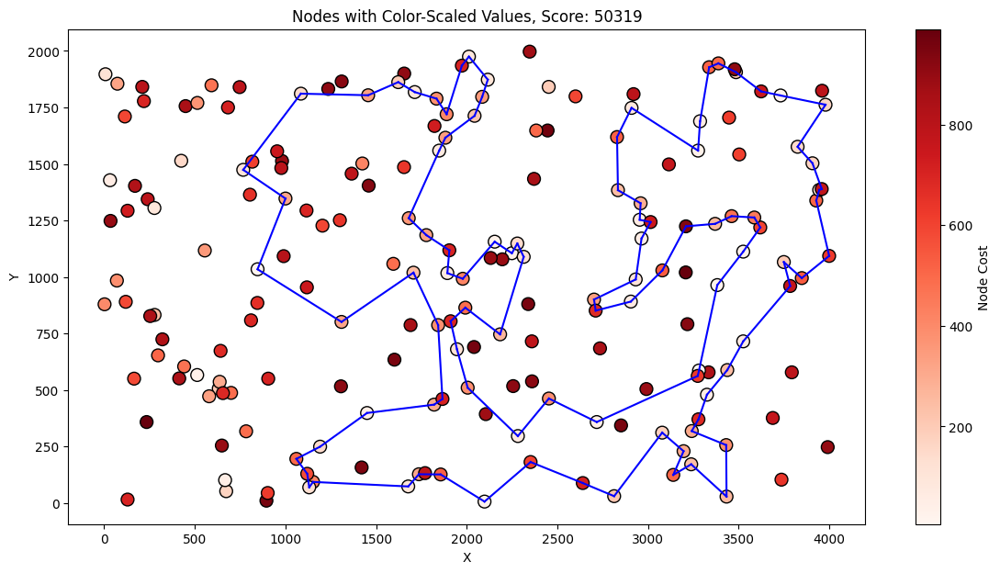

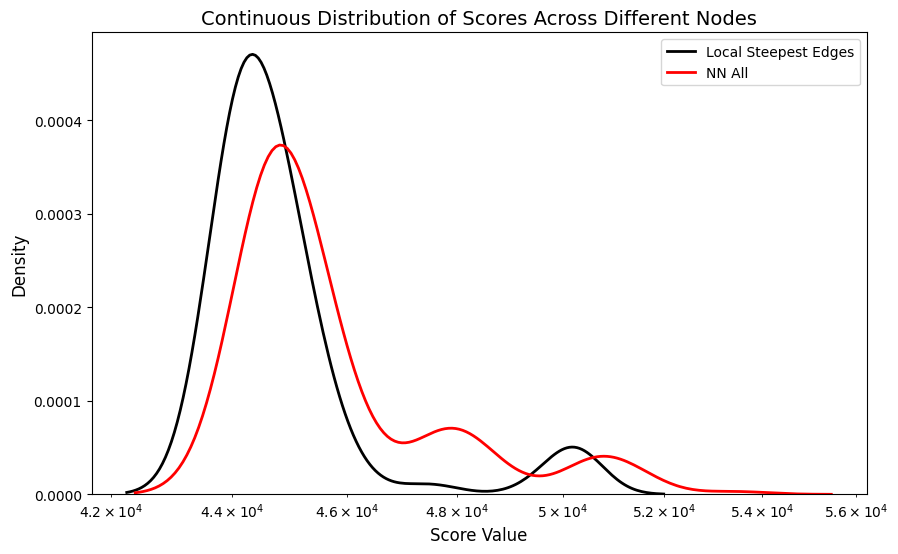

Overall Stats: 
 Minimum: 43921 Maximum: 50319 Median: 44529.0 Mean: 44976.435 Standard Deviation: 1601.4280020578508
Time Stats: 
 Minimum: 0.10216999053955078 Maximum: 0.7436327934265137 Median: 0.16146385669708252 Mean: 0.20877230048179626 Standard Deviation: 0.10465084038387111
Comparison Stats: 
 Minimum: 152 Maximum: 5405 Median: 488.0 Mean: 893.82 Standard Deviation: 1018.2034755391478 and Relative: 0.019005533934468098


In [62]:
plot_score_distribution(nn_edges_steepest_local_result_B, label="NN All + Steepest Local Search (Edges)", title = "Score Distribution For NN All + Steepest Local Search Edges", x_label = "score")
plot_score_distribution(nn_edges_steepest_local_times_B, label="Times NN All + Steepest Local Search (Edges)", title = "Time Distribution For NN All + Steepest Local Search Edges", x_label = "time")
plot_best_overall(df_B, nn_edges_steepest_local_solution_B, nn_edges_steepest_local_result_B)
plot_average_overall(df_B, nn_edges_steepest_local_solution_B, nn_edges_steepest_local_result_B)
plot_worst_overall(df_B, nn_edges_steepest_local_solution_B, nn_edges_steepest_local_result_B)
plot_score_distributions(nn_edges_steepest_local_result_B, nn_edges_steepest_local_intermidiate_B, labels = ["Local Steepest Edges", "NN All"])
min_score, max_score, median_score, mean_score, std_score = calculate_stats_overall(nn_edges_steepest_local_result_B)
min_time, max_time, median_time, mean_time, std_time = calculate_stats_overall(nn_edges_steepest_local_times_B)
min_val, max_val, mean, median, std, relative = compare_improvement(nn_edges_steepest_local_intermidiate_B, nn_edges_steepest_local_result_B)
print(f"Overall Stats: \n Minimum: {min_score} Maximum: {max_score} Median: {median_score} Mean: {mean_score} Standard Deviation: {std_score}")
print(f"Time Stats: \n Minimum: {min_time} Maximum: {max_time} Median: {median_time} Mean: {mean_time} Standard Deviation: {std_time}")
print(f"Comparison Stats: \n Minimum: {min_val} Maximum: {max_val} Median: {median} Mean: {mean} Standard Deviation: {std} and Relative: {relative}")

## Comparing Both Instances

In [57]:
def plot_all_distributions(score_dict_1, score_dict_2, score_dict_3, score_dict_4, labels):
    all_scores_1 = []
    for key in score_dict_1.keys():
        item = score_dict_1[key]
        all_scores_1.append(item)

    all_scores_2 = []
    for key in score_dict_2.keys():
        item = score_dict_2[key]
        all_scores_2.append(item)

    all_scores_3 = []
    for key in score_dict_3.keys():
        item = score_dict_3[key]
        all_scores_3.append(item)

    all_scores_4 = []
    for key in score_dict_4.keys():
        item = score_dict_4[key]
        all_scores_4.append(item)
    
    plt.figure(figsize=(18, 12))

    all_scores_1 = np.array(all_scores_1)
    all_scores_2 = np.array(all_scores_2)
    all_scores_3 = np.array(all_scores_3)
    all_scores_4 = np.array(all_scores_4)

    to_plot = [np.mean(all_scores_1), np.mean(all_scores_2), np.mean(all_scores_3), np.mean(all_scores_4)]
    sorted_indices = np.argsort(to_plot)[::-1]
    to_plot_sorted = np.array(to_plot)[sorted_indices]
    labels_sorted = np.array(labels)[sorted_indices]

    # Plotting the bar chart
    plt.figure(figsize=(12, 5))
    plt.yscale('log')
    plt.bar(labels_sorted, to_plot_sorted, color=['blue', 'red', 'green', 'black'])

    # Adding title and labels
    plt.title('Comparison of Mean Scores Across Different TSP Algorithms', fontsize=14)
    plt.xlabel('TSP Algorithms', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('Mean Score Logarithmic Scale)', fontsize=12)

<Figure size 1800x1200 with 0 Axes>

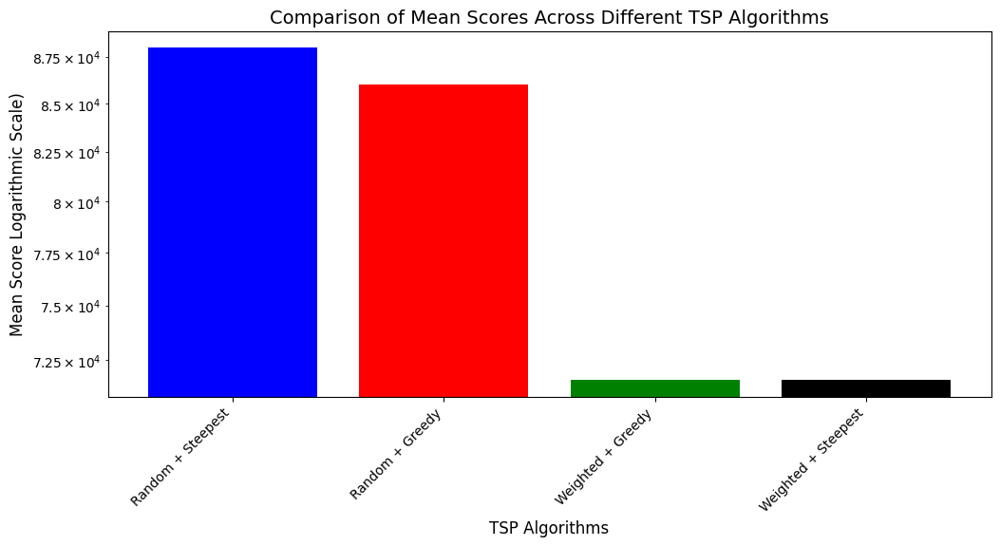

In [58]:
plot_all_distributions(random_greedy_local_result_A, random_steepest_result_A, weighted_greedy_local_result_A, weighted_steepest_result_A, labels = ["Random + Greedy", "Random + Steepest", "Weighted + Greedy", "Weighted + Steepest"])

<Figure size 1800x1200 with 0 Axes>

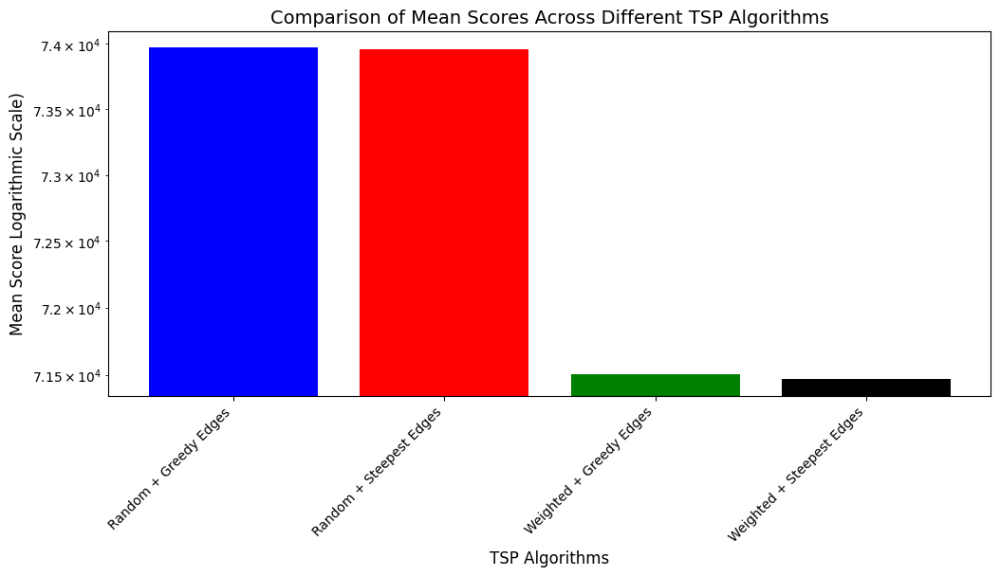

In [64]:
plot_all_distributions(random_edge_greedy_local_result_A, random_edge_steepest_local_result_A, weighted_edges_greedy_local_result_A, weighted_edges_steepest_local_result_A, labels = ["Random + Greedy Edges", "Random + Steepest Edges", "Weighted + Greedy Edges", "Weighted + Steepest Edges"])

<Figure size 1800x1200 with 0 Axes>

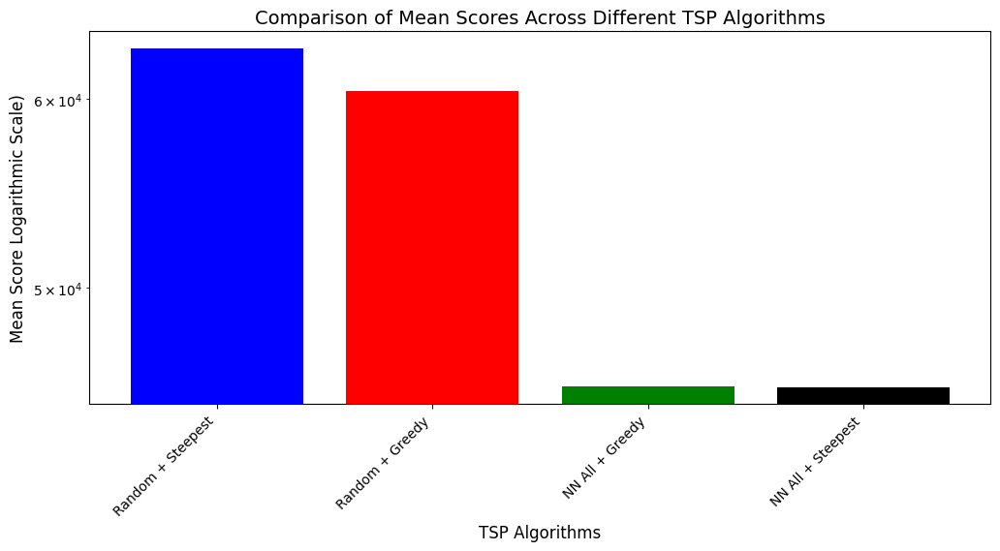

In [59]:
plot_all_distributions(random_greedy_local_result_B, random_steepest_result_B, nn_greedy_local_result_B, nn_steepest_result_B, labels = ["Random + Greedy", "Random + Steepest", "NN All + Greedy", "NN All + Steepest"])

<Figure size 1800x1200 with 0 Axes>

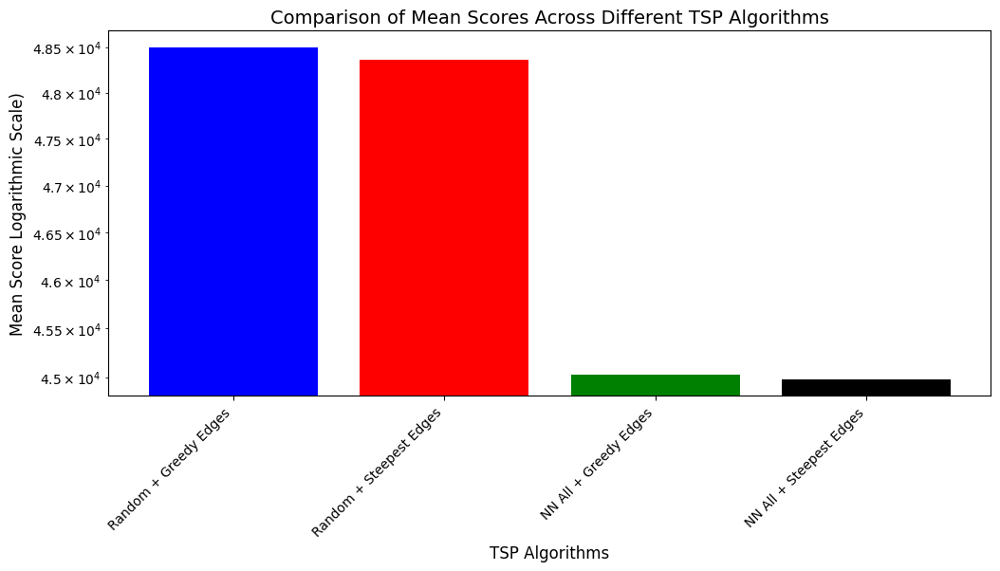

In [65]:
plot_all_distributions(random_edge_greedy_local_result_B, random_edge_steepest_local_result_B, nn_edges_greedy_local_result_B, nn_edges_steepest_local_result_B, labels = ["Random + Greedy Edges", "Random + Steepest Edges", "NN All + Greedy Edges", "NN All + Steepest Edges"])